# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: False


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
d = {i: ind for ind, i in enumerate(sorted(adata.obs["age"].astype(float).unique()))}
adata.obs["age_training"] = [d[float(i)] for i in adata.obs["age"]]
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical', 'age_training'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_training",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=False
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_7_encode"
)

vae.save(
    dir_path,
    overwrite=True,
)

W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: s685vgj5
Name: comfy-night-581
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/s685vgj5
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240506_182846-s685vgj5/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `training` set. Number of elements in each group: 6699,15174,18898,4794,7550,5843
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_training` for `validation` set. Number of elements in each group: 1645,3791,4714,1219,1894,1476
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:37<6:18:14, 37.89s/it]

Epoch 1/600:   0%|          | 1/600 [00:37<6:18:14, 37.89s/it, v_num=j5_1, total_loss_train=593, kl_local_train=38.2]

Epoch 2/600:   0%|          | 1/600 [00:37<6:18:14, 37.89s/it, v_num=j5_1, total_loss_train=593, kl_local_train=38.2]

Epoch 2/600:   0%|          | 2/600 [01:13<6:02:53, 36.41s/it, v_num=j5_1, total_loss_train=593, kl_local_train=38.2]

Epoch 2/600:   0%|          | 2/600 [01:13<6:02:53, 36.41s/it, v_num=j5_1, total_loss_train=456, kl_local_train=58.3]

Epoch 3/600:   0%|          | 2/600 [01:13<6:02:53, 36.41s/it, v_num=j5_1, total_loss_train=456, kl_local_train=58.3]

Epoch 3/600:   0%|          | 3/600 [01:46<5:49:06, 35.09s/it, v_num=j5_1, total_loss_train=456, kl_local_train=58.3]

Epoch 3/600:   0%|          | 3/600 [01:46<5:49:06, 35.09s/it, v_num=j5_1, total_loss_train=439, kl_local_train=64.1]

Epoch 4/600:   0%|          | 3/600 [01:46<5:49:06, 35.09s/it, v_num=j5_1, total_loss_train=439, kl_local_train=64.1]

Epoch 4/600:   1%|          | 4/600 [02:24<6:00:24, 36.28s/it, v_num=j5_1, total_loss_train=439, kl_local_train=64.1]

Epoch 4/600:   1%|          | 4/600 [02:24<6:00:24, 36.28s/it, v_num=j5_1, total_loss_train=432, kl_local_train=65.4]

Epoch 5/600:   1%|          | 4/600 [02:24<6:00:24, 36.28s/it, v_num=j5_1, total_loss_train=432, kl_local_train=65.4]

Epoch 5/600:   1%|          | 5/600 [03:01<6:00:59, 36.40s/it, v_num=j5_1, total_loss_train=432, kl_local_train=65.4]

Epoch 5/600:   1%|          | 5/600 [03:01<6:00:59, 36.40s/it, v_num=j5_1, total_loss_train=428, kl_local_train=65.1]

Epoch 6/600:   1%|          | 5/600 [03:02<6:00:59, 36.40s/it, v_num=j5_1, total_loss_train=428, kl_local_train=65.1]

Epoch 6/600:   1%|          | 6/600 [03:33<5:45:52, 34.94s/it, v_num=j5_1, total_loss_train=428, kl_local_train=65.1]

Epoch 6/600:   1%|          | 6/600 [03:33<5:45:52, 34.94s/it, v_num=j5_1, total_loss_train=425, kl_local_train=63.5, metric_mi|age_categorical_train=0.0741]

Epoch 7/600:   1%|          | 6/600 [03:33<5:45:52, 34.94s/it, v_num=j5_1, total_loss_train=425, kl_local_train=63.5, metric_mi|age_categorical_train=0.0741]

Epoch 7/600:   1%|          | 7/600 [04:04<5:31:55, 33.58s/it, v_num=j5_1, total_loss_train=425, kl_local_train=63.5, metric_mi|age_categorical_train=0.0741]

Epoch 7/600:   1%|          | 7/600 [04:04<5:31:55, 33.58s/it, v_num=j5_1, total_loss_train=423, kl_local_train=62.1, metric_mi|age_categorical_train=0.0741]

Epoch 8/600:   1%|          | 7/600 [04:04<5:31:55, 33.58s/it, v_num=j5_1, total_loss_train=423, kl_local_train=62.1, metric_mi|age_categorical_train=0.0741]

Epoch 8/600:   1%|▏         | 8/600 [04:35<5:22:37, 32.70s/it, v_num=j5_1, total_loss_train=423, kl_local_train=62.1, metric_mi|age_categorical_train=0.0741]

Epoch 8/600:   1%|▏         | 8/600 [04:35<5:22:37, 32.70s/it, v_num=j5_1, total_loss_train=427, kl_local_train=55.9, metric_mi|age_categorical_train=0.0741]

Epoch 9/600:   1%|▏         | 8/600 [04:35<5:22:37, 32.70s/it, v_num=j5_1, total_loss_train=427, kl_local_train=55.9, metric_mi|age_categorical_train=0.0741]

Epoch 9/600:   2%|▏         | 9/600 [05:05<5:15:59, 32.08s/it, v_num=j5_1, total_loss_train=427, kl_local_train=55.9, metric_mi|age_categorical_train=0.0741]

Epoch 9/600:   2%|▏         | 9/600 [05:05<5:15:59, 32.08s/it, v_num=j5_1, total_loss_train=430, kl_local_train=48.3, metric_mi|age_categorical_train=0.0741]

Epoch 10/600:   2%|▏         | 9/600 [05:05<5:15:59, 32.08s/it, v_num=j5_1, total_loss_train=430, kl_local_train=48.3, metric_mi|age_categorical_train=0.0741]

Epoch 10/600:   2%|▏         | 10/600 [05:37<5:14:34, 31.99s/it, v_num=j5_1, total_loss_train=430, kl_local_train=48.3, metric_mi|age_categorical_train=0.0741]

Epoch 10/600:   2%|▏         | 10/600 [05:37<5:14:34, 31.99s/it, v_num=j5_1, total_loss_train=433, kl_local_train=51.6, metric_mi|age_categorical_train=0.0741]

Epoch 11/600:   2%|▏         | 10/600 [05:38<5:14:34, 31.99s/it, v_num=j5_1, total_loss_train=433, kl_local_train=51.6, metric_mi|age_categorical_train=0.0741]

Epoch 11/600:   2%|▏         | 11/600 [06:09<5:12:00, 31.78s/it, v_num=j5_1, total_loss_train=433, kl_local_train=51.6, metric_mi|age_categorical_train=0.0741]

Epoch 11/600:   2%|▏         | 11/600 [06:09<5:12:00, 31.78s/it, v_num=j5_1, total_loss_train=435, kl_local_train=80.6, metric_mi|age_categorical_train=0.0798]

Epoch 12/600:   2%|▏         | 11/600 [06:09<5:12:00, 31.78s/it, v_num=j5_1, total_loss_train=435, kl_local_train=80.6, metric_mi|age_categorical_train=0.0798]

Epoch 12/600:   2%|▏         | 12/600 [06:39<5:08:50, 31.51s/it, v_num=j5_1, total_loss_train=435, kl_local_train=80.6, metric_mi|age_categorical_train=0.0798]

Epoch 12/600:   2%|▏         | 12/600 [06:39<5:08:50, 31.51s/it, v_num=j5_1, total_loss_train=435, kl_local_train=115, metric_mi|age_categorical_train=0.0798] 

Epoch 13/600:   2%|▏         | 12/600 [06:39<5:08:50, 31.51s/it, v_num=j5_1, total_loss_train=435, kl_local_train=115, metric_mi|age_categorical_train=0.0798]

Epoch 13/600:   2%|▏         | 13/600 [07:11<5:07:10, 31.40s/it, v_num=j5_1, total_loss_train=435, kl_local_train=115, metric_mi|age_categorical_train=0.0798]

Epoch 13/600:   2%|▏         | 13/600 [07:11<5:07:10, 31.40s/it, v_num=j5_1, total_loss_train=436, kl_local_train=121, metric_mi|age_categorical_train=0.0798]

Epoch 14/600:   2%|▏         | 13/600 [07:11<5:07:10, 31.40s/it, v_num=j5_1, total_loss_train=436, kl_local_train=121, metric_mi|age_categorical_train=0.0798]

Epoch 14/600:   2%|▏         | 14/600 [07:41<5:05:10, 31.25s/it, v_num=j5_1, total_loss_train=436, kl_local_train=121, metric_mi|age_categorical_train=0.0798]

Epoch 14/600:   2%|▏         | 14/600 [07:41<5:05:10, 31.25s/it, v_num=j5_1, total_loss_train=437, kl_local_train=129, metric_mi|age_categorical_train=0.0798]

Epoch 15/600:   2%|▏         | 14/600 [07:41<5:05:10, 31.25s/it, v_num=j5_1, total_loss_train=437, kl_local_train=129, metric_mi|age_categorical_train=0.0798]

Epoch 15/600:   2%|▎         | 15/600 [08:14<5:08:01, 31.59s/it, v_num=j5_1, total_loss_train=437, kl_local_train=129, metric_mi|age_categorical_train=0.0798]

Epoch 15/600:   2%|▎         | 15/600 [08:14<5:08:01, 31.59s/it, v_num=j5_1, total_loss_train=438, kl_local_train=124, metric_mi|age_categorical_train=0.0798]

Epoch 16/600:   2%|▎         | 15/600 [08:14<5:08:01, 31.59s/it, v_num=j5_1, total_loss_train=438, kl_local_train=124, metric_mi|age_categorical_train=0.0798]

Epoch 16/600:   3%|▎         | 16/600 [08:45<5:06:34, 31.50s/it, v_num=j5_1, total_loss_train=438, kl_local_train=124, metric_mi|age_categorical_train=0.0798]

Epoch 16/600:   3%|▎         | 16/600 [08:45<5:06:34, 31.50s/it, v_num=j5_1, total_loss_train=440, kl_local_train=124, metric_mi|age_categorical_train=0.133] 

Epoch 17/600:   3%|▎         | 16/600 [08:45<5:06:34, 31.50s/it, v_num=j5_1, total_loss_train=440, kl_local_train=124, metric_mi|age_categorical_train=0.133]

Epoch 17/600:   3%|▎         | 17/600 [09:17<5:06:05, 31.50s/it, v_num=j5_1, total_loss_train=440, kl_local_train=124, metric_mi|age_categorical_train=0.133]

Epoch 17/600:   3%|▎         | 17/600 [09:17<5:06:05, 31.50s/it, v_num=j5_1, total_loss_train=441, kl_local_train=124, metric_mi|age_categorical_train=0.133]

Epoch 18/600:   3%|▎         | 17/600 [09:17<5:06:05, 31.50s/it, v_num=j5_1, total_loss_train=441, kl_local_train=124, metric_mi|age_categorical_train=0.133]

Epoch 18/600:   3%|▎         | 18/600 [09:48<5:04:08, 31.36s/it, v_num=j5_1, total_loss_train=441, kl_local_train=124, metric_mi|age_categorical_train=0.133]

Epoch 18/600:   3%|▎         | 18/600 [09:48<5:04:08, 31.36s/it, v_num=j5_1, total_loss_train=442, kl_local_train=121, metric_mi|age_categorical_train=0.133]

Epoch 19/600:   3%|▎         | 18/600 [09:48<5:04:08, 31.36s/it, v_num=j5_1, total_loss_train=442, kl_local_train=121, metric_mi|age_categorical_train=0.133]

Epoch 19/600:   3%|▎         | 19/600 [10:18<5:01:52, 31.17s/it, v_num=j5_1, total_loss_train=442, kl_local_train=121, metric_mi|age_categorical_train=0.133]

Epoch 19/600:   3%|▎         | 19/600 [10:18<5:01:52, 31.17s/it, v_num=j5_1, total_loss_train=443, kl_local_train=125, metric_mi|age_categorical_train=0.133]

Epoch 20/600:   3%|▎         | 19/600 [10:18<5:01:52, 31.17s/it, v_num=j5_1, total_loss_train=443, kl_local_train=125, metric_mi|age_categorical_train=0.133]

Epoch 20/600:   3%|▎         | 20/600 [10:51<5:05:44, 31.63s/it, v_num=j5_1, total_loss_train=443, kl_local_train=125, metric_mi|age_categorical_train=0.133]

Epoch 20/600:   3%|▎         | 20/600 [10:51<5:05:44, 31.63s/it, v_num=j5_1, total_loss_train=444, kl_local_train=132, metric_mi|age_categorical_train=0.133]

Epoch 21/600:   3%|▎         | 20/600 [10:52<5:05:44, 31.63s/it, v_num=j5_1, total_loss_train=444, kl_local_train=132, metric_mi|age_categorical_train=0.133]

Epoch 21/600:   4%|▎         | 21/600 [11:22<5:04:33, 31.56s/it, v_num=j5_1, total_loss_train=444, kl_local_train=132, metric_mi|age_categorical_train=0.133]

Epoch 21/600:   4%|▎         | 21/600 [11:22<5:04:33, 31.56s/it, v_num=j5_1, total_loss_train=445, kl_local_train=131, metric_mi|age_categorical_train=0.182]

Epoch 22/600:   4%|▎         | 21/600 [11:22<5:04:33, 31.56s/it, v_num=j5_1, total_loss_train=445, kl_local_train=131, metric_mi|age_categorical_train=0.182]

Epoch 22/600:   4%|▎         | 22/600 [11:54<5:02:54, 31.44s/it, v_num=j5_1, total_loss_train=445, kl_local_train=131, metric_mi|age_categorical_train=0.182]

Epoch 22/600:   4%|▎         | 22/600 [11:54<5:02:54, 31.44s/it, v_num=j5_1, total_loss_train=446, kl_local_train=123, metric_mi|age_categorical_train=0.182]

Epoch 23/600:   4%|▎         | 22/600 [11:54<5:02:54, 31.44s/it, v_num=j5_1, total_loss_train=446, kl_local_train=123, metric_mi|age_categorical_train=0.182]

Epoch 23/600:   4%|▍         | 23/600 [12:24<5:00:03, 31.20s/it, v_num=j5_1, total_loss_train=446, kl_local_train=123, metric_mi|age_categorical_train=0.182]

Epoch 23/600:   4%|▍         | 23/600 [12:24<5:00:03, 31.20s/it, v_num=j5_1, total_loss_train=447, kl_local_train=127, metric_mi|age_categorical_train=0.182]

Epoch 24/600:   4%|▍         | 23/600 [12:24<5:00:03, 31.20s/it, v_num=j5_1, total_loss_train=447, kl_local_train=127, metric_mi|age_categorical_train=0.182]

Epoch 24/600:   4%|▍         | 24/600 [12:56<5:00:38, 31.32s/it, v_num=j5_1, total_loss_train=447, kl_local_train=127, metric_mi|age_categorical_train=0.182]

Epoch 24/600:   4%|▍         | 24/600 [12:56<5:00:38, 31.32s/it, v_num=j5_1, total_loss_train=448, kl_local_train=125, metric_mi|age_categorical_train=0.182]

Epoch 25/600:   4%|▍         | 24/600 [12:56<5:00:38, 31.32s/it, v_num=j5_1, total_loss_train=448, kl_local_train=125, metric_mi|age_categorical_train=0.182]

Epoch 25/600:   4%|▍         | 25/600 [13:28<5:01:41, 31.48s/it, v_num=j5_1, total_loss_train=448, kl_local_train=125, metric_mi|age_categorical_train=0.182]

Epoch 25/600:   4%|▍         | 25/600 [13:28<5:01:41, 31.48s/it, v_num=j5_1, total_loss_train=449, kl_local_train=125, metric_mi|age_categorical_train=0.182]

Epoch 26/600:   4%|▍         | 25/600 [13:28<5:01:41, 31.48s/it, v_num=j5_1, total_loss_train=449, kl_local_train=125, metric_mi|age_categorical_train=0.182]

Epoch 26/600:   4%|▍         | 26/600 [13:59<5:00:02, 31.36s/it, v_num=j5_1, total_loss_train=449, kl_local_train=125, metric_mi|age_categorical_train=0.182]

Epoch 26/600:   4%|▍         | 26/600 [13:59<5:00:02, 31.36s/it, v_num=j5_1, total_loss_train=450, kl_local_train=127, metric_mi|age_categorical_train=0.232]

Epoch 27/600:   4%|▍         | 26/600 [13:59<5:00:02, 31.36s/it, v_num=j5_1, total_loss_train=450, kl_local_train=127, metric_mi|age_categorical_train=0.232]

Epoch 27/600:   4%|▍         | 27/600 [14:29<4:57:06, 31.11s/it, v_num=j5_1, total_loss_train=450, kl_local_train=127, metric_mi|age_categorical_train=0.232]

Epoch 27/600:   4%|▍         | 27/600 [14:29<4:57:06, 31.11s/it, v_num=j5_1, total_loss_train=452, kl_local_train=127, metric_mi|age_categorical_train=0.232]

Epoch 28/600:   4%|▍         | 27/600 [14:29<4:57:06, 31.11s/it, v_num=j5_1, total_loss_train=452, kl_local_train=127, metric_mi|age_categorical_train=0.232]

Epoch 28/600:   5%|▍         | 28/600 [15:00<4:54:31, 30.89s/it, v_num=j5_1, total_loss_train=452, kl_local_train=127, metric_mi|age_categorical_train=0.232]

Epoch 28/600:   5%|▍         | 28/600 [15:00<4:54:31, 30.89s/it, v_num=j5_1, total_loss_train=453, kl_local_train=130, metric_mi|age_categorical_train=0.232]

Epoch 29/600:   5%|▍         | 28/600 [15:00<4:54:31, 30.89s/it, v_num=j5_1, total_loss_train=453, kl_local_train=130, metric_mi|age_categorical_train=0.232]

Epoch 29/600:   5%|▍         | 29/600 [15:30<4:52:42, 30.76s/it, v_num=j5_1, total_loss_train=453, kl_local_train=130, metric_mi|age_categorical_train=0.232]

Epoch 29/600:   5%|▍         | 29/600 [15:30<4:52:42, 30.76s/it, v_num=j5_1, total_loss_train=454, kl_local_train=136, metric_mi|age_categorical_train=0.232]

Epoch 30/600:   5%|▍         | 29/600 [15:30<4:52:42, 30.76s/it, v_num=j5_1, total_loss_train=454, kl_local_train=136, metric_mi|age_categorical_train=0.232]

Epoch 30/600:   5%|▌         | 30/600 [16:02<4:54:26, 30.99s/it, v_num=j5_1, total_loss_train=454, kl_local_train=136, metric_mi|age_categorical_train=0.232]

Epoch 30/600:   5%|▌         | 30/600 [16:02<4:54:26, 30.99s/it, v_num=j5_1, total_loss_train=455, kl_local_train=140, metric_mi|age_categorical_train=0.232]

Epoch 31/600:   5%|▌         | 30/600 [16:02<4:54:26, 30.99s/it, v_num=j5_1, total_loss_train=455, kl_local_train=140, metric_mi|age_categorical_train=0.232]

Epoch 31/600:   5%|▌         | 31/600 [16:33<4:53:30, 30.95s/it, v_num=j5_1, total_loss_train=455, kl_local_train=140, metric_mi|age_categorical_train=0.232]

Epoch 31/600:   5%|▌         | 31/600 [16:33<4:53:30, 30.95s/it, v_num=j5_1, total_loss_train=456, kl_local_train=137, metric_mi|age_categorical_train=0.273]

Epoch 32/600:   5%|▌         | 31/600 [16:33<4:53:30, 30.95s/it, v_num=j5_1, total_loss_train=456, kl_local_train=137, metric_mi|age_categorical_train=0.273]

Epoch 32/600:   5%|▌         | 32/600 [17:03<4:50:42, 30.71s/it, v_num=j5_1, total_loss_train=456, kl_local_train=137, metric_mi|age_categorical_train=0.273]

Epoch 32/600:   5%|▌         | 32/600 [17:03<4:50:42, 30.71s/it, v_num=j5_1, total_loss_train=457, kl_local_train=142, metric_mi|age_categorical_train=0.273]

Epoch 33/600:   5%|▌         | 32/600 [17:03<4:50:42, 30.71s/it, v_num=j5_1, total_loss_train=457, kl_local_train=142, metric_mi|age_categorical_train=0.273]

Epoch 33/600:   6%|▌         | 33/600 [17:33<4:48:34, 30.54s/it, v_num=j5_1, total_loss_train=457, kl_local_train=142, metric_mi|age_categorical_train=0.273]

Epoch 33/600:   6%|▌         | 33/600 [17:33<4:48:34, 30.54s/it, v_num=j5_1, total_loss_train=459, kl_local_train=145, metric_mi|age_categorical_train=0.273]

Epoch 34/600:   6%|▌         | 33/600 [17:33<4:48:34, 30.54s/it, v_num=j5_1, total_loss_train=459, kl_local_train=145, metric_mi|age_categorical_train=0.273]

Epoch 34/600:   6%|▌         | 34/600 [18:03<4:46:53, 30.41s/it, v_num=j5_1, total_loss_train=459, kl_local_train=145, metric_mi|age_categorical_train=0.273]

Epoch 34/600:   6%|▌         | 34/600 [18:03<4:46:53, 30.41s/it, v_num=j5_1, total_loss_train=460, kl_local_train=148, metric_mi|age_categorical_train=0.273]

Epoch 35/600:   6%|▌         | 34/600 [18:03<4:46:53, 30.41s/it, v_num=j5_1, total_loss_train=460, kl_local_train=148, metric_mi|age_categorical_train=0.273]

Epoch 35/600:   6%|▌         | 35/600 [18:35<4:51:33, 30.96s/it, v_num=j5_1, total_loss_train=460, kl_local_train=148, metric_mi|age_categorical_train=0.273]

Epoch 35/600:   6%|▌         | 35/600 [18:35<4:51:33, 30.96s/it, v_num=j5_1, total_loss_train=461, kl_local_train=150, metric_mi|age_categorical_train=0.273]

Epoch 36/600:   6%|▌         | 35/600 [18:36<4:51:33, 30.96s/it, v_num=j5_1, total_loss_train=461, kl_local_train=150, metric_mi|age_categorical_train=0.273]

Epoch 36/600:   6%|▌         | 36/600 [19:07<4:53:31, 31.23s/it, v_num=j5_1, total_loss_train=461, kl_local_train=150, metric_mi|age_categorical_train=0.273]

Epoch 36/600:   6%|▌         | 36/600 [19:07<4:53:31, 31.23s/it, v_num=j5_1, total_loss_train=462, kl_local_train=155, metric_mi|age_categorical_train=0.292]

Epoch 37/600:   6%|▌         | 36/600 [19:07<4:53:31, 31.23s/it, v_num=j5_1, total_loss_train=462, kl_local_train=155, metric_mi|age_categorical_train=0.292]

Epoch 37/600:   6%|▌         | 37/600 [19:39<4:53:42, 31.30s/it, v_num=j5_1, total_loss_train=462, kl_local_train=155, metric_mi|age_categorical_train=0.292]

Epoch 37/600:   6%|▌         | 37/600 [19:39<4:53:42, 31.30s/it, v_num=j5_1, total_loss_train=463, kl_local_train=155, metric_mi|age_categorical_train=0.292]

Epoch 38/600:   6%|▌         | 37/600 [19:39<4:53:42, 31.30s/it, v_num=j5_1, total_loss_train=463, kl_local_train=155, metric_mi|age_categorical_train=0.292]

Epoch 38/600:   6%|▋         | 38/600 [20:10<4:53:16, 31.31s/it, v_num=j5_1, total_loss_train=463, kl_local_train=155, metric_mi|age_categorical_train=0.292]

Epoch 38/600:   6%|▋         | 38/600 [20:10<4:53:16, 31.31s/it, v_num=j5_1, total_loss_train=464, kl_local_train=158, metric_mi|age_categorical_train=0.292]

Epoch 39/600:   6%|▋         | 38/600 [20:10<4:53:16, 31.31s/it, v_num=j5_1, total_loss_train=464, kl_local_train=158, metric_mi|age_categorical_train=0.292]

Epoch 39/600:   6%|▋         | 39/600 [20:41<4:52:46, 31.31s/it, v_num=j5_1, total_loss_train=464, kl_local_train=158, metric_mi|age_categorical_train=0.292]

Epoch 39/600:   6%|▋         | 39/600 [20:41<4:52:46, 31.31s/it, v_num=j5_1, total_loss_train=465, kl_local_train=158, metric_mi|age_categorical_train=0.292]

Epoch 40/600:   6%|▋         | 39/600 [20:41<4:52:46, 31.31s/it, v_num=j5_1, total_loss_train=465, kl_local_train=158, metric_mi|age_categorical_train=0.292]

Epoch 40/600:   7%|▋         | 40/600 [21:13<4:54:10, 31.52s/it, v_num=j5_1, total_loss_train=465, kl_local_train=158, metric_mi|age_categorical_train=0.292]

Epoch 40/600:   7%|▋         | 40/600 [21:13<4:54:10, 31.52s/it, v_num=j5_1, total_loss_train=466, kl_local_train=159, metric_mi|age_categorical_train=0.292]

Epoch 41/600:   7%|▋         | 40/600 [21:14<4:54:10, 31.52s/it, v_num=j5_1, total_loss_train=466, kl_local_train=159, metric_mi|age_categorical_train=0.292]

Epoch 41/600:   7%|▋         | 41/600 [21:45<4:54:13, 31.58s/it, v_num=j5_1, total_loss_train=466, kl_local_train=159, metric_mi|age_categorical_train=0.292]

Epoch 41/600:   7%|▋         | 41/600 [21:45<4:54:13, 31.58s/it, v_num=j5_1, total_loss_train=468, kl_local_train=165, metric_mi|age_categorical_train=0.325]

Epoch 42/600:   7%|▋         | 41/600 [21:45<4:54:13, 31.58s/it, v_num=j5_1, total_loss_train=468, kl_local_train=165, metric_mi|age_categorical_train=0.325]

Epoch 42/600:   7%|▋         | 42/600 [22:16<4:51:32, 31.35s/it, v_num=j5_1, total_loss_train=468, kl_local_train=165, metric_mi|age_categorical_train=0.325]

Epoch 42/600:   7%|▋         | 42/600 [22:16<4:51:32, 31.35s/it, v_num=j5_1, total_loss_train=468, kl_local_train=162, metric_mi|age_categorical_train=0.325]

Epoch 43/600:   7%|▋         | 42/600 [22:16<4:51:32, 31.35s/it, v_num=j5_1, total_loss_train=468, kl_local_train=162, metric_mi|age_categorical_train=0.325]

Epoch 43/600:   7%|▋         | 43/600 [22:46<4:48:53, 31.12s/it, v_num=j5_1, total_loss_train=468, kl_local_train=162, metric_mi|age_categorical_train=0.325]

Epoch 43/600:   7%|▋         | 43/600 [22:46<4:48:53, 31.12s/it, v_num=j5_1, total_loss_train=469, kl_local_train=153, metric_mi|age_categorical_train=0.325]

Epoch 44/600:   7%|▋         | 43/600 [22:46<4:48:53, 31.12s/it, v_num=j5_1, total_loss_train=469, kl_local_train=153, metric_mi|age_categorical_train=0.325]

Epoch 44/600:   7%|▋         | 44/600 [23:17<4:47:11, 30.99s/it, v_num=j5_1, total_loss_train=469, kl_local_train=153, metric_mi|age_categorical_train=0.325]

Epoch 44/600:   7%|▋         | 44/600 [23:17<4:47:11, 30.99s/it, v_num=j5_1, total_loss_train=470, kl_local_train=148, metric_mi|age_categorical_train=0.325]

Epoch 45/600:   7%|▋         | 44/600 [23:17<4:47:11, 30.99s/it, v_num=j5_1, total_loss_train=470, kl_local_train=148, metric_mi|age_categorical_train=0.325]

Epoch 45/600:   8%|▊         | 45/600 [23:49<4:48:44, 31.21s/it, v_num=j5_1, total_loss_train=470, kl_local_train=148, metric_mi|age_categorical_train=0.325]

Epoch 45/600:   8%|▊         | 45/600 [23:49<4:48:44, 31.21s/it, v_num=j5_1, total_loss_train=471, kl_local_train=153, metric_mi|age_categorical_train=0.325]

Epoch 46/600:   8%|▊         | 45/600 [23:49<4:48:44, 31.21s/it, v_num=j5_1, total_loss_train=471, kl_local_train=153, metric_mi|age_categorical_train=0.325]

Epoch 46/600:   8%|▊         | 46/600 [24:23<4:56:05, 32.07s/it, v_num=j5_1, total_loss_train=471, kl_local_train=153, metric_mi|age_categorical_train=0.325]

Epoch 46/600:   8%|▊         | 46/600 [24:23<4:56:05, 32.07s/it, v_num=j5_1, total_loss_train=472, kl_local_train=152, metric_mi|age_categorical_train=0.33] 

Epoch 47/600:   8%|▊         | 46/600 [24:23<4:56:05, 32.07s/it, v_num=j5_1, total_loss_train=472, kl_local_train=152, metric_mi|age_categorical_train=0.33]

Epoch 47/600:   8%|▊         | 47/600 [24:53<4:51:13, 31.60s/it, v_num=j5_1, total_loss_train=472, kl_local_train=152, metric_mi|age_categorical_train=0.33]

Epoch 47/600:   8%|▊         | 47/600 [24:53<4:51:13, 31.60s/it, v_num=j5_1, total_loss_train=473, kl_local_train=154, metric_mi|age_categorical_train=0.33]

Epoch 48/600:   8%|▊         | 47/600 [24:53<4:51:13, 31.60s/it, v_num=j5_1, total_loss_train=473, kl_local_train=154, metric_mi|age_categorical_train=0.33]

Epoch 48/600:   8%|▊         | 48/600 [25:27<4:55:53, 32.16s/it, v_num=j5_1, total_loss_train=473, kl_local_train=154, metric_mi|age_categorical_train=0.33]

Epoch 48/600:   8%|▊         | 48/600 [25:27<4:55:53, 32.16s/it, v_num=j5_1, total_loss_train=474, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 49/600:   8%|▊         | 48/600 [25:27<4:55:53, 32.16s/it, v_num=j5_1, total_loss_train=474, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 49/600:   8%|▊         | 49/600 [26:10<5:26:25, 35.54s/it, v_num=j5_1, total_loss_train=474, kl_local_train=148, metric_mi|age_categorical_train=0.33]

Epoch 49/600:   8%|▊         | 49/600 [26:10<5:26:25, 35.54s/it, v_num=j5_1, total_loss_train=476, kl_local_train=146, metric_mi|age_categorical_train=0.33]

Epoch 50/600:   8%|▊         | 49/600 [26:10<5:26:25, 35.54s/it, v_num=j5_1, total_loss_train=476, kl_local_train=146, metric_mi|age_categorical_train=0.33]

Epoch 50/600:   8%|▊         | 50/600 [26:44<5:22:08, 35.14s/it, v_num=j5_1, total_loss_train=476, kl_local_train=146, metric_mi|age_categorical_train=0.33]

Epoch 50/600:   8%|▊         | 50/600 [26:44<5:22:08, 35.14s/it, v_num=j5_1, total_loss_train=477, kl_local_train=143, metric_mi|age_categorical_train=0.33]

Epoch 51/600:   8%|▊         | 50/600 [26:45<5:22:08, 35.14s/it, v_num=j5_1, total_loss_train=477, kl_local_train=143, metric_mi|age_categorical_train=0.33]

Epoch 51/600:   8%|▊         | 51/600 [27:19<5:21:05, 35.09s/it, v_num=j5_1, total_loss_train=477, kl_local_train=143, metric_mi|age_categorical_train=0.33]

Epoch 51/600:   8%|▊         | 51/600 [27:19<5:21:05, 35.09s/it, v_num=j5_1, total_loss_train=476, kl_local_train=143, metric_mi|age_categorical_train=0.35]

Epoch 52/600:   8%|▊         | 51/600 [27:19<5:21:05, 35.09s/it, v_num=j5_1, total_loss_train=476, kl_local_train=143, metric_mi|age_categorical_train=0.35]

Epoch 52/600:   9%|▊         | 52/600 [28:02<5:41:26, 37.38s/it, v_num=j5_1, total_loss_train=476, kl_local_train=143, metric_mi|age_categorical_train=0.35]

Epoch 52/600:   9%|▊         | 52/600 [28:02<5:41:26, 37.38s/it, v_num=j5_1, total_loss_train=476, kl_local_train=146, metric_mi|age_categorical_train=0.35]

Epoch 53/600:   9%|▊         | 52/600 [28:02<5:41:26, 37.38s/it, v_num=j5_1, total_loss_train=476, kl_local_train=146, metric_mi|age_categorical_train=0.35]

Epoch 53/600:   9%|▉         | 53/600 [28:43<5:51:33, 38.56s/it, v_num=j5_1, total_loss_train=476, kl_local_train=146, metric_mi|age_categorical_train=0.35]

Epoch 53/600:   9%|▉         | 53/600 [28:43<5:51:33, 38.56s/it, v_num=j5_1, total_loss_train=476, kl_local_train=143, metric_mi|age_categorical_train=0.35]

Epoch 54/600:   9%|▉         | 53/600 [28:43<5:51:33, 38.56s/it, v_num=j5_1, total_loss_train=476, kl_local_train=143, metric_mi|age_categorical_train=0.35]

Epoch 54/600:   9%|▉         | 54/600 [29:22<5:50:24, 38.51s/it, v_num=j5_1, total_loss_train=476, kl_local_train=143, metric_mi|age_categorical_train=0.35]

Epoch 54/600:   9%|▉         | 54/600 [29:22<5:50:24, 38.51s/it, v_num=j5_1, total_loss_train=475, kl_local_train=137, metric_mi|age_categorical_train=0.35]

Epoch 55/600:   9%|▉         | 54/600 [29:22<5:50:24, 38.51s/it, v_num=j5_1, total_loss_train=475, kl_local_train=137, metric_mi|age_categorical_train=0.35]

Epoch 55/600:   9%|▉         | 55/600 [30:10<6:15:35, 41.35s/it, v_num=j5_1, total_loss_train=475, kl_local_train=137, metric_mi|age_categorical_train=0.35]

Epoch 55/600:   9%|▉         | 55/600 [30:10<6:15:35, 41.35s/it, v_num=j5_1, total_loss_train=474, kl_local_train=137, metric_mi|age_categorical_train=0.35]

Epoch 56/600:   9%|▉         | 55/600 [30:10<6:15:35, 41.35s/it, v_num=j5_1, total_loss_train=474, kl_local_train=137, metric_mi|age_categorical_train=0.35]

Epoch 56/600:   9%|▉         | 56/600 [30:44<5:54:07, 39.06s/it, v_num=j5_1, total_loss_train=474, kl_local_train=137, metric_mi|age_categorical_train=0.35]

Epoch 56/600:   9%|▉         | 56/600 [30:44<5:54:07, 39.06s/it, v_num=j5_1, total_loss_train=474, kl_local_train=134, metric_mi|age_categorical_train=0.358]

Epoch 57/600:   9%|▉         | 56/600 [30:44<5:54:07, 39.06s/it, v_num=j5_1, total_loss_train=474, kl_local_train=134, metric_mi|age_categorical_train=0.358]

Epoch 57/600:  10%|▉         | 57/600 [31:27<6:06:05, 40.45s/it, v_num=j5_1, total_loss_train=474, kl_local_train=134, metric_mi|age_categorical_train=0.358]

Epoch 57/600:  10%|▉         | 57/600 [31:27<6:06:05, 40.45s/it, v_num=j5_1, total_loss_train=474, kl_local_train=134, metric_mi|age_categorical_train=0.358]

Epoch 58/600:  10%|▉         | 57/600 [31:27<6:06:05, 40.45s/it, v_num=j5_1, total_loss_train=474, kl_local_train=134, metric_mi|age_categorical_train=0.358]

Epoch 58/600:  10%|▉         | 58/600 [32:01<5:47:49, 38.51s/it, v_num=j5_1, total_loss_train=474, kl_local_train=134, metric_mi|age_categorical_train=0.358]

Epoch 58/600:  10%|▉         | 58/600 [32:01<5:47:49, 38.51s/it, v_num=j5_1, total_loss_train=473, kl_local_train=133, metric_mi|age_categorical_train=0.358]

Epoch 59/600:  10%|▉         | 58/600 [32:01<5:47:49, 38.51s/it, v_num=j5_1, total_loss_train=473, kl_local_train=133, metric_mi|age_categorical_train=0.358]

Epoch 59/600:  10%|▉         | 59/600 [32:36<5:36:33, 37.33s/it, v_num=j5_1, total_loss_train=473, kl_local_train=133, metric_mi|age_categorical_train=0.358]

Epoch 59/600:  10%|▉         | 59/600 [32:36<5:36:33, 37.33s/it, v_num=j5_1, total_loss_train=473, kl_local_train=131, metric_mi|age_categorical_train=0.358]

Epoch 60/600:  10%|▉         | 59/600 [32:36<5:36:33, 37.33s/it, v_num=j5_1, total_loss_train=473, kl_local_train=131, metric_mi|age_categorical_train=0.358]

Epoch 60/600:  10%|█         | 60/600 [33:10<5:27:16, 36.36s/it, v_num=j5_1, total_loss_train=473, kl_local_train=131, metric_mi|age_categorical_train=0.358]

Epoch 60/600:  10%|█         | 60/600 [33:10<5:27:16, 36.36s/it, v_num=j5_1, total_loss_train=473, kl_local_train=131, metric_mi|age_categorical_train=0.358]

Epoch 61/600:  10%|█         | 60/600 [33:11<5:27:16, 36.36s/it, v_num=j5_1, total_loss_train=473, kl_local_train=131, metric_mi|age_categorical_train=0.358]

Epoch 61/600:  10%|█         | 61/600 [33:44<5:20:46, 35.71s/it, v_num=j5_1, total_loss_train=473, kl_local_train=131, metric_mi|age_categorical_train=0.358]

Epoch 61/600:  10%|█         | 61/600 [33:44<5:20:46, 35.71s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 62/600:  10%|█         | 61/600 [33:44<5:20:46, 35.71s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 62/600:  10%|█         | 62/600 [34:16<5:10:34, 34.64s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 62/600:  10%|█         | 62/600 [34:16<5:10:34, 34.64s/it, v_num=j5_1, total_loss_train=472, kl_local_train=125, metric_mi|age_categorical_train=0.367]

Epoch 63/600:  10%|█         | 62/600 [34:16<5:10:34, 34.64s/it, v_num=j5_1, total_loss_train=472, kl_local_train=125, metric_mi|age_categorical_train=0.367]

Epoch 63/600:  10%|█         | 63/600 [34:48<5:02:14, 33.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=125, metric_mi|age_categorical_train=0.367]

Epoch 63/600:  10%|█         | 63/600 [34:48<5:02:14, 33.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 64/600:  10%|█         | 63/600 [34:48<5:02:14, 33.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 64/600:  11%|█         | 64/600 [35:25<5:10:35, 34.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 64/600:  11%|█         | 64/600 [35:25<5:10:35, 34.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 65/600:  11%|█         | 64/600 [35:25<5:10:35, 34.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 65/600:  11%|█         | 65/600 [36:08<5:32:55, 37.34s/it, v_num=j5_1, total_loss_train=472, kl_local_train=127, metric_mi|age_categorical_train=0.367]

Epoch 65/600:  11%|█         | 65/600 [36:08<5:32:55, 37.34s/it, v_num=j5_1, total_loss_train=472, kl_local_train=125, metric_mi|age_categorical_train=0.367]

Epoch 66/600:  11%|█         | 65/600 [36:10<5:32:55, 37.34s/it, v_num=j5_1, total_loss_train=472, kl_local_train=125, metric_mi|age_categorical_train=0.367]

Epoch 66/600:  11%|█         | 66/600 [36:44<5:27:45, 36.83s/it, v_num=j5_1, total_loss_train=472, kl_local_train=125, metric_mi|age_categorical_train=0.367]

Epoch 66/600:  11%|█         | 66/600 [36:44<5:27:45, 36.83s/it, v_num=j5_1, total_loss_train=472, kl_local_train=124, metric_mi|age_categorical_train=0.386]

Epoch 67/600:  11%|█         | 66/600 [36:44<5:27:45, 36.83s/it, v_num=j5_1, total_loss_train=472, kl_local_train=124, metric_mi|age_categorical_train=0.386]

Epoch 67/600:  11%|█         | 67/600 [37:20<5:25:57, 36.69s/it, v_num=j5_1, total_loss_train=472, kl_local_train=124, metric_mi|age_categorical_train=0.386]

Epoch 67/600:  11%|█         | 67/600 [37:20<5:25:57, 36.69s/it, v_num=j5_1, total_loss_train=472, kl_local_train=122, metric_mi|age_categorical_train=0.386]

Epoch 68/600:  11%|█         | 67/600 [37:20<5:25:57, 36.69s/it, v_num=j5_1, total_loss_train=472, kl_local_train=122, metric_mi|age_categorical_train=0.386]

Epoch 68/600:  11%|█▏        | 68/600 [37:57<5:25:56, 36.76s/it, v_num=j5_1, total_loss_train=472, kl_local_train=122, metric_mi|age_categorical_train=0.386]

Epoch 68/600:  11%|█▏        | 68/600 [37:57<5:25:56, 36.76s/it, v_num=j5_1, total_loss_train=471, kl_local_train=120, metric_mi|age_categorical_train=0.386]

Epoch 69/600:  11%|█▏        | 68/600 [37:57<5:25:56, 36.76s/it, v_num=j5_1, total_loss_train=471, kl_local_train=120, metric_mi|age_categorical_train=0.386]

Epoch 69/600:  12%|█▏        | 69/600 [38:32<5:19:19, 36.08s/it, v_num=j5_1, total_loss_train=471, kl_local_train=120, metric_mi|age_categorical_train=0.386]

Epoch 69/600:  12%|█▏        | 69/600 [38:32<5:19:19, 36.08s/it, v_num=j5_1, total_loss_train=471, kl_local_train=121, metric_mi|age_categorical_train=0.386]

Epoch 70/600:  12%|█▏        | 69/600 [38:32<5:19:19, 36.08s/it, v_num=j5_1, total_loss_train=471, kl_local_train=121, metric_mi|age_categorical_train=0.386]

Epoch 70/600:  12%|█▏        | 70/600 [39:24<6:00:40, 40.83s/it, v_num=j5_1, total_loss_train=471, kl_local_train=121, metric_mi|age_categorical_train=0.386]

Epoch 70/600:  12%|█▏        | 70/600 [39:24<6:00:40, 40.83s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.386]

Epoch 71/600:  12%|█▏        | 70/600 [39:24<6:00:40, 40.83s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.386]

Epoch 71/600:  12%|█▏        | 71/600 [40:15<6:28:31, 44.07s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.386]

Epoch 71/600:  12%|█▏        | 71/600 [40:15<6:28:31, 44.07s/it, v_num=j5_1, total_loss_train=471, kl_local_train=118, metric_mi|age_categorical_train=0.382]

Epoch 72/600:  12%|█▏        | 71/600 [40:15<6:28:31, 44.07s/it, v_num=j5_1, total_loss_train=471, kl_local_train=118, metric_mi|age_categorical_train=0.382]

Epoch 72/600:  12%|█▏        | 72/600 [41:01<6:33:07, 44.67s/it, v_num=j5_1, total_loss_train=471, kl_local_train=118, metric_mi|age_categorical_train=0.382]

Epoch 72/600:  12%|█▏        | 72/600 [41:01<6:33:07, 44.67s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 73/600:  12%|█▏        | 72/600 [41:01<6:33:07, 44.67s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 73/600:  12%|█▏        | 73/600 [41:34<6:01:15, 41.13s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 73/600:  12%|█▏        | 73/600 [41:34<6:01:15, 41.13s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 74/600:  12%|█▏        | 73/600 [41:34<6:01:15, 41.13s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 74/600:  12%|█▏        | 74/600 [42:14<5:55:38, 40.57s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 74/600:  12%|█▏        | 74/600 [42:14<5:55:38, 40.57s/it, v_num=j5_1, total_loss_train=471, kl_local_train=118, metric_mi|age_categorical_train=0.382]

Epoch 75/600:  12%|█▏        | 74/600 [42:14<5:55:38, 40.57s/it, v_num=j5_1, total_loss_train=471, kl_local_train=118, metric_mi|age_categorical_train=0.382]

Epoch 75/600:  12%|█▎        | 75/600 [43:10<6:37:23, 45.42s/it, v_num=j5_1, total_loss_train=471, kl_local_train=118, metric_mi|age_categorical_train=0.382]

Epoch 75/600:  12%|█▎        | 75/600 [43:10<6:37:23, 45.42s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 76/600:  12%|█▎        | 75/600 [43:11<6:37:23, 45.42s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 76/600:  13%|█▎        | 76/600 [43:48<6:15:30, 43.00s/it, v_num=j5_1, total_loss_train=471, kl_local_train=117, metric_mi|age_categorical_train=0.382]

Epoch 76/600:  13%|█▎        | 76/600 [43:48<6:15:30, 43.00s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 77/600:  13%|█▎        | 76/600 [43:48<6:15:30, 43.00s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 77/600:  13%|█▎        | 77/600 [44:41<6:41:55, 46.11s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 77/600:  13%|█▎        | 77/600 [44:41<6:41:55, 46.11s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 78/600:  13%|█▎        | 77/600 [44:41<6:41:55, 46.11s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 78/600:  13%|█▎        | 78/600 [45:19<6:19:58, 43.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 78/600:  13%|█▎        | 78/600 [45:19<6:19:58, 43.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.364]

Epoch 79/600:  13%|█▎        | 78/600 [45:19<6:19:58, 43.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.364]

Epoch 79/600:  13%|█▎        | 79/600 [46:09<6:34:36, 45.44s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.364]

Epoch 79/600:  13%|█▎        | 79/600 [46:09<6:34:36, 45.44s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.364]

Epoch 80/600:  13%|█▎        | 79/600 [46:09<6:34:36, 45.44s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.364]

Epoch 80/600:  13%|█▎        | 80/600 [46:48<6:19:33, 43.79s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.364]

Epoch 80/600:  13%|█▎        | 80/600 [46:48<6:19:33, 43.79s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 81/600:  13%|█▎        | 80/600 [46:49<6:19:33, 43.79s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 81/600:  14%|█▎        | 81/600 [47:32<6:18:48, 43.79s/it, v_num=j5_1, total_loss_train=470, kl_local_train=115, metric_mi|age_categorical_train=0.364]

Epoch 81/600:  14%|█▎        | 81/600 [47:32<6:18:48, 43.79s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.355]

Epoch 82/600:  14%|█▎        | 81/600 [47:32<6:18:48, 43.79s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.355]

Epoch 82/600:  14%|█▎        | 82/600 [48:09<5:59:22, 41.63s/it, v_num=j5_1, total_loss_train=470, kl_local_train=114, metric_mi|age_categorical_train=0.355]

Epoch 82/600:  14%|█▎        | 82/600 [48:09<5:59:22, 41.63s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 83/600:  14%|█▎        | 82/600 [48:09<5:59:22, 41.63s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 83/600:  14%|█▍        | 83/600 [48:39<5:29:39, 38.26s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 83/600:  14%|█▍        | 83/600 [48:39<5:29:39, 38.26s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 84/600:  14%|█▍        | 83/600 [48:39<5:29:39, 38.26s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 84/600:  14%|█▍        | 84/600 [49:10<5:08:40, 35.89s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 84/600:  14%|█▍        | 84/600 [49:10<5:08:40, 35.89s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 85/600:  14%|█▍        | 84/600 [49:10<5:08:40, 35.89s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 85/600:  14%|█▍        | 85/600 [49:41<4:57:03, 34.61s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.355]

Epoch 85/600:  14%|█▍        | 85/600 [49:41<4:57:03, 34.61s/it, v_num=j5_1, total_loss_train=470, kl_local_train=110, metric_mi|age_categorical_train=0.355]

Epoch 86/600:  14%|█▍        | 85/600 [49:42<4:57:03, 34.61s/it, v_num=j5_1, total_loss_train=470, kl_local_train=110, metric_mi|age_categorical_train=0.355]

Epoch 86/600:  14%|█▍        | 86/600 [50:13<4:48:28, 33.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=110, metric_mi|age_categorical_train=0.355]

Epoch 86/600:  14%|█▍        | 86/600 [50:13<4:48:28, 33.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=110, metric_mi|age_categorical_train=0.362]

Epoch 87/600:  14%|█▍        | 86/600 [50:13<4:48:28, 33.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=110, metric_mi|age_categorical_train=0.362]

Epoch 87/600:  14%|█▍        | 87/600 [50:44<4:41:06, 32.88s/it, v_num=j5_1, total_loss_train=470, kl_local_train=110, metric_mi|age_categorical_train=0.362]

Epoch 87/600:  14%|█▍        | 87/600 [50:44<4:41:06, 32.88s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.362]

Epoch 88/600:  14%|█▍        | 87/600 [50:44<4:41:06, 32.88s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.362]

Epoch 88/600:  15%|█▍        | 88/600 [51:25<5:02:13, 35.42s/it, v_num=j5_1, total_loss_train=470, kl_local_train=111, metric_mi|age_categorical_train=0.362]

Epoch 88/600:  15%|█▍        | 88/600 [51:25<5:02:13, 35.42s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.362]

Epoch 89/600:  15%|█▍        | 88/600 [51:25<5:02:13, 35.42s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.362]

Epoch 89/600:  15%|█▍        | 89/600 [52:04<5:09:30, 36.34s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.362]

Epoch 89/600:  15%|█▍        | 89/600 [52:04<5:09:30, 36.34s/it, v_num=j5_1, total_loss_train=470, kl_local_train=109, metric_mi|age_categorical_train=0.362]

Epoch 90/600:  15%|█▍        | 89/600 [52:04<5:09:30, 36.34s/it, v_num=j5_1, total_loss_train=470, kl_local_train=109, metric_mi|age_categorical_train=0.362]

Epoch 90/600:  15%|█▌        | 90/600 [52:35<4:56:53, 34.93s/it, v_num=j5_1, total_loss_train=470, kl_local_train=109, metric_mi|age_categorical_train=0.362]

Epoch 90/600:  15%|█▌        | 90/600 [52:35<4:56:53, 34.93s/it, v_num=j5_1, total_loss_train=470, kl_local_train=109, metric_mi|age_categorical_train=0.362]

Epoch 91/600:  15%|█▌        | 90/600 [52:36<4:56:53, 34.93s/it, v_num=j5_1, total_loss_train=470, kl_local_train=109, metric_mi|age_categorical_train=0.362]

Epoch 91/600:  15%|█▌        | 91/600 [53:06<4:46:58, 33.83s/it, v_num=j5_1, total_loss_train=470, kl_local_train=109, metric_mi|age_categorical_train=0.362]

Epoch 91/600:  15%|█▌        | 91/600 [53:06<4:46:58, 33.83s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.365]

Epoch 92/600:  15%|█▌        | 91/600 [53:07<4:46:58, 33.83s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.365]

Epoch 92/600:  15%|█▌        | 92/600 [53:37<4:37:45, 32.81s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.365]

Epoch 92/600:  15%|█▌        | 92/600 [53:37<4:37:45, 32.81s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.365]

Epoch 93/600:  15%|█▌        | 92/600 [53:37<4:37:45, 32.81s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.365]

Epoch 93/600:  16%|█▌        | 93/600 [54:08<4:31:50, 32.17s/it, v_num=j5_1, total_loss_train=470, kl_local_train=108, metric_mi|age_categorical_train=0.365]

Epoch 93/600:  16%|█▌        | 93/600 [54:08<4:31:50, 32.17s/it, v_num=j5_1, total_loss_train=470, kl_local_train=106, metric_mi|age_categorical_train=0.365]

Epoch 94/600:  16%|█▌        | 93/600 [54:08<4:31:50, 32.17s/it, v_num=j5_1, total_loss_train=470, kl_local_train=106, metric_mi|age_categorical_train=0.365]

Epoch 94/600:  16%|█▌        | 94/600 [54:38<4:27:40, 31.74s/it, v_num=j5_1, total_loss_train=470, kl_local_train=106, metric_mi|age_categorical_train=0.365]

Epoch 94/600:  16%|█▌        | 94/600 [54:38<4:27:40, 31.74s/it, v_num=j5_1, total_loss_train=470, kl_local_train=107, metric_mi|age_categorical_train=0.365]

Epoch 95/600:  16%|█▌        | 94/600 [54:38<4:27:40, 31.74s/it, v_num=j5_1, total_loss_train=470, kl_local_train=107, metric_mi|age_categorical_train=0.365]

Epoch 95/600:  16%|█▌        | 95/600 [55:11<4:30:30, 32.14s/it, v_num=j5_1, total_loss_train=470, kl_local_train=107, metric_mi|age_categorical_train=0.365]

Epoch 95/600:  16%|█▌        | 95/600 [55:11<4:30:30, 32.14s/it, v_num=j5_1, total_loss_train=470, kl_local_train=107, metric_mi|age_categorical_train=0.365]

Epoch 96/600:  16%|█▌        | 95/600 [55:12<4:30:30, 32.14s/it, v_num=j5_1, total_loss_train=470, kl_local_train=107, metric_mi|age_categorical_train=0.365]

Epoch 96/600:  16%|█▌        | 96/600 [55:43<4:27:37, 31.86s/it, v_num=j5_1, total_loss_train=470, kl_local_train=107, metric_mi|age_categorical_train=0.365]

Epoch 96/600:  16%|█▌        | 96/600 [55:43<4:27:37, 31.86s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 97/600:  16%|█▌        | 96/600 [55:43<4:27:37, 31.86s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 97/600:  16%|█▌        | 97/600 [56:13<4:23:47, 31.47s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 97/600:  16%|█▌        | 97/600 [56:13<4:23:47, 31.47s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 98/600:  16%|█▌        | 97/600 [56:13<4:23:47, 31.47s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 98/600:  16%|█▋        | 98/600 [56:44<4:20:38, 31.15s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 98/600:  16%|█▋        | 98/600 [56:44<4:20:38, 31.15s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 99/600:  16%|█▋        | 98/600 [56:44<4:20:38, 31.15s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 99/600:  16%|█▋        | 99/600 [57:14<4:18:56, 31.01s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 99/600:  16%|█▋        | 99/600 [57:14<4:18:56, 31.01s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 100/600:  16%|█▋        | 99/600 [57:14<4:18:56, 31.01s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 100/600:  17%|█▋        | 100/600 [57:45<4:18:37, 31.03s/it, v_num=j5_1, total_loss_train=470, kl_local_train=105, metric_mi|age_categorical_train=0.367]

Epoch 100/600:  17%|█▋        | 100/600 [57:45<4:18:37, 31.03s/it, v_num=j5_1, total_loss_train=470, kl_local_train=104, metric_mi|age_categorical_train=0.367]

Epoch 101/600:  17%|█▋        | 100/600 [57:46<4:18:37, 31.03s/it, v_num=j5_1, total_loss_train=470, kl_local_train=104, metric_mi|age_categorical_train=0.367]

Epoch 101/600:  17%|█▋        | 101/600 [58:16<4:17:42, 30.99s/it, v_num=j5_1, total_loss_train=470, kl_local_train=104, metric_mi|age_categorical_train=0.367]

Epoch 101/600:  17%|█▋        | 101/600 [58:16<4:17:42, 30.99s/it, v_num=j5_1, total_loss_train=470, kl_local_train=103, metric_mi|age_categorical_train=0.36] 

Epoch 102/600:  17%|█▋        | 101/600 [58:16<4:17:42, 30.99s/it, v_num=j5_1, total_loss_train=470, kl_local_train=103, metric_mi|age_categorical_train=0.36]

Epoch 102/600:  17%|█▋        | 102/600 [58:46<4:15:15, 30.75s/it, v_num=j5_1, total_loss_train=470, kl_local_train=103, metric_mi|age_categorical_train=0.36]

Epoch 102/600:  17%|█▋        | 102/600 [58:46<4:15:15, 30.75s/it, v_num=j5_1, total_loss_train=470, kl_local_train=103, metric_mi|age_categorical_train=0.36]

Epoch 103/600:  17%|█▋        | 102/600 [58:46<4:15:15, 30.75s/it, v_num=j5_1, total_loss_train=470, kl_local_train=103, metric_mi|age_categorical_train=0.36]

Epoch 103/600:  17%|█▋        | 103/600 [59:17<4:14:14, 30.69s/it, v_num=j5_1, total_loss_train=470, kl_local_train=103, metric_mi|age_categorical_train=0.36]

Epoch 103/600:  17%|█▋        | 103/600 [59:17<4:14:14, 30.69s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.36]

Epoch 104/600:  17%|█▋        | 103/600 [59:17<4:14:14, 30.69s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.36]

Epoch 104/600:  17%|█▋        | 104/600 [59:47<4:13:00, 30.61s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.36]

Epoch 104/600:  17%|█▋        | 104/600 [59:47<4:13:00, 30.61s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.36]

Epoch 105/600:  17%|█▋        | 104/600 [59:47<4:13:00, 30.61s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.36]

Epoch 105/600:  18%|█▊        | 105/600 [1:00:18<4:13:43, 30.76s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.36]

Epoch 105/600:  18%|█▊        | 105/600 [1:00:18<4:13:43, 30.76s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.36]

Epoch 106/600:  18%|█▊        | 105/600 [1:00:19<4:13:43, 30.76s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.36]

Epoch 106/600:  18%|█▊        | 106/600 [1:00:49<4:13:33, 30.80s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.36]

Epoch 106/600:  18%|█▊        | 106/600 [1:00:49<4:13:33, 30.80s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.362]

Epoch 107/600:  18%|█▊        | 106/600 [1:00:49<4:13:33, 30.80s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.362]

Epoch 107/600:  18%|█▊        | 107/600 [1:01:20<4:11:47, 30.64s/it, v_num=j5_1, total_loss_train=470, kl_local_train=102, metric_mi|age_categorical_train=0.362]

Epoch 107/600:  18%|█▊        | 107/600 [1:01:20<4:11:47, 30.64s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 108/600:  18%|█▊        | 107/600 [1:01:20<4:11:47, 30.64s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 108/600:  18%|█▊        | 108/600 [1:01:50<4:10:17, 30.52s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 108/600:  18%|█▊        | 108/600 [1:01:50<4:10:17, 30.52s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 109/600:  18%|█▊        | 108/600 [1:01:50<4:10:17, 30.52s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 109/600:  18%|█▊        | 109/600 [1:02:20<4:09:03, 30.43s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 109/600:  18%|█▊        | 109/600 [1:02:20<4:09:03, 30.43s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 110/600:  18%|█▊        | 109/600 [1:02:20<4:09:03, 30.43s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 110/600:  18%|█▊        | 110/600 [1:02:51<4:10:30, 30.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 110/600:  18%|█▊        | 110/600 [1:02:51<4:10:30, 30.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 111/600:  18%|█▊        | 110/600 [1:02:52<4:10:30, 30.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 111/600:  18%|█▊        | 111/600 [1:03:22<4:09:59, 30.67s/it, v_num=j5_1, total_loss_train=470, kl_local_train=101, metric_mi|age_categorical_train=0.362]

Epoch 111/600:  18%|█▊        | 111/600 [1:03:22<4:09:59, 30.67s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.4, metric_mi|age_categorical_train=0.374]

Epoch 112/600:  18%|█▊        | 111/600 [1:03:22<4:09:59, 30.67s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.4, metric_mi|age_categorical_train=0.374]

Epoch 112/600:  19%|█▊        | 112/600 [1:03:52<4:08:11, 30.52s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.4, metric_mi|age_categorical_train=0.374]

Epoch 112/600:  19%|█▊        | 112/600 [1:03:52<4:08:11, 30.52s/it, v_num=j5_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.374] 

Epoch 113/600:  19%|█▊        | 112/600 [1:03:52<4:08:11, 30.52s/it, v_num=j5_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.374]

Epoch 113/600:  19%|█▉        | 113/600 [1:04:24<4:10:33, 30.87s/it, v_num=j5_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.374]

Epoch 113/600:  19%|█▉        | 113/600 [1:04:24<4:10:33, 30.87s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.5, metric_mi|age_categorical_train=0.374]

Epoch 114/600:  19%|█▉        | 113/600 [1:04:24<4:10:33, 30.87s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.5, metric_mi|age_categorical_train=0.374]

Epoch 114/600:  19%|█▉        | 114/600 [1:04:56<4:13:42, 31.32s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.5, metric_mi|age_categorical_train=0.374]

Epoch 114/600:  19%|█▉        | 114/600 [1:04:56<4:13:42, 31.32s/it, v_num=j5_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.374] 

Epoch 115/600:  19%|█▉        | 114/600 [1:04:56<4:13:42, 31.32s/it, v_num=j5_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.374]

Epoch 115/600:  19%|█▉        | 115/600 [1:05:28<4:14:13, 31.45s/it, v_num=j5_1, total_loss_train=469, kl_local_train=100, metric_mi|age_categorical_train=0.374]

Epoch 115/600:  19%|█▉        | 115/600 [1:05:28<4:14:13, 31.45s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.374]

Epoch 116/600:  19%|█▉        | 115/600 [1:05:29<4:14:13, 31.45s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.374]

Epoch 116/600:  19%|█▉        | 116/600 [1:06:01<4:17:26, 31.91s/it, v_num=j5_1, total_loss_train=469, kl_local_train=99.2, metric_mi|age_categorical_train=0.374]

Epoch 116/600:  19%|█▉        | 116/600 [1:06:01<4:17:26, 31.91s/it, v_num=j5_1, total_loss_train=469, kl_local_train=98.2, metric_mi|age_categorical_train=0.377]

Epoch 117/600:  19%|█▉        | 116/600 [1:06:01<4:17:26, 31.91s/it, v_num=j5_1, total_loss_train=469, kl_local_train=98.2, metric_mi|age_categorical_train=0.377]

Epoch 117/600:  20%|█▉        | 117/600 [1:06:31<4:13:09, 31.45s/it, v_num=j5_1, total_loss_train=469, kl_local_train=98.2, metric_mi|age_categorical_train=0.377]

Epoch 117/600:  20%|█▉        | 117/600 [1:06:31<4:13:09, 31.45s/it, v_num=j5_1, total_loss_train=469, kl_local_train=98.6, metric_mi|age_categorical_train=0.377]

Epoch 118/600:  20%|█▉        | 117/600 [1:06:31<4:13:09, 31.45s/it, v_num=j5_1, total_loss_train=469, kl_local_train=98.6, metric_mi|age_categorical_train=0.377]

Epoch 118/600:  20%|█▉        | 118/600 [1:07:02<4:09:36, 31.07s/it, v_num=j5_1, total_loss_train=469, kl_local_train=98.6, metric_mi|age_categorical_train=0.377]

Epoch 118/600:  20%|█▉        | 118/600 [1:07:02<4:09:36, 31.07s/it, v_num=j5_1, total_loss_train=470, kl_local_train=98, metric_mi|age_categorical_train=0.377]  

Epoch 119/600:  20%|█▉        | 118/600 [1:07:02<4:09:36, 31.07s/it, v_num=j5_1, total_loss_train=470, kl_local_train=98, metric_mi|age_categorical_train=0.377]

Epoch 119/600:  20%|█▉        | 119/600 [1:07:32<4:06:58, 30.81s/it, v_num=j5_1, total_loss_train=470, kl_local_train=98, metric_mi|age_categorical_train=0.377]

Epoch 119/600:  20%|█▉        | 119/600 [1:07:32<4:06:58, 30.81s/it, v_num=j5_1, total_loss_train=469, kl_local_train=97.1, metric_mi|age_categorical_train=0.377]

Epoch 120/600:  20%|█▉        | 119/600 [1:07:32<4:06:58, 30.81s/it, v_num=j5_1, total_loss_train=469, kl_local_train=97.1, metric_mi|age_categorical_train=0.377]

Epoch 120/600:  20%|██        | 120/600 [1:08:03<4:07:36, 30.95s/it, v_num=j5_1, total_loss_train=469, kl_local_train=97.1, metric_mi|age_categorical_train=0.377]

Epoch 120/600:  20%|██        | 120/600 [1:08:03<4:07:36, 30.95s/it, v_num=j5_1, total_loss_train=470, kl_local_train=97.3, metric_mi|age_categorical_train=0.377]

Epoch 121/600:  20%|██        | 120/600 [1:08:04<4:07:36, 30.95s/it, v_num=j5_1, total_loss_train=470, kl_local_train=97.3, metric_mi|age_categorical_train=0.377]

Epoch 121/600:  20%|██        | 121/600 [1:08:34<4:06:34, 30.89s/it, v_num=j5_1, total_loss_train=470, kl_local_train=97.3, metric_mi|age_categorical_train=0.377]

Epoch 121/600:  20%|██        | 121/600 [1:08:34<4:06:34, 30.89s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.365]

Epoch 122/600:  20%|██        | 121/600 [1:08:34<4:06:34, 30.89s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.365]

Epoch 122/600:  20%|██        | 122/600 [1:09:04<4:05:02, 30.76s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.365]

Epoch 122/600:  20%|██        | 122/600 [1:09:04<4:05:02, 30.76s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.3, metric_mi|age_categorical_train=0.365]

Epoch 123/600:  20%|██        | 122/600 [1:09:04<4:05:02, 30.76s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.3, metric_mi|age_categorical_train=0.365]

Epoch 123/600:  20%|██        | 123/600 [1:09:35<4:04:25, 30.75s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.3, metric_mi|age_categorical_train=0.365]

Epoch 123/600:  20%|██        | 123/600 [1:09:35<4:04:25, 30.75s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.7, metric_mi|age_categorical_train=0.365]

Epoch 124/600:  20%|██        | 123/600 [1:09:35<4:04:25, 30.75s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.7, metric_mi|age_categorical_train=0.365]

Epoch 124/600:  21%|██        | 124/600 [1:10:06<4:03:29, 30.69s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.7, metric_mi|age_categorical_train=0.365]

Epoch 124/600:  21%|██        | 124/600 [1:10:06<4:03:29, 30.69s/it, v_num=j5_1, total_loss_train=470, kl_local_train=96.1, metric_mi|age_categorical_train=0.365]

Epoch 125/600:  21%|██        | 124/600 [1:10:06<4:03:29, 30.69s/it, v_num=j5_1, total_loss_train=470, kl_local_train=96.1, metric_mi|age_categorical_train=0.365]

Epoch 125/600:  21%|██        | 125/600 [1:10:37<4:05:04, 30.96s/it, v_num=j5_1, total_loss_train=470, kl_local_train=96.1, metric_mi|age_categorical_train=0.365]

Epoch 125/600:  21%|██        | 125/600 [1:10:37<4:05:04, 30.96s/it, v_num=j5_1, total_loss_train=470, kl_local_train=96, metric_mi|age_categorical_train=0.365]  

Epoch 126/600:  21%|██        | 125/600 [1:10:38<4:05:04, 30.96s/it, v_num=j5_1, total_loss_train=470, kl_local_train=96, metric_mi|age_categorical_train=0.365]

Epoch 126/600:  21%|██        | 126/600 [1:11:09<4:07:55, 31.38s/it, v_num=j5_1, total_loss_train=470, kl_local_train=96, metric_mi|age_categorical_train=0.365]

Epoch 126/600:  21%|██        | 126/600 [1:11:09<4:07:55, 31.38s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.35]

Epoch 127/600:  21%|██        | 126/600 [1:11:09<4:07:55, 31.38s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.35]

Epoch 127/600:  21%|██        | 127/600 [1:11:43<4:12:31, 32.03s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95.8, metric_mi|age_categorical_train=0.35]

Epoch 127/600:  21%|██        | 127/600 [1:11:43<4:12:31, 32.03s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95, metric_mi|age_categorical_train=0.35]  

Epoch 128/600:  21%|██        | 127/600 [1:11:43<4:12:31, 32.03s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95, metric_mi|age_categorical_train=0.35]

Epoch 128/600:  21%|██▏       | 128/600 [1:12:14<4:08:27, 31.58s/it, v_num=j5_1, total_loss_train=470, kl_local_train=95, metric_mi|age_categorical_train=0.35]

Epoch 128/600:  21%|██▏       | 128/600 [1:12:14<4:08:27, 31.58s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.6, metric_mi|age_categorical_train=0.35]

Epoch 129/600:  21%|██▏       | 128/600 [1:12:14<4:08:27, 31.58s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.6, metric_mi|age_categorical_train=0.35]

Epoch 129/600:  22%|██▏       | 129/600 [1:12:44<4:05:23, 31.26s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.6, metric_mi|age_categorical_train=0.35]

Epoch 129/600:  22%|██▏       | 129/600 [1:12:44<4:05:23, 31.26s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.1, metric_mi|age_categorical_train=0.35]

Epoch 130/600:  22%|██▏       | 129/600 [1:12:44<4:05:23, 31.26s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.1, metric_mi|age_categorical_train=0.35]

Epoch 130/600:  22%|██▏       | 130/600 [1:13:15<4:04:21, 31.20s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.1, metric_mi|age_categorical_train=0.35]

Epoch 130/600:  22%|██▏       | 130/600 [1:13:15<4:04:21, 31.20s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.4, metric_mi|age_categorical_train=0.35]

Epoch 131/600:  22%|██▏       | 130/600 [1:13:16<4:04:21, 31.20s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.4, metric_mi|age_categorical_train=0.35]

Epoch 131/600:  22%|██▏       | 131/600 [1:13:49<4:09:55, 31.97s/it, v_num=j5_1, total_loss_train=470, kl_local_train=94.4, metric_mi|age_categorical_train=0.35]

Epoch 131/600:  22%|██▏       | 131/600 [1:13:49<4:09:55, 31.97s/it, v_num=j5_1, total_loss_train=470, kl_local_train=93.8, metric_mi|age_categorical_train=0.37]

Epoch 132/600:  22%|██▏       | 131/600 [1:13:49<4:09:55, 31.97s/it, v_num=j5_1, total_loss_train=470, kl_local_train=93.8, metric_mi|age_categorical_train=0.37]

Epoch 132/600:  22%|██▏       | 132/600 [1:14:20<4:08:29, 31.86s/it, v_num=j5_1, total_loss_train=470, kl_local_train=93.8, metric_mi|age_categorical_train=0.37]

Epoch 132/600:  22%|██▏       | 132/600 [1:14:20<4:08:29, 31.86s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.9, metric_mi|age_categorical_train=0.37]

Epoch 133/600:  22%|██▏       | 132/600 [1:14:21<4:08:29, 31.86s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.9, metric_mi|age_categorical_train=0.37]

Epoch 133/600:  22%|██▏       | 133/600 [1:14:51<4:04:28, 31.41s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.9, metric_mi|age_categorical_train=0.37]

Epoch 133/600:  22%|██▏       | 133/600 [1:14:51<4:04:28, 31.41s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.5, metric_mi|age_categorical_train=0.37]

Epoch 134/600:  22%|██▏       | 133/600 [1:14:51<4:04:28, 31.41s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.5, metric_mi|age_categorical_train=0.37]

Epoch 134/600:  22%|██▏       | 134/600 [1:15:21<4:01:30, 31.10s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.5, metric_mi|age_categorical_train=0.37]

Epoch 134/600:  22%|██▏       | 134/600 [1:15:21<4:01:30, 31.10s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.4, metric_mi|age_categorical_train=0.37]

Epoch 135/600:  22%|██▏       | 134/600 [1:15:21<4:01:30, 31.10s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.4, metric_mi|age_categorical_train=0.37]

Epoch 135/600:  22%|██▎       | 135/600 [1:15:52<4:00:53, 31.08s/it, v_num=j5_1, total_loss_train=471, kl_local_train=93.4, metric_mi|age_categorical_train=0.37]

Epoch 135/600:  22%|██▎       | 135/600 [1:15:52<4:00:53, 31.08s/it, v_num=j5_1, total_loss_train=471, kl_local_train=92.5, metric_mi|age_categorical_train=0.37]

Epoch 136/600:  22%|██▎       | 135/600 [1:15:53<4:00:53, 31.08s/it, v_num=j5_1, total_loss_train=471, kl_local_train=92.5, metric_mi|age_categorical_train=0.37]

Epoch 136/600:  23%|██▎       | 136/600 [1:16:23<3:59:58, 31.03s/it, v_num=j5_1, total_loss_train=471, kl_local_train=92.5, metric_mi|age_categorical_train=0.37]

Epoch 136/600:  23%|██▎       | 136/600 [1:16:23<3:59:58, 31.03s/it, v_num=j5_1, total_loss_train=471, kl_local_train=92.4, metric_mi|age_categorical_train=0.354]

Epoch 137/600:  23%|██▎       | 136/600 [1:16:23<3:59:58, 31.03s/it, v_num=j5_1, total_loss_train=471, kl_local_train=92.4, metric_mi|age_categorical_train=0.354]

Epoch 137/600:  23%|██▎       | 137/600 [1:16:53<3:57:45, 30.81s/it, v_num=j5_1, total_loss_train=471, kl_local_train=92.4, metric_mi|age_categorical_train=0.354]

Epoch 137/600:  23%|██▎       | 137/600 [1:16:53<3:57:45, 30.81s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.7, metric_mi|age_categorical_train=0.354]

Epoch 138/600:  23%|██▎       | 137/600 [1:16:53<3:57:45, 30.81s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.7, metric_mi|age_categorical_train=0.354]

Epoch 138/600:  23%|██▎       | 138/600 [1:17:24<3:56:23, 30.70s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.7, metric_mi|age_categorical_train=0.354]

Epoch 138/600:  23%|██▎       | 138/600 [1:17:24<3:56:23, 30.70s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.9, metric_mi|age_categorical_train=0.354]

Epoch 139/600:  23%|██▎       | 138/600 [1:17:24<3:56:23, 30.70s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.9, metric_mi|age_categorical_train=0.354]

Epoch 139/600:  23%|██▎       | 139/600 [1:17:54<3:55:06, 30.60s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.9, metric_mi|age_categorical_train=0.354]

Epoch 139/600:  23%|██▎       | 139/600 [1:17:54<3:55:06, 30.60s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.7, metric_mi|age_categorical_train=0.354]

Epoch 140/600:  23%|██▎       | 139/600 [1:17:54<3:55:06, 30.60s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.7, metric_mi|age_categorical_train=0.354]

Epoch 140/600:  23%|██▎       | 140/600 [1:18:25<3:56:01, 30.78s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.7, metric_mi|age_categorical_train=0.354]

Epoch 140/600:  23%|██▎       | 140/600 [1:18:26<3:56:01, 30.78s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91, metric_mi|age_categorical_train=0.354]  

Epoch 141/600:  23%|██▎       | 140/600 [1:18:26<3:56:01, 30.78s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91, metric_mi|age_categorical_train=0.354]

Epoch 141/600:  24%|██▎       | 141/600 [1:18:58<4:00:32, 31.44s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91, metric_mi|age_categorical_train=0.354]

Epoch 141/600:  24%|██▎       | 141/600 [1:18:58<4:00:32, 31.44s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.2, metric_mi|age_categorical_train=0.365]

Epoch 142/600:  24%|██▎       | 141/600 [1:18:58<4:00:32, 31.44s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.2, metric_mi|age_categorical_train=0.365]

Epoch 142/600:  24%|██▎       | 142/600 [1:19:34<4:09:09, 32.64s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.2, metric_mi|age_categorical_train=0.365]

Epoch 142/600:  24%|██▎       | 142/600 [1:19:34<4:09:09, 32.64s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.2, metric_mi|age_categorical_train=0.365]

Epoch 143/600:  24%|██▎       | 142/600 [1:19:34<4:09:09, 32.64s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.2, metric_mi|age_categorical_train=0.365]

Epoch 143/600:  24%|██▍       | 143/600 [1:20:04<4:03:09, 31.92s/it, v_num=j5_1, total_loss_train=471, kl_local_train=91.2, metric_mi|age_categorical_train=0.365]

Epoch 143/600:  24%|██▍       | 143/600 [1:20:04<4:03:09, 31.92s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.2, metric_mi|age_categorical_train=0.365]

Epoch 144/600:  24%|██▍       | 143/600 [1:20:04<4:03:09, 31.92s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.2, metric_mi|age_categorical_train=0.365]

Epoch 144/600:  24%|██▍       | 144/600 [1:20:34<3:58:40, 31.40s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.2, metric_mi|age_categorical_train=0.365]

Epoch 144/600:  24%|██▍       | 144/600 [1:20:34<3:58:40, 31.40s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.7, metric_mi|age_categorical_train=0.365]

Epoch 145/600:  24%|██▍       | 144/600 [1:20:34<3:58:40, 31.40s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.7, metric_mi|age_categorical_train=0.365]

Epoch 145/600:  24%|██▍       | 145/600 [1:21:05<3:57:10, 31.27s/it, v_num=j5_1, total_loss_train=471, kl_local_train=90.7, metric_mi|age_categorical_train=0.365]

Epoch 145/600:  24%|██▍       | 145/600 [1:21:05<3:57:10, 31.27s/it, v_num=j5_1, total_loss_train=471, kl_local_train=89.2, metric_mi|age_categorical_train=0.365]

Epoch 146/600:  24%|██▍       | 145/600 [1:21:06<3:57:10, 31.27s/it, v_num=j5_1, total_loss_train=471, kl_local_train=89.2, metric_mi|age_categorical_train=0.365]

Epoch 146/600:  24%|██▍       | 146/600 [1:21:36<3:55:49, 31.17s/it, v_num=j5_1, total_loss_train=471, kl_local_train=89.2, metric_mi|age_categorical_train=0.365]

Epoch 146/600:  24%|██▍       | 146/600 [1:21:36<3:55:49, 31.17s/it, v_num=j5_1, total_loss_train=471, kl_local_train=89.4, metric_mi|age_categorical_train=0.362]

Epoch 147/600:  24%|██▍       | 146/600 [1:21:36<3:55:49, 31.17s/it, v_num=j5_1, total_loss_train=471, kl_local_train=89.4, metric_mi|age_categorical_train=0.362]

Epoch 147/600:  24%|██▍       | 147/600 [1:22:07<3:53:22, 30.91s/it, v_num=j5_1, total_loss_train=471, kl_local_train=89.4, metric_mi|age_categorical_train=0.362]

Epoch 147/600:  24%|██▍       | 147/600 [1:22:07<3:53:22, 30.91s/it, v_num=j5_1, total_loss_train=471, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 148/600:  24%|██▍       | 147/600 [1:22:07<3:53:22, 30.91s/it, v_num=j5_1, total_loss_train=471, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 148/600:  25%|██▍       | 148/600 [1:22:37<3:51:36, 30.74s/it, v_num=j5_1, total_loss_train=471, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 148/600:  25%|██▍       | 148/600 [1:22:37<3:51:36, 30.74s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 149/600:  25%|██▍       | 148/600 [1:22:37<3:51:36, 30.74s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 149/600:  25%|██▍       | 149/600 [1:23:07<3:49:59, 30.60s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 149/600:  25%|██▍       | 149/600 [1:23:07<3:49:59, 30.60s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 150/600:  25%|██▍       | 149/600 [1:23:07<3:49:59, 30.60s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 150/600:  25%|██▌       | 150/600 [1:23:38<3:50:47, 30.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.4, metric_mi|age_categorical_train=0.362]

Epoch 150/600:  25%|██▌       | 150/600 [1:23:38<3:50:47, 30.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.3, metric_mi|age_categorical_train=0.362]

Epoch 151/600:  25%|██▌       | 150/600 [1:23:39<3:50:47, 30.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.3, metric_mi|age_categorical_train=0.362]

Epoch 151/600:  25%|██▌       | 151/600 [1:24:09<3:50:29, 30.80s/it, v_num=j5_1, total_loss_train=472, kl_local_train=88.3, metric_mi|age_categorical_train=0.362]

Epoch 151/600:  25%|██▌       | 151/600 [1:24:09<3:50:29, 30.80s/it, v_num=j5_1, total_loss_train=472, kl_local_train=87.8, metric_mi|age_categorical_train=0.365]

Epoch 152/600:  25%|██▌       | 151/600 [1:24:09<3:50:29, 30.80s/it, v_num=j5_1, total_loss_train=472, kl_local_train=87.8, metric_mi|age_categorical_train=0.365]

Epoch 152/600:  25%|██▌       | 152/600 [1:24:40<3:49:39, 30.76s/it, v_num=j5_1, total_loss_train=472, kl_local_train=87.8, metric_mi|age_categorical_train=0.365]

Epoch 152/600:  25%|██▌       | 152/600 [1:24:40<3:49:39, 30.76s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.9, metric_mi|age_categorical_train=0.365]

Epoch 153/600:  25%|██▌       | 152/600 [1:24:40<3:49:39, 30.76s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.9, metric_mi|age_categorical_train=0.365]

Epoch 153/600:  26%|██▌       | 153/600 [1:25:11<3:49:36, 30.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.9, metric_mi|age_categorical_train=0.365]

Epoch 153/600:  26%|██▌       | 153/600 [1:25:11<3:49:36, 30.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.9, metric_mi|age_categorical_train=0.365]

Epoch 154/600:  26%|██▌       | 153/600 [1:25:11<3:49:36, 30.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.9, metric_mi|age_categorical_train=0.365]

Epoch 154/600:  26%|██▌       | 154/600 [1:25:41<3:48:14, 30.70s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.9, metric_mi|age_categorical_train=0.365]

Epoch 154/600:  26%|██▌       | 154/600 [1:25:41<3:48:14, 30.70s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.8, metric_mi|age_categorical_train=0.365]

Epoch 155/600:  26%|██▌       | 154/600 [1:25:41<3:48:14, 30.70s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.8, metric_mi|age_categorical_train=0.365]

Epoch 155/600:  26%|██▌       | 155/600 [1:26:29<4:26:37, 35.95s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86.8, metric_mi|age_categorical_train=0.365]

Epoch 155/600:  26%|██▌       | 155/600 [1:26:29<4:26:37, 35.95s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86, metric_mi|age_categorical_train=0.365]  

Epoch 156/600:  26%|██▌       | 155/600 [1:26:30<4:26:37, 35.95s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86, metric_mi|age_categorical_train=0.365]

Epoch 156/600:  26%|██▌       | 156/600 [1:27:01<4:15:34, 34.54s/it, v_num=j5_1, total_loss_train=472, kl_local_train=86, metric_mi|age_categorical_train=0.365]

Epoch 156/600:  26%|██▌       | 156/600 [1:27:01<4:15:34, 34.54s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85.5, metric_mi|age_categorical_train=0.363]

Epoch 157/600:  26%|██▌       | 156/600 [1:27:01<4:15:34, 34.54s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85.5, metric_mi|age_categorical_train=0.363]

Epoch 157/600:  26%|██▌       | 157/600 [1:27:31<4:06:23, 33.37s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85.5, metric_mi|age_categorical_train=0.363]

Epoch 157/600:  26%|██▌       | 157/600 [1:27:31<4:06:23, 33.37s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85.1, metric_mi|age_categorical_train=0.363]

Epoch 158/600:  26%|██▌       | 157/600 [1:27:31<4:06:23, 33.37s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85.1, metric_mi|age_categorical_train=0.363]

Epoch 158/600:  26%|██▋       | 158/600 [1:28:02<3:59:29, 32.51s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85.1, metric_mi|age_categorical_train=0.363]

Epoch 158/600:  26%|██▋       | 158/600 [1:28:02<3:59:29, 32.51s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85, metric_mi|age_categorical_train=0.363]  

Epoch 159/600:  26%|██▋       | 158/600 [1:28:02<3:59:29, 32.51s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85, metric_mi|age_categorical_train=0.363]

Epoch 159/600:  26%|██▋       | 159/600 [1:28:32<3:54:44, 31.94s/it, v_num=j5_1, total_loss_train=472, kl_local_train=85, metric_mi|age_categorical_train=0.363]

Epoch 159/600:  26%|██▋       | 159/600 [1:28:32<3:54:44, 31.94s/it, v_num=j5_1, total_loss_train=472, kl_local_train=84.1, metric_mi|age_categorical_train=0.363]

Epoch 160/600:  26%|██▋       | 159/600 [1:28:32<3:54:44, 31.94s/it, v_num=j5_1, total_loss_train=472, kl_local_train=84.1, metric_mi|age_categorical_train=0.363]

Epoch 160/600:  27%|██▋       | 160/600 [1:29:05<3:54:36, 31.99s/it, v_num=j5_1, total_loss_train=472, kl_local_train=84.1, metric_mi|age_categorical_train=0.363]

Epoch 160/600:  27%|██▋       | 160/600 [1:29:05<3:54:36, 31.99s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.9, metric_mi|age_categorical_train=0.363]

Epoch 161/600:  27%|██▋       | 160/600 [1:29:05<3:54:36, 31.99s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.9, metric_mi|age_categorical_train=0.363]

Epoch 161/600:  27%|██▋       | 161/600 [1:29:36<3:52:30, 31.78s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.9, metric_mi|age_categorical_train=0.363]

Epoch 161/600:  27%|██▋       | 161/600 [1:29:36<3:52:30, 31.78s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.9, metric_mi|age_categorical_train=0.358]

Epoch 162/600:  27%|██▋       | 161/600 [1:29:36<3:52:30, 31.78s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.9, metric_mi|age_categorical_train=0.358]

Epoch 162/600:  27%|██▋       | 162/600 [1:30:07<3:50:04, 31.52s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.9, metric_mi|age_categorical_train=0.358]

Epoch 162/600:  27%|██▋       | 162/600 [1:30:07<3:50:04, 31.52s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.2, metric_mi|age_categorical_train=0.358]

Epoch 163/600:  27%|██▋       | 162/600 [1:30:07<3:50:04, 31.52s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.2, metric_mi|age_categorical_train=0.358]

Epoch 163/600:  27%|██▋       | 163/600 [1:30:37<3:47:36, 31.25s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.2, metric_mi|age_categorical_train=0.358]

Epoch 163/600:  27%|██▋       | 163/600 [1:30:37<3:47:36, 31.25s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.2, metric_mi|age_categorical_train=0.358]

Epoch 164/600:  27%|██▋       | 163/600 [1:30:37<3:47:36, 31.25s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.2, metric_mi|age_categorical_train=0.358]

Epoch 164/600:  27%|██▋       | 164/600 [1:31:08<3:46:00, 31.10s/it, v_num=j5_1, total_loss_train=472, kl_local_train=83.2, metric_mi|age_categorical_train=0.358]

Epoch 164/600:  27%|██▋       | 164/600 [1:31:08<3:46:00, 31.10s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.6, metric_mi|age_categorical_train=0.358]

Epoch 165/600:  27%|██▋       | 164/600 [1:31:08<3:46:00, 31.10s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.6, metric_mi|age_categorical_train=0.358]

Epoch 165/600:  28%|██▊       | 165/600 [1:31:40<3:47:16, 31.35s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.6, metric_mi|age_categorical_train=0.358]

Epoch 165/600:  28%|██▊       | 165/600 [1:31:40<3:47:16, 31.35s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.6, metric_mi|age_categorical_train=0.358]

Epoch 166/600:  28%|██▊       | 165/600 [1:31:41<3:47:16, 31.35s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.6, metric_mi|age_categorical_train=0.358]

Epoch 166/600:  28%|██▊       | 166/600 [1:32:11<3:46:16, 31.28s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.6, metric_mi|age_categorical_train=0.358]

Epoch 166/600:  28%|██▊       | 166/600 [1:32:11<3:46:16, 31.28s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.5, metric_mi|age_categorical_train=0.363]

Epoch 167/600:  28%|██▊       | 166/600 [1:32:11<3:46:16, 31.28s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.5, metric_mi|age_categorical_train=0.363]

Epoch 167/600:  28%|██▊       | 167/600 [1:32:43<3:47:47, 31.57s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.5, metric_mi|age_categorical_train=0.363]

Epoch 167/600:  28%|██▊       | 167/600 [1:32:43<3:47:47, 31.57s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.5, metric_mi|age_categorical_train=0.363]

Epoch 168/600:  28%|██▊       | 167/600 [1:32:43<3:47:47, 31.57s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.5, metric_mi|age_categorical_train=0.363]

Epoch 168/600:  28%|██▊       | 168/600 [1:33:14<3:45:02, 31.26s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82.5, metric_mi|age_categorical_train=0.363]

Epoch 168/600:  28%|██▊       | 168/600 [1:33:14<3:45:02, 31.26s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82, metric_mi|age_categorical_train=0.363]  

Epoch 169/600:  28%|██▊       | 168/600 [1:33:14<3:45:02, 31.26s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82, metric_mi|age_categorical_train=0.363]

Epoch 169/600:  28%|██▊       | 169/600 [1:33:44<3:42:56, 31.04s/it, v_num=j5_1, total_loss_train=472, kl_local_train=82, metric_mi|age_categorical_train=0.363]

Epoch 169/600:  28%|██▊       | 169/600 [1:33:44<3:42:56, 31.04s/it, v_num=j5_1, total_loss_train=472, kl_local_train=81.1, metric_mi|age_categorical_train=0.363]

Epoch 170/600:  28%|██▊       | 169/600 [1:33:44<3:42:56, 31.04s/it, v_num=j5_1, total_loss_train=472, kl_local_train=81.1, metric_mi|age_categorical_train=0.363]

Epoch 170/600:  28%|██▊       | 170/600 [1:34:16<3:43:50, 31.23s/it, v_num=j5_1, total_loss_train=472, kl_local_train=81.1, metric_mi|age_categorical_train=0.363]

Epoch 170/600:  28%|██▊       | 170/600 [1:34:16<3:43:50, 31.23s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80.8, metric_mi|age_categorical_train=0.363]

Epoch 171/600:  28%|██▊       | 170/600 [1:34:17<3:43:50, 31.23s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80.8, metric_mi|age_categorical_train=0.363]

Epoch 171/600:  28%|██▊       | 171/600 [1:34:57<4:04:54, 34.25s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80.8, metric_mi|age_categorical_train=0.363]

Epoch 171/600:  28%|██▊       | 171/600 [1:34:57<4:04:54, 34.25s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80.4, metric_mi|age_categorical_train=0.384]

Epoch 172/600:  28%|██▊       | 171/600 [1:34:57<4:04:54, 34.25s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80.4, metric_mi|age_categorical_train=0.384]

Epoch 172/600:  29%|██▊       | 172/600 [1:35:32<4:04:58, 34.34s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80.4, metric_mi|age_categorical_train=0.384]

Epoch 172/600:  29%|██▊       | 172/600 [1:35:32<4:04:58, 34.34s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.7, metric_mi|age_categorical_train=0.384]

Epoch 173/600:  29%|██▊       | 172/600 [1:35:32<4:04:58, 34.34s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.7, metric_mi|age_categorical_train=0.384]

Epoch 173/600:  29%|██▉       | 173/600 [1:36:03<3:56:16, 33.20s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.7, metric_mi|age_categorical_train=0.384]

Epoch 173/600:  29%|██▉       | 173/600 [1:36:03<3:56:16, 33.20s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80, metric_mi|age_categorical_train=0.384]  

Epoch 174/600:  29%|██▉       | 173/600 [1:36:03<3:56:16, 33.20s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80, metric_mi|age_categorical_train=0.384]

Epoch 174/600:  29%|██▉       | 174/600 [1:36:35<3:53:30, 32.89s/it, v_num=j5_1, total_loss_train=472, kl_local_train=80, metric_mi|age_categorical_train=0.384]

Epoch 174/600:  29%|██▉       | 174/600 [1:36:35<3:53:30, 32.89s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.7, metric_mi|age_categorical_train=0.384]

Epoch 175/600:  29%|██▉       | 174/600 [1:36:35<3:53:30, 32.89s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.7, metric_mi|age_categorical_train=0.384]

Epoch 175/600:  29%|██▉       | 175/600 [1:37:17<4:12:46, 35.69s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.7, metric_mi|age_categorical_train=0.384]

Epoch 175/600:  29%|██▉       | 175/600 [1:37:17<4:12:46, 35.69s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.384]

Epoch 176/600:  29%|██▉       | 175/600 [1:37:17<4:12:46, 35.69s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.384]

Epoch 176/600:  29%|██▉       | 176/600 [1:38:03<4:34:20, 38.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.4, metric_mi|age_categorical_train=0.384]

Epoch 176/600:  29%|██▉       | 176/600 [1:38:03<4:34:20, 38.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.1, metric_mi|age_categorical_train=0.361]

Epoch 177/600:  29%|██▉       | 176/600 [1:38:03<4:34:20, 38.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.1, metric_mi|age_categorical_train=0.361]

Epoch 177/600:  30%|██▉       | 177/600 [1:38:51<4:52:10, 41.44s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.1, metric_mi|age_categorical_train=0.361]

Epoch 177/600:  30%|██▉       | 177/600 [1:38:51<4:52:10, 41.44s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.5, metric_mi|age_categorical_train=0.361]

Epoch 178/600:  30%|██▉       | 177/600 [1:38:51<4:52:10, 41.44s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.5, metric_mi|age_categorical_train=0.361]

Epoch 178/600:  30%|██▉       | 178/600 [1:39:23<4:33:05, 38.83s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.5, metric_mi|age_categorical_train=0.361]

Epoch 178/600:  30%|██▉       | 178/600 [1:39:23<4:33:05, 38.83s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.3, metric_mi|age_categorical_train=0.361]

Epoch 179/600:  30%|██▉       | 178/600 [1:39:23<4:33:05, 38.83s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.3, metric_mi|age_categorical_train=0.361]

Epoch 179/600:  30%|██▉       | 179/600 [1:40:00<4:27:33, 38.13s/it, v_num=j5_1, total_loss_train=472, kl_local_train=79.3, metric_mi|age_categorical_train=0.361]

Epoch 179/600:  30%|██▉       | 179/600 [1:40:00<4:27:33, 38.13s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.8, metric_mi|age_categorical_train=0.361]

Epoch 180/600:  30%|██▉       | 179/600 [1:40:00<4:27:33, 38.13s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.8, metric_mi|age_categorical_train=0.361]

Epoch 180/600:  30%|███       | 180/600 [1:40:34<4:19:10, 37.03s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.8, metric_mi|age_categorical_train=0.361]

Epoch 180/600:  30%|███       | 180/600 [1:40:34<4:19:10, 37.03s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.9, metric_mi|age_categorical_train=0.361]

Epoch 181/600:  30%|███       | 180/600 [1:40:35<4:19:10, 37.03s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.9, metric_mi|age_categorical_train=0.361]

Epoch 181/600:  30%|███       | 181/600 [1:41:08<4:10:33, 35.88s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.9, metric_mi|age_categorical_train=0.361]

Epoch 181/600:  30%|███       | 181/600 [1:41:08<4:10:33, 35.88s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.5, metric_mi|age_categorical_train=0.349]

Epoch 182/600:  30%|███       | 181/600 [1:41:08<4:10:33, 35.88s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.5, metric_mi|age_categorical_train=0.349]

Epoch 182/600:  30%|███       | 182/600 [1:41:40<4:03:40, 34.98s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.5, metric_mi|age_categorical_train=0.349]

Epoch 182/600:  30%|███       | 182/600 [1:41:40<4:03:40, 34.98s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.2, metric_mi|age_categorical_train=0.349]

Epoch 183/600:  30%|███       | 182/600 [1:41:40<4:03:40, 34.98s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.2, metric_mi|age_categorical_train=0.349]

Epoch 183/600:  30%|███       | 183/600 [1:42:13<3:58:46, 34.36s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78.2, metric_mi|age_categorical_train=0.349]

Epoch 183/600:  30%|███       | 183/600 [1:42:13<3:58:46, 34.36s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78, metric_mi|age_categorical_train=0.349]  

Epoch 184/600:  30%|███       | 183/600 [1:42:13<3:58:46, 34.36s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78, metric_mi|age_categorical_train=0.349]

Epoch 184/600:  31%|███       | 184/600 [1:42:46<3:55:02, 33.90s/it, v_num=j5_1, total_loss_train=472, kl_local_train=78, metric_mi|age_categorical_train=0.349]

Epoch 184/600:  31%|███       | 184/600 [1:42:46<3:55:02, 33.90s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.349]

Epoch 185/600:  31%|███       | 184/600 [1:42:46<3:55:02, 33.90s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.349]

Epoch 185/600:  31%|███       | 185/600 [1:43:20<3:53:33, 33.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.7, metric_mi|age_categorical_train=0.349]

Epoch 185/600:  31%|███       | 185/600 [1:43:20<3:53:33, 33.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.3, metric_mi|age_categorical_train=0.349]

Epoch 186/600:  31%|███       | 185/600 [1:43:20<3:53:33, 33.77s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.3, metric_mi|age_categorical_train=0.349]

Epoch 186/600:  31%|███       | 186/600 [1:43:53<3:52:16, 33.66s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.3, metric_mi|age_categorical_train=0.349]

Epoch 186/600:  31%|███       | 186/600 [1:43:53<3:52:16, 33.66s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.2, metric_mi|age_categorical_train=0.366]

Epoch 187/600:  31%|███       | 186/600 [1:43:53<3:52:16, 33.66s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.2, metric_mi|age_categorical_train=0.366]

Epoch 187/600:  31%|███       | 187/600 [1:44:26<3:50:05, 33.43s/it, v_num=j5_1, total_loss_train=472, kl_local_train=77.2, metric_mi|age_categorical_train=0.366]

Epoch 187/600:  31%|███       | 187/600 [1:44:26<3:50:05, 33.43s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.366]

Epoch 188/600:  31%|███       | 187/600 [1:44:26<3:50:05, 33.43s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.366]

Epoch 188/600:  31%|███▏      | 188/600 [1:44:59<3:47:57, 33.20s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.7, metric_mi|age_categorical_train=0.366]

Epoch 188/600:  31%|███▏      | 188/600 [1:44:59<3:47:57, 33.20s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.6, metric_mi|age_categorical_train=0.366]

Epoch 189/600:  31%|███▏      | 188/600 [1:44:59<3:47:57, 33.20s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.6, metric_mi|age_categorical_train=0.366]

Epoch 189/600:  32%|███▏      | 189/600 [1:45:31<3:45:30, 32.92s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.6, metric_mi|age_categorical_train=0.366]

Epoch 189/600:  32%|███▏      | 189/600 [1:45:31<3:45:30, 32.92s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.7, metric_mi|age_categorical_train=0.366]

Epoch 190/600:  32%|███▏      | 189/600 [1:45:31<3:45:30, 32.92s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.7, metric_mi|age_categorical_train=0.366]

Epoch 190/600:  32%|███▏      | 190/600 [1:46:04<3:45:37, 33.02s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.7, metric_mi|age_categorical_train=0.366]

Epoch 190/600:  32%|███▏      | 190/600 [1:46:04<3:45:37, 33.02s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.2, metric_mi|age_categorical_train=0.366]

Epoch 191/600:  32%|███▏      | 190/600 [1:46:05<3:45:37, 33.02s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.2, metric_mi|age_categorical_train=0.366]

Epoch 191/600:  32%|███▏      | 191/600 [1:46:37<3:44:49, 32.98s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.2, metric_mi|age_categorical_train=0.366]

Epoch 191/600:  32%|███▏      | 191/600 [1:46:37<3:44:49, 32.98s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.1, metric_mi|age_categorical_train=0.347]

Epoch 192/600:  32%|███▏      | 191/600 [1:46:37<3:44:49, 32.98s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.1, metric_mi|age_categorical_train=0.347]

Epoch 192/600:  32%|███▏      | 192/600 [1:47:09<3:43:11, 32.82s/it, v_num=j5_1, total_loss_train=473, kl_local_train=76.1, metric_mi|age_categorical_train=0.347]

Epoch 192/600:  32%|███▏      | 192/600 [1:47:09<3:43:11, 32.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.1, metric_mi|age_categorical_train=0.347]

Epoch 193/600:  32%|███▏      | 192/600 [1:47:09<3:43:11, 32.82s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.1, metric_mi|age_categorical_train=0.347]

Epoch 193/600:  32%|███▏      | 193/600 [1:47:42<3:41:40, 32.68s/it, v_num=j5_1, total_loss_train=472, kl_local_train=76.1, metric_mi|age_categorical_train=0.347]

Epoch 193/600:  32%|███▏      | 193/600 [1:47:42<3:41:40, 32.68s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.347]

Epoch 194/600:  32%|███▏      | 193/600 [1:47:42<3:41:40, 32.68s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.347]

Epoch 194/600:  32%|███▏      | 194/600 [1:48:14<3:40:10, 32.54s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.8, metric_mi|age_categorical_train=0.347]

Epoch 194/600:  32%|███▏      | 194/600 [1:48:14<3:40:10, 32.54s/it, v_num=j5_1, total_loss_train=472, kl_local_train=75.4, metric_mi|age_categorical_train=0.347]

Epoch 195/600:  32%|███▏      | 194/600 [1:48:14<3:40:10, 32.54s/it, v_num=j5_1, total_loss_train=472, kl_local_train=75.4, metric_mi|age_categorical_train=0.347]

Epoch 195/600:  32%|███▎      | 195/600 [1:48:47<3:40:21, 32.65s/it, v_num=j5_1, total_loss_train=472, kl_local_train=75.4, metric_mi|age_categorical_train=0.347]

Epoch 195/600:  32%|███▎      | 195/600 [1:48:47<3:40:21, 32.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75, metric_mi|age_categorical_train=0.347]  

Epoch 196/600:  32%|███▎      | 195/600 [1:48:47<3:40:21, 32.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75, metric_mi|age_categorical_train=0.347]

Epoch 196/600:  33%|███▎      | 196/600 [1:49:20<3:39:52, 32.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75, metric_mi|age_categorical_train=0.347]

Epoch 196/600:  33%|███▎      | 196/600 [1:49:20<3:39:52, 32.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.366]

Epoch 197/600:  33%|███▎      | 196/600 [1:49:20<3:39:52, 32.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.366]

Epoch 197/600:  33%|███▎      | 197/600 [1:49:52<3:38:28, 32.53s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.366]

Epoch 197/600:  33%|███▎      | 197/600 [1:49:52<3:38:28, 32.53s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.3, metric_mi|age_categorical_train=0.366]

Epoch 198/600:  33%|███▎      | 197/600 [1:49:52<3:38:28, 32.53s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.3, metric_mi|age_categorical_train=0.366]

Epoch 198/600:  33%|███▎      | 198/600 [1:50:24<3:37:01, 32.39s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.3, metric_mi|age_categorical_train=0.366]

Epoch 198/600:  33%|███▎      | 198/600 [1:50:24<3:37:01, 32.39s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.1, metric_mi|age_categorical_train=0.366]

Epoch 199/600:  33%|███▎      | 198/600 [1:50:24<3:37:01, 32.39s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.1, metric_mi|age_categorical_train=0.366]

Epoch 199/600:  33%|███▎      | 199/600 [1:50:56<3:35:30, 32.25s/it, v_num=j5_1, total_loss_train=473, kl_local_train=75.1, metric_mi|age_categorical_train=0.366]

Epoch 199/600:  33%|███▎      | 199/600 [1:50:56<3:35:30, 32.25s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.366]

Epoch 200/600:  33%|███▎      | 199/600 [1:50:56<3:35:30, 32.25s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.366]

Epoch 200/600:  33%|███▎      | 200/600 [1:51:29<3:37:36, 32.64s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.366]

Epoch 200/600:  33%|███▎      | 200/600 [1:51:29<3:37:36, 32.64s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.9, metric_mi|age_categorical_train=0.366]

Epoch 201/600:  33%|███▎      | 200/600 [1:51:30<3:37:36, 32.64s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.9, metric_mi|age_categorical_train=0.366]

Epoch 201/600:  34%|███▎      | 201/600 [1:52:02<3:38:02, 32.79s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.9, metric_mi|age_categorical_train=0.366]

Epoch 201/600:  34%|███▎      | 201/600 [1:52:02<3:38:02, 32.79s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.335]

Epoch 202/600:  34%|███▎      | 201/600 [1:52:02<3:38:02, 32.79s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.335]

Epoch 202/600:  34%|███▎      | 202/600 [1:52:35<3:37:13, 32.75s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.6, metric_mi|age_categorical_train=0.335]

Epoch 202/600:  34%|███▎      | 202/600 [1:52:35<3:37:13, 32.75s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.335]

Epoch 203/600:  34%|███▎      | 202/600 [1:52:35<3:37:13, 32.75s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.335]

Epoch 203/600:  34%|███▍      | 203/600 [1:53:06<3:33:36, 32.28s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.7, metric_mi|age_categorical_train=0.335]

Epoch 203/600:  34%|███▍      | 203/600 [1:53:06<3:33:36, 32.28s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.335]

Epoch 204/600:  34%|███▍      | 203/600 [1:53:06<3:33:36, 32.28s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.335]

Epoch 204/600:  34%|███▍      | 204/600 [1:53:37<3:29:53, 31.80s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.335]

Epoch 204/600:  34%|███▍      | 204/600 [1:53:37<3:29:53, 31.80s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.3, metric_mi|age_categorical_train=0.335]

Epoch 205/600:  34%|███▍      | 204/600 [1:53:37<3:29:53, 31.80s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.3, metric_mi|age_categorical_train=0.335]

Epoch 205/600:  34%|███▍      | 205/600 [1:54:09<3:29:07, 31.77s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.3, metric_mi|age_categorical_train=0.335]

Epoch 205/600:  34%|███▍      | 205/600 [1:54:09<3:29:07, 31.77s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.335]

Epoch 206/600:  34%|███▍      | 205/600 [1:54:09<3:29:07, 31.77s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.335]

Epoch 206/600:  34%|███▍      | 206/600 [1:54:40<3:27:24, 31.58s/it, v_num=j5_1, total_loss_train=473, kl_local_train=74.1, metric_mi|age_categorical_train=0.335]

Epoch 206/600:  34%|███▍      | 206/600 [1:54:40<3:27:24, 31.58s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.359]

Epoch 207/600:  34%|███▍      | 206/600 [1:54:40<3:27:24, 31.58s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.359]

Epoch 207/600:  34%|███▍      | 207/600 [1:55:11<3:25:37, 31.39s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.359]

Epoch 207/600:  34%|███▍      | 207/600 [1:55:11<3:25:37, 31.39s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.6, metric_mi|age_categorical_train=0.359]

Epoch 208/600:  34%|███▍      | 207/600 [1:55:11<3:25:37, 31.39s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.6, metric_mi|age_categorical_train=0.359]

Epoch 208/600:  35%|███▍      | 208/600 [1:55:41<3:23:41, 31.18s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.6, metric_mi|age_categorical_train=0.359]

Epoch 208/600:  35%|███▍      | 208/600 [1:55:41<3:23:41, 31.18s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.359]

Epoch 209/600:  35%|███▍      | 208/600 [1:55:41<3:23:41, 31.18s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.359]

Epoch 209/600:  35%|███▍      | 209/600 [1:56:12<3:22:19, 31.05s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.5, metric_mi|age_categorical_train=0.359]

Epoch 209/600:  35%|███▍      | 209/600 [1:56:12<3:22:19, 31.05s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.1, metric_mi|age_categorical_train=0.359]

Epoch 210/600:  35%|███▍      | 209/600 [1:56:12<3:22:19, 31.05s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.1, metric_mi|age_categorical_train=0.359]

Epoch 210/600:  35%|███▌      | 210/600 [1:56:44<3:23:06, 31.25s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.1, metric_mi|age_categorical_train=0.359]

Epoch 210/600:  35%|███▌      | 210/600 [1:56:44<3:23:06, 31.25s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.2, metric_mi|age_categorical_train=0.359]

Epoch 211/600:  35%|███▌      | 210/600 [1:56:44<3:23:06, 31.25s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.2, metric_mi|age_categorical_train=0.359]

Epoch 211/600:  35%|███▌      | 211/600 [1:57:15<3:22:39, 31.26s/it, v_num=j5_1, total_loss_train=473, kl_local_train=73.2, metric_mi|age_categorical_train=0.359]

Epoch 211/600:  35%|███▌      | 211/600 [1:57:15<3:22:39, 31.26s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.9, metric_mi|age_categorical_train=0.356]

Epoch 212/600:  35%|███▌      | 211/600 [1:57:15<3:22:39, 31.26s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.9, metric_mi|age_categorical_train=0.356]

Epoch 212/600:  35%|███▌      | 212/600 [1:57:46<3:21:17, 31.13s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.9, metric_mi|age_categorical_train=0.356]

Epoch 212/600:  35%|███▌      | 212/600 [1:57:46<3:21:17, 31.13s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.7, metric_mi|age_categorical_train=0.356]

Epoch 213/600:  35%|███▌      | 212/600 [1:57:46<3:21:17, 31.13s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.7, metric_mi|age_categorical_train=0.356]

Epoch 213/600:  36%|███▌      | 213/600 [1:58:17<3:20:14, 31.04s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.7, metric_mi|age_categorical_train=0.356]

Epoch 213/600:  36%|███▌      | 213/600 [1:58:17<3:20:14, 31.04s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.356]

Epoch 214/600:  36%|███▌      | 213/600 [1:58:17<3:20:14, 31.04s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.356]

Epoch 214/600:  36%|███▌      | 214/600 [1:58:47<3:18:04, 30.79s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.8, metric_mi|age_categorical_train=0.356]

Epoch 214/600:  36%|███▌      | 214/600 [1:58:47<3:18:04, 30.79s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.6, metric_mi|age_categorical_train=0.356]

Epoch 215/600:  36%|███▌      | 214/600 [1:58:47<3:18:04, 30.79s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.6, metric_mi|age_categorical_train=0.356]

Epoch 215/600:  36%|███▌      | 215/600 [1:59:18<3:18:15, 30.90s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.6, metric_mi|age_categorical_train=0.356]

Epoch 215/600:  36%|███▌      | 215/600 [1:59:18<3:18:15, 30.90s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.4, metric_mi|age_categorical_train=0.356]

Epoch 216/600:  36%|███▌      | 215/600 [1:59:19<3:18:15, 30.90s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.4, metric_mi|age_categorical_train=0.356]

Epoch 216/600:  36%|███▌      | 216/600 [1:59:49<3:17:19, 30.83s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.4, metric_mi|age_categorical_train=0.356]

Epoch 216/600:  36%|███▌      | 216/600 [1:59:49<3:17:19, 30.83s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.7, metric_mi|age_categorical_train=0.338]

Epoch 217/600:  36%|███▌      | 216/600 [1:59:49<3:17:19, 30.83s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.7, metric_mi|age_categorical_train=0.338]

Epoch 217/600:  36%|███▌      | 217/600 [2:00:19<3:15:39, 30.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.7, metric_mi|age_categorical_train=0.338]

Epoch 217/600:  36%|███▌      | 217/600 [2:00:19<3:15:39, 30.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.2, metric_mi|age_categorical_train=0.338]

Epoch 218/600:  36%|███▌      | 217/600 [2:00:19<3:15:39, 30.65s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.2, metric_mi|age_categorical_train=0.338]

Epoch 218/600:  36%|███▋      | 218/600 [2:00:49<3:14:21, 30.53s/it, v_num=j5_1, total_loss_train=473, kl_local_train=72.2, metric_mi|age_categorical_train=0.338]

Epoch 218/600:  36%|███▋      | 218/600 [2:00:49<3:14:21, 30.53s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.338]

Epoch 219/600:  36%|███▋      | 218/600 [2:00:49<3:14:21, 30.53s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.338]

Epoch 219/600:  36%|███▋      | 219/600 [2:01:20<3:13:15, 30.43s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.8, metric_mi|age_categorical_train=0.338]

Epoch 219/600:  36%|███▋      | 219/600 [2:01:20<3:13:15, 30.43s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.7, metric_mi|age_categorical_train=0.338]

Epoch 220/600:  36%|███▋      | 219/600 [2:01:20<3:13:15, 30.43s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.7, metric_mi|age_categorical_train=0.338]

Epoch 220/600:  37%|███▋      | 220/600 [2:01:51<3:14:12, 30.67s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.7, metric_mi|age_categorical_train=0.338]

Epoch 220/600:  37%|███▋      | 220/600 [2:01:51<3:14:12, 30.67s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.9, metric_mi|age_categorical_train=0.338]

Epoch 221/600:  37%|███▋      | 220/600 [2:01:51<3:14:12, 30.67s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.9, metric_mi|age_categorical_train=0.338]

Epoch 221/600:  37%|███▋      | 221/600 [2:02:22<3:13:59, 30.71s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.9, metric_mi|age_categorical_train=0.338]

Epoch 221/600:  37%|███▋      | 221/600 [2:02:22<3:13:59, 30.71s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.4, metric_mi|age_categorical_train=0.367]

Epoch 222/600:  37%|███▋      | 221/600 [2:02:22<3:13:59, 30.71s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.4, metric_mi|age_categorical_train=0.367]

Epoch 222/600:  37%|███▋      | 222/600 [2:02:52<3:13:45, 30.75s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.4, metric_mi|age_categorical_train=0.367]

Epoch 222/600:  37%|███▋      | 222/600 [2:02:52<3:13:45, 30.75s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.4, metric_mi|age_categorical_train=0.367]

Epoch 223/600:  37%|███▋      | 222/600 [2:02:52<3:13:45, 30.75s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.4, metric_mi|age_categorical_train=0.367]

Epoch 223/600:  37%|███▋      | 223/600 [2:03:23<3:13:43, 30.83s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.4, metric_mi|age_categorical_train=0.367]

Epoch 223/600:  37%|███▋      | 223/600 [2:03:23<3:13:43, 30.83s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.3, metric_mi|age_categorical_train=0.367]

Epoch 224/600:  37%|███▋      | 223/600 [2:03:23<3:13:43, 30.83s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.3, metric_mi|age_categorical_train=0.367]

Epoch 224/600:  37%|███▋      | 224/600 [2:03:54<3:13:22, 30.86s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71.3, metric_mi|age_categorical_train=0.367]

Epoch 224/600:  37%|███▋      | 224/600 [2:03:54<3:13:22, 30.86s/it, v_num=j5_1, total_loss_train=473, kl_local_train=70.8, metric_mi|age_categorical_train=0.367]

Epoch 225/600:  37%|███▋      | 224/600 [2:03:54<3:13:22, 30.86s/it, v_num=j5_1, total_loss_train=473, kl_local_train=70.8, metric_mi|age_categorical_train=0.367]

Epoch 225/600:  38%|███▊      | 225/600 [2:04:26<3:14:32, 31.13s/it, v_num=j5_1, total_loss_train=473, kl_local_train=70.8, metric_mi|age_categorical_train=0.367]

Epoch 225/600:  38%|███▊      | 225/600 [2:04:26<3:14:32, 31.13s/it, v_num=j5_1, total_loss_train=474, kl_local_train=71.1, metric_mi|age_categorical_train=0.367]

Epoch 226/600:  38%|███▊      | 225/600 [2:04:27<3:14:32, 31.13s/it, v_num=j5_1, total_loss_train=474, kl_local_train=71.1, metric_mi|age_categorical_train=0.367]

Epoch 226/600:  38%|███▊      | 226/600 [2:04:58<3:14:31, 31.21s/it, v_num=j5_1, total_loss_train=474, kl_local_train=71.1, metric_mi|age_categorical_train=0.367]

Epoch 226/600:  38%|███▊      | 226/600 [2:04:58<3:14:31, 31.21s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71, metric_mi|age_categorical_train=0.357]  

Epoch 227/600:  38%|███▊      | 226/600 [2:04:58<3:14:31, 31.21s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71, metric_mi|age_categorical_train=0.357]

Epoch 227/600:  38%|███▊      | 227/600 [2:05:28<3:13:21, 31.10s/it, v_num=j5_1, total_loss_train=473, kl_local_train=71, metric_mi|age_categorical_train=0.357]

Epoch 227/600:  38%|███▊      | 227/600 [2:05:28<3:13:21, 31.10s/it, v_num=j5_1, total_loss_train=473, kl_local_train=70.3, metric_mi|age_categorical_train=0.357]

Epoch 228/600:  38%|███▊      | 227/600 [2:05:28<3:13:21, 31.10s/it, v_num=j5_1, total_loss_train=473, kl_local_train=70.3, metric_mi|age_categorical_train=0.357]

Epoch 228/600:  38%|███▊      | 228/600 [2:05:59<3:12:26, 31.04s/it, v_num=j5_1, total_loss_train=473, kl_local_train=70.3, metric_mi|age_categorical_train=0.357]

Epoch 228/600:  38%|███▊      | 228/600 [2:05:59<3:12:26, 31.04s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.2, metric_mi|age_categorical_train=0.357]

Epoch 229/600:  38%|███▊      | 228/600 [2:05:59<3:12:26, 31.04s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.2, metric_mi|age_categorical_train=0.357]

Epoch 229/600:  38%|███▊      | 229/600 [2:06:30<3:11:42, 31.00s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.2, metric_mi|age_categorical_train=0.357]

Epoch 229/600:  38%|███▊      | 229/600 [2:06:30<3:11:42, 31.00s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.357]

Epoch 230/600:  38%|███▊      | 229/600 [2:06:30<3:11:42, 31.00s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.357]

Epoch 230/600:  38%|███▊      | 230/600 [2:07:02<3:12:51, 31.27s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.4, metric_mi|age_categorical_train=0.357]

Epoch 230/600:  38%|███▊      | 230/600 [2:07:02<3:12:51, 31.27s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.357]

Epoch 231/600:  38%|███▊      | 230/600 [2:07:03<3:12:51, 31.27s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.357]

Epoch 231/600:  38%|███▊      | 231/600 [2:07:33<3:12:13, 31.26s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.5, metric_mi|age_categorical_train=0.357]

Epoch 231/600:  38%|███▊      | 231/600 [2:07:33<3:12:13, 31.26s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.345]

Epoch 232/600:  38%|███▊      | 231/600 [2:07:33<3:12:13, 31.26s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.345]

Epoch 232/600:  39%|███▊      | 232/600 [2:08:04<3:10:30, 31.06s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.3, metric_mi|age_categorical_train=0.345]

Epoch 232/600:  39%|███▊      | 232/600 [2:08:04<3:10:30, 31.06s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.2, metric_mi|age_categorical_train=0.345]

Epoch 233/600:  39%|███▊      | 232/600 [2:08:04<3:10:30, 31.06s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.2, metric_mi|age_categorical_train=0.345]

Epoch 233/600:  39%|███▉      | 233/600 [2:08:35<3:09:21, 30.96s/it, v_num=j5_1, total_loss_train=474, kl_local_train=70.2, metric_mi|age_categorical_train=0.345]

Epoch 233/600:  39%|███▉      | 233/600 [2:08:35<3:09:21, 30.96s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.345]

Epoch 234/600:  39%|███▉      | 233/600 [2:08:35<3:09:21, 30.96s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.345]

Epoch 234/600:  39%|███▉      | 234/600 [2:09:05<3:07:57, 30.81s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.345]

Epoch 234/600:  39%|███▉      | 234/600 [2:09:05<3:07:57, 30.81s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.345]

Epoch 235/600:  39%|███▉      | 234/600 [2:09:05<3:07:57, 30.81s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.345]

Epoch 235/600:  39%|███▉      | 235/600 [2:09:36<3:08:24, 30.97s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.345]

Epoch 235/600:  39%|███▉      | 235/600 [2:09:36<3:08:24, 30.97s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.345]

Epoch 236/600:  39%|███▉      | 235/600 [2:09:37<3:08:24, 30.97s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.345]

Epoch 236/600:  39%|███▉      | 236/600 [2:10:07<3:07:47, 30.96s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.7, metric_mi|age_categorical_train=0.345]

Epoch 236/600:  39%|███▉      | 236/600 [2:10:07<3:07:47, 30.96s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.351]

Epoch 237/600:  39%|███▉      | 236/600 [2:10:07<3:07:47, 30.96s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.351]

Epoch 237/600:  40%|███▉      | 237/600 [2:10:38<3:06:33, 30.84s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.6, metric_mi|age_categorical_train=0.351]

Epoch 237/600:  40%|███▉      | 237/600 [2:10:38<3:06:33, 30.84s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.4, metric_mi|age_categorical_train=0.351]

Epoch 238/600:  40%|███▉      | 237/600 [2:10:38<3:06:33, 30.84s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.4, metric_mi|age_categorical_train=0.351]

Epoch 238/600:  40%|███▉      | 238/600 [2:11:08<3:05:13, 30.70s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.4, metric_mi|age_categorical_train=0.351]

Epoch 238/600:  40%|███▉      | 238/600 [2:11:08<3:05:13, 30.70s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.351]

Epoch 239/600:  40%|███▉      | 238/600 [2:11:08<3:05:13, 30.70s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.351]

Epoch 239/600:  40%|███▉      | 239/600 [2:11:39<3:03:47, 30.55s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.351]

Epoch 239/600:  40%|███▉      | 239/600 [2:11:39<3:03:47, 30.55s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.9, metric_mi|age_categorical_train=0.351]

Epoch 240/600:  40%|███▉      | 239/600 [2:11:39<3:03:47, 30.55s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.9, metric_mi|age_categorical_train=0.351]

Epoch 240/600:  40%|████      | 240/600 [2:12:10<3:04:26, 30.74s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.9, metric_mi|age_categorical_train=0.351]

Epoch 240/600:  40%|████      | 240/600 [2:12:10<3:04:26, 30.74s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.351]

Epoch 241/600:  40%|████      | 240/600 [2:12:10<3:04:26, 30.74s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.351]

Epoch 241/600:  40%|████      | 241/600 [2:12:41<3:04:11, 30.78s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.351]

Epoch 241/600:  40%|████      | 241/600 [2:12:41<3:04:11, 30.78s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.339]

Epoch 242/600:  40%|████      | 241/600 [2:12:41<3:04:11, 30.78s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.339]

Epoch 242/600:  40%|████      | 242/600 [2:13:11<3:02:47, 30.64s/it, v_num=j5_1, total_loss_train=474, kl_local_train=69.1, metric_mi|age_categorical_train=0.339]

Epoch 242/600:  40%|████      | 242/600 [2:13:11<3:02:47, 30.64s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.9, metric_mi|age_categorical_train=0.339]

Epoch 243/600:  40%|████      | 242/600 [2:13:11<3:02:47, 30.64s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.9, metric_mi|age_categorical_train=0.339]

Epoch 243/600:  40%|████      | 243/600 [2:13:41<3:01:53, 30.57s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.9, metric_mi|age_categorical_train=0.339]

Epoch 243/600:  40%|████      | 243/600 [2:13:41<3:01:53, 30.57s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.339]

Epoch 244/600:  40%|████      | 243/600 [2:13:41<3:01:53, 30.57s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.339]

Epoch 244/600:  41%|████      | 244/600 [2:14:11<3:00:34, 30.43s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.339]

Epoch 244/600:  41%|████      | 244/600 [2:14:11<3:00:34, 30.43s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.339]

Epoch 245/600:  41%|████      | 244/600 [2:14:11<3:00:34, 30.43s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.339]

Epoch 245/600:  41%|████      | 245/600 [2:14:42<3:01:03, 30.60s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.7, metric_mi|age_categorical_train=0.339]

Epoch 245/600:  41%|████      | 245/600 [2:14:42<3:01:03, 30.60s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.339]

Epoch 246/600:  41%|████      | 245/600 [2:14:43<3:01:03, 30.60s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.339]

Epoch 246/600:  41%|████      | 246/600 [2:15:13<3:01:01, 30.68s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.6, metric_mi|age_categorical_train=0.339]

Epoch 246/600:  41%|████      | 246/600 [2:15:13<3:01:01, 30.68s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.331]

Epoch 247/600:  41%|████      | 246/600 [2:15:13<3:01:01, 30.68s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.331]

Epoch 247/600:  41%|████      | 247/600 [2:15:44<2:59:57, 30.59s/it, v_num=j5_1, total_loss_train=474, kl_local_train=68.5, metric_mi|age_categorical_train=0.331]

Epoch 247/600:  41%|████      | 247/600 [2:15:44<2:59:57, 30.59s/it, v_num=j5_1, total_loss_train=475, kl_local_train=68.2, metric_mi|age_categorical_train=0.331]

Epoch 248/600:  41%|████      | 247/600 [2:15:44<2:59:57, 30.59s/it, v_num=j5_1, total_loss_train=475, kl_local_train=68.2, metric_mi|age_categorical_train=0.331]

Epoch 248/600:  41%|████▏     | 248/600 [2:16:14<2:58:40, 30.46s/it, v_num=j5_1, total_loss_train=475, kl_local_train=68.2, metric_mi|age_categorical_train=0.331]

Epoch 248/600:  41%|████▏     | 248/600 [2:16:14<2:58:40, 30.46s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 249/600:  41%|████▏     | 248/600 [2:16:14<2:58:40, 30.46s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 249/600:  42%|████▏     | 249/600 [2:16:44<2:57:34, 30.35s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 249/600:  42%|████▏     | 249/600 [2:16:44<2:57:34, 30.35s/it, v_num=j5_1, total_loss_train=474, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 250/600:  42%|████▏     | 249/600 [2:16:44<2:57:34, 30.35s/it, v_num=j5_1, total_loss_train=474, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 250/600:  42%|████▏     | 250/600 [2:17:15<2:58:18, 30.57s/it, v_num=j5_1, total_loss_train=474, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 250/600:  42%|████▏     | 250/600 [2:17:15<2:58:18, 30.57s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 251/600:  42%|████▏     | 250/600 [2:17:16<2:58:18, 30.57s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 251/600:  42%|████▏     | 251/600 [2:17:46<2:57:54, 30.59s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.6, metric_mi|age_categorical_train=0.331]

Epoch 251/600:  42%|████▏     | 251/600 [2:17:46<2:57:54, 30.59s/it, v_num=j5_1, total_loss_train=474, kl_local_train=67.6, metric_mi|age_categorical_train=0.361]

Epoch 252/600:  42%|████▏     | 251/600 [2:17:46<2:57:54, 30.59s/it, v_num=j5_1, total_loss_train=474, kl_local_train=67.6, metric_mi|age_categorical_train=0.361]

Epoch 252/600:  42%|████▏     | 252/600 [2:18:16<2:56:30, 30.43s/it, v_num=j5_1, total_loss_train=474, kl_local_train=67.6, metric_mi|age_categorical_train=0.361]

Epoch 252/600:  42%|████▏     | 252/600 [2:18:16<2:56:30, 30.43s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.361]

Epoch 253/600:  42%|████▏     | 252/600 [2:18:16<2:56:30, 30.43s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.361]

Epoch 253/600:  42%|████▏     | 253/600 [2:18:46<2:55:53, 30.41s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.361]

Epoch 253/600:  42%|████▏     | 253/600 [2:18:46<2:55:53, 30.41s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.361]

Epoch 254/600:  42%|████▏     | 253/600 [2:18:46<2:55:53, 30.41s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.361]

Epoch 254/600:  42%|████▏     | 254/600 [2:19:16<2:54:55, 30.33s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.3, metric_mi|age_categorical_train=0.361]

Epoch 254/600:  42%|████▏     | 254/600 [2:19:16<2:54:55, 30.33s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.361]

Epoch 255/600:  42%|████▏     | 254/600 [2:19:16<2:54:55, 30.33s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.361]

Epoch 255/600:  42%|████▎     | 255/600 [2:19:47<2:55:30, 30.52s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.361]

Epoch 255/600:  42%|████▎     | 255/600 [2:19:47<2:55:30, 30.52s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.361]

Epoch 256/600:  42%|████▎     | 255/600 [2:19:48<2:55:30, 30.52s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.361]

Epoch 256/600:  43%|████▎     | 256/600 [2:20:18<2:55:37, 30.63s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.4, metric_mi|age_categorical_train=0.361]

Epoch 256/600:  43%|████▎     | 256/600 [2:20:18<2:55:37, 30.63s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67, metric_mi|age_categorical_train=0.357]  

Epoch 257/600:  43%|████▎     | 256/600 [2:20:18<2:55:37, 30.63s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67, metric_mi|age_categorical_train=0.357]

Epoch 257/600:  43%|████▎     | 257/600 [2:20:48<2:54:35, 30.54s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67, metric_mi|age_categorical_train=0.357]

Epoch 257/600:  43%|████▎     | 257/600 [2:20:48<2:54:35, 30.54s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.357]

Epoch 258/600:  43%|████▎     | 257/600 [2:20:48<2:54:35, 30.54s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.357]

Epoch 258/600:  43%|████▎     | 258/600 [2:21:19<2:53:46, 30.49s/it, v_num=j5_1, total_loss_train=475, kl_local_train=67.2, metric_mi|age_categorical_train=0.357]

Epoch 258/600:  43%|████▎     | 258/600 [2:21:19<2:53:46, 30.49s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.357]

Epoch 259/600:  43%|████▎     | 258/600 [2:21:19<2:53:46, 30.49s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.357]

Epoch 259/600:  43%|████▎     | 259/600 [2:21:49<2:52:55, 30.43s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.8, metric_mi|age_categorical_train=0.357]

Epoch 259/600:  43%|████▎     | 259/600 [2:21:49<2:52:55, 30.43s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.9, metric_mi|age_categorical_train=0.357]

Epoch 260/600:  43%|████▎     | 259/600 [2:21:49<2:52:55, 30.43s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.9, metric_mi|age_categorical_train=0.357]

Epoch 260/600:  43%|████▎     | 260/600 [2:22:21<2:54:37, 30.82s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.9, metric_mi|age_categorical_train=0.357]

Epoch 260/600:  43%|████▎     | 260/600 [2:22:21<2:54:37, 30.82s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.6, metric_mi|age_categorical_train=0.357]

Epoch 261/600:  43%|████▎     | 260/600 [2:22:21<2:54:37, 30.82s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.6, metric_mi|age_categorical_train=0.357]

Epoch 261/600:  44%|████▎     | 261/600 [2:22:52<2:54:21, 30.86s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.6, metric_mi|age_categorical_train=0.357]

Epoch 261/600:  44%|████▎     | 261/600 [2:22:52<2:54:21, 30.86s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.2, metric_mi|age_categorical_train=0.366]

Epoch 262/600:  44%|████▎     | 261/600 [2:22:52<2:54:21, 30.86s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.2, metric_mi|age_categorical_train=0.366]

Epoch 262/600:  44%|████▎     | 262/600 [2:23:22<2:53:12, 30.75s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.2, metric_mi|age_categorical_train=0.366]

Epoch 262/600:  44%|████▎     | 262/600 [2:23:22<2:53:12, 30.75s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.5, metric_mi|age_categorical_train=0.366]

Epoch 263/600:  44%|████▎     | 262/600 [2:23:22<2:53:12, 30.75s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.5, metric_mi|age_categorical_train=0.366]

Epoch 263/600:  44%|████▍     | 263/600 [2:23:53<2:52:24, 30.70s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.5, metric_mi|age_categorical_train=0.366]

Epoch 263/600:  44%|████▍     | 263/600 [2:23:53<2:52:24, 30.70s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.366]

Epoch 264/600:  44%|████▍     | 263/600 [2:23:53<2:52:24, 30.70s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.366]

Epoch 264/600:  44%|████▍     | 264/600 [2:24:23<2:51:11, 30.57s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.366]

Epoch 264/600:  44%|████▍     | 264/600 [2:24:23<2:51:11, 30.57s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.366]

Epoch 265/600:  44%|████▍     | 264/600 [2:24:23<2:51:11, 30.57s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.366]

Epoch 265/600:  44%|████▍     | 265/600 [2:24:54<2:51:43, 30.76s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.4, metric_mi|age_categorical_train=0.366]

Epoch 265/600:  44%|████▍     | 265/600 [2:24:54<2:51:43, 30.76s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.366]

Epoch 266/600:  44%|████▍     | 265/600 [2:24:55<2:51:43, 30.76s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.366]

Epoch 266/600:  44%|████▍     | 266/600 [2:25:25<2:51:45, 30.86s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.366]

Epoch 266/600:  44%|████▍     | 266/600 [2:25:25<2:51:45, 30.86s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35] 

Epoch 267/600:  44%|████▍     | 266/600 [2:25:25<2:51:45, 30.86s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 267/600:  44%|████▍     | 267/600 [2:25:56<2:50:59, 30.81s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 267/600:  44%|████▍     | 267/600 [2:25:56<2:50:59, 30.81s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 268/600:  44%|████▍     | 267/600 [2:25:56<2:50:59, 30.81s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 268/600:  45%|████▍     | 268/600 [2:26:27<2:50:17, 30.78s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 268/600:  45%|████▍     | 268/600 [2:26:27<2:50:17, 30.78s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.35]

Epoch 269/600:  45%|████▍     | 268/600 [2:26:27<2:50:17, 30.78s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.35]

Epoch 269/600:  45%|████▍     | 269/600 [2:26:57<2:49:41, 30.76s/it, v_num=j5_1, total_loss_train=475, kl_local_train=66.1, metric_mi|age_categorical_train=0.35]

Epoch 269/600:  45%|████▍     | 269/600 [2:26:57<2:49:41, 30.76s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 270/600:  45%|████▍     | 269/600 [2:26:57<2:49:41, 30.76s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 270/600:  45%|████▌     | 270/600 [2:27:29<2:50:49, 31.06s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.9, metric_mi|age_categorical_train=0.35]

Epoch 270/600:  45%|████▌     | 270/600 [2:27:29<2:50:49, 31.06s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.5, metric_mi|age_categorical_train=0.35]

Epoch 271/600:  45%|████▌     | 270/600 [2:27:30<2:50:49, 31.06s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.5, metric_mi|age_categorical_train=0.35]

Epoch 271/600:  45%|████▌     | 271/600 [2:28:02<2:52:37, 31.48s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.5, metric_mi|age_categorical_train=0.35]

Epoch 271/600:  45%|████▌     | 271/600 [2:28:02<2:52:37, 31.48s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.6, metric_mi|age_categorical_train=0.336]

Epoch 272/600:  45%|████▌     | 271/600 [2:28:02<2:52:37, 31.48s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.6, metric_mi|age_categorical_train=0.336]

Epoch 272/600:  45%|████▌     | 272/600 [2:28:34<2:53:30, 31.74s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.6, metric_mi|age_categorical_train=0.336]

Epoch 272/600:  45%|████▌     | 272/600 [2:28:34<2:53:30, 31.74s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 273/600:  45%|████▌     | 272/600 [2:28:34<2:53:30, 31.74s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 273/600:  46%|████▌     | 273/600 [2:29:07<2:54:20, 31.99s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 273/600:  46%|████▌     | 273/600 [2:29:07<2:54:20, 31.99s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.3, metric_mi|age_categorical_train=0.336]

Epoch 274/600:  46%|████▌     | 273/600 [2:29:07<2:54:20, 31.99s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.3, metric_mi|age_categorical_train=0.336]

Epoch 274/600:  46%|████▌     | 274/600 [2:29:39<2:54:20, 32.09s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.3, metric_mi|age_categorical_train=0.336]

Epoch 274/600:  46%|████▌     | 274/600 [2:29:39<2:54:20, 32.09s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 275/600:  46%|████▌     | 274/600 [2:29:39<2:54:20, 32.09s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 275/600:  46%|████▌     | 275/600 [2:30:12<2:55:27, 32.39s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 275/600:  46%|████▌     | 275/600 [2:30:12<2:55:27, 32.39s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 276/600:  46%|████▌     | 275/600 [2:30:13<2:55:27, 32.39s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 276/600:  46%|████▌     | 276/600 [2:30:45<2:55:50, 32.56s/it, v_num=j5_1, total_loss_train=475, kl_local_train=65.2, metric_mi|age_categorical_train=0.336]

Epoch 276/600:  46%|████▌     | 276/600 [2:30:45<2:55:50, 32.56s/it, v_num=j5_1, total_loss_train=475, kl_local_train=64.9, metric_mi|age_categorical_train=0.344]

Epoch 277/600:  46%|████▌     | 276/600 [2:30:45<2:55:50, 32.56s/it, v_num=j5_1, total_loss_train=475, kl_local_train=64.9, metric_mi|age_categorical_train=0.344]

Epoch 277/600:  46%|████▌     | 277/600 [2:31:17<2:55:12, 32.55s/it, v_num=j5_1, total_loss_train=475, kl_local_train=64.9, metric_mi|age_categorical_train=0.344]

Epoch 277/600:  46%|████▌     | 277/600 [2:31:17<2:55:12, 32.55s/it, v_num=j5_1, total_loss_train=475, kl_local_train=64.8, metric_mi|age_categorical_train=0.344]

Epoch 278/600:  46%|████▌     | 277/600 [2:31:17<2:55:12, 32.55s/it, v_num=j5_1, total_loss_train=475, kl_local_train=64.8, metric_mi|age_categorical_train=0.344]

Epoch 278/600:  46%|████▋     | 278/600 [2:31:50<2:54:27, 32.51s/it, v_num=j5_1, total_loss_train=475, kl_local_train=64.8, metric_mi|age_categorical_train=0.344]

Epoch 278/600:  46%|████▋     | 278/600 [2:31:50<2:54:27, 32.51s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.8, metric_mi|age_categorical_train=0.344]

Epoch 279/600:  46%|████▋     | 278/600 [2:31:50<2:54:27, 32.51s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.8, metric_mi|age_categorical_train=0.344]

Epoch 279/600:  46%|████▋     | 279/600 [2:32:22<2:53:46, 32.48s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.8, metric_mi|age_categorical_train=0.344]

Epoch 279/600:  46%|████▋     | 279/600 [2:32:22<2:53:46, 32.48s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.344]

Epoch 280/600:  46%|████▋     | 279/600 [2:32:22<2:53:46, 32.48s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.344]

Epoch 280/600:  47%|████▋     | 280/600 [2:32:56<2:54:51, 32.79s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.344]

Epoch 280/600:  47%|████▋     | 280/600 [2:32:56<2:54:51, 32.79s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.344]

Epoch 281/600:  47%|████▋     | 280/600 [2:32:56<2:54:51, 32.79s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.344]

Epoch 281/600:  47%|████▋     | 281/600 [2:33:29<2:54:51, 32.89s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.7, metric_mi|age_categorical_train=0.344]

Epoch 281/600:  47%|████▋     | 281/600 [2:33:29<2:54:51, 32.89s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.4, metric_mi|age_categorical_train=0.334]

Epoch 282/600:  47%|████▋     | 281/600 [2:33:29<2:54:51, 32.89s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.4, metric_mi|age_categorical_train=0.334]

Epoch 282/600:  47%|████▋     | 282/600 [2:34:02<2:54:23, 32.91s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.4, metric_mi|age_categorical_train=0.334]

Epoch 282/600:  47%|████▋     | 282/600 [2:34:02<2:54:23, 32.91s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.4, metric_mi|age_categorical_train=0.334]

Epoch 283/600:  47%|████▋     | 282/600 [2:34:02<2:54:23, 32.91s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.4, metric_mi|age_categorical_train=0.334]

Epoch 283/600:  47%|████▋     | 283/600 [2:34:35<2:53:38, 32.87s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.4, metric_mi|age_categorical_train=0.334]

Epoch 283/600:  47%|████▋     | 283/600 [2:34:35<2:53:38, 32.87s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.334]

Epoch 284/600:  47%|████▋     | 283/600 [2:34:35<2:53:38, 32.87s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.334]

Epoch 284/600:  47%|████▋     | 284/600 [2:35:07<2:52:24, 32.74s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.334]

Epoch 284/600:  47%|████▋     | 284/600 [2:35:07<2:52:24, 32.74s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.3, metric_mi|age_categorical_train=0.334]

Epoch 285/600:  47%|████▋     | 284/600 [2:35:07<2:52:24, 32.74s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.3, metric_mi|age_categorical_train=0.334]

Epoch 285/600:  48%|████▊     | 285/600 [2:35:41<2:53:09, 32.98s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.3, metric_mi|age_categorical_train=0.334]

Epoch 285/600:  48%|████▊     | 285/600 [2:35:41<2:53:09, 32.98s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.1, metric_mi|age_categorical_train=0.334]

Epoch 286/600:  48%|████▊     | 285/600 [2:35:41<2:53:09, 32.98s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.1, metric_mi|age_categorical_train=0.334]

Epoch 286/600:  48%|████▊     | 286/600 [2:36:14<2:53:10, 33.09s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.1, metric_mi|age_categorical_train=0.334]

Epoch 286/600:  48%|████▊     | 286/600 [2:36:14<2:53:10, 33.09s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.1, metric_mi|age_categorical_train=0.348]

Epoch 287/600:  48%|████▊     | 286/600 [2:36:14<2:53:10, 33.09s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.1, metric_mi|age_categorical_train=0.348]

Epoch 287/600:  48%|████▊     | 287/600 [2:36:47<2:52:07, 32.99s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.1, metric_mi|age_categorical_train=0.348]

Epoch 287/600:  48%|████▊     | 287/600 [2:36:47<2:52:07, 32.99s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.348]

Epoch 288/600:  48%|████▊     | 287/600 [2:36:47<2:52:07, 32.99s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.348]

Epoch 288/600:  48%|████▊     | 288/600 [2:37:19<2:51:10, 32.92s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.348]

Epoch 288/600:  48%|████▊     | 288/600 [2:37:19<2:51:10, 32.92s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64, metric_mi|age_categorical_train=0.348]  

Epoch 289/600:  48%|████▊     | 288/600 [2:37:19<2:51:10, 32.92s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64, metric_mi|age_categorical_train=0.348]

Epoch 289/600:  48%|████▊     | 289/600 [2:37:52<2:50:10, 32.83s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64, metric_mi|age_categorical_train=0.348]

Epoch 289/600:  48%|████▊     | 289/600 [2:37:52<2:50:10, 32.83s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.348]

Epoch 290/600:  48%|████▊     | 289/600 [2:37:52<2:50:10, 32.83s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.348]

Epoch 290/600:  48%|████▊     | 290/600 [2:38:26<2:51:26, 33.18s/it, v_num=j5_1, total_loss_train=476, kl_local_train=64.2, metric_mi|age_categorical_train=0.348]

Epoch 290/600:  48%|████▊     | 290/600 [2:38:26<2:51:26, 33.18s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.8, metric_mi|age_categorical_train=0.348]

Epoch 291/600:  48%|████▊     | 290/600 [2:38:27<2:51:26, 33.18s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.8, metric_mi|age_categorical_train=0.348]

Epoch 291/600:  48%|████▊     | 291/600 [2:38:59<2:51:11, 33.24s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.8, metric_mi|age_categorical_train=0.348]

Epoch 291/600:  48%|████▊     | 291/600 [2:38:59<2:51:11, 33.24s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.9, metric_mi|age_categorical_train=0.338]

Epoch 292/600:  48%|████▊     | 291/600 [2:39:00<2:51:11, 33.24s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.9, metric_mi|age_categorical_train=0.338]

Epoch 292/600:  49%|████▊     | 292/600 [2:39:32<2:49:30, 33.02s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.9, metric_mi|age_categorical_train=0.338]

Epoch 292/600:  49%|████▊     | 292/600 [2:39:32<2:49:30, 33.02s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.7, metric_mi|age_categorical_train=0.338]

Epoch 293/600:  49%|████▊     | 292/600 [2:39:32<2:49:30, 33.02s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.7, metric_mi|age_categorical_train=0.338]

Epoch 293/600:  49%|████▉     | 293/600 [2:40:04<2:48:05, 32.85s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.7, metric_mi|age_categorical_train=0.338]

Epoch 293/600:  49%|████▉     | 293/600 [2:40:04<2:48:05, 32.85s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.5, metric_mi|age_categorical_train=0.338]

Epoch 294/600:  49%|████▉     | 293/600 [2:40:04<2:48:05, 32.85s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.5, metric_mi|age_categorical_train=0.338]

Epoch 294/600:  49%|████▉     | 294/600 [2:40:37<2:47:10, 32.78s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.5, metric_mi|age_categorical_train=0.338]

Epoch 294/600:  49%|████▉     | 294/600 [2:40:37<2:47:10, 32.78s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.7, metric_mi|age_categorical_train=0.338]

Epoch 295/600:  49%|████▉     | 294/600 [2:40:37<2:47:10, 32.78s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.7, metric_mi|age_categorical_train=0.338]

Epoch 295/600:  49%|████▉     | 295/600 [2:41:10<2:47:20, 32.92s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.7, metric_mi|age_categorical_train=0.338]

Epoch 295/600:  49%|████▉     | 295/600 [2:41:10<2:47:20, 32.92s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.5, metric_mi|age_categorical_train=0.338]

Epoch 296/600:  49%|████▉     | 295/600 [2:41:11<2:47:20, 32.92s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.5, metric_mi|age_categorical_train=0.338]

Epoch 296/600:  49%|████▉     | 296/600 [2:41:43<2:46:53, 32.94s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.5, metric_mi|age_categorical_train=0.338]

Epoch 296/600:  49%|████▉     | 296/600 [2:41:43<2:46:53, 32.94s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.3, metric_mi|age_categorical_train=0.344]

Epoch 297/600:  49%|████▉     | 296/600 [2:41:43<2:46:53, 32.94s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.3, metric_mi|age_categorical_train=0.344]

Epoch 297/600:  50%|████▉     | 297/600 [2:42:16<2:45:35, 32.79s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.3, metric_mi|age_categorical_train=0.344]

Epoch 297/600:  50%|████▉     | 297/600 [2:42:16<2:45:35, 32.79s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.2, metric_mi|age_categorical_train=0.344]

Epoch 298/600:  50%|████▉     | 297/600 [2:42:16<2:45:35, 32.79s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.2, metric_mi|age_categorical_train=0.344]

Epoch 298/600:  50%|████▉     | 298/600 [2:42:48<2:44:34, 32.70s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.2, metric_mi|age_categorical_train=0.344]

Epoch 298/600:  50%|████▉     | 298/600 [2:42:48<2:44:34, 32.70s/it, v_num=j5_1, total_loss_train=476, kl_local_train=62.9, metric_mi|age_categorical_train=0.344]

Epoch 299/600:  50%|████▉     | 298/600 [2:42:48<2:44:34, 32.70s/it, v_num=j5_1, total_loss_train=476, kl_local_train=62.9, metric_mi|age_categorical_train=0.344]

Epoch 299/600:  50%|████▉     | 299/600 [2:43:21<2:43:45, 32.64s/it, v_num=j5_1, total_loss_train=476, kl_local_train=62.9, metric_mi|age_categorical_train=0.344]

Epoch 299/600:  50%|████▉     | 299/600 [2:43:21<2:43:45, 32.64s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.1, metric_mi|age_categorical_train=0.344]

Epoch 300/600:  50%|████▉     | 299/600 [2:43:21<2:43:45, 32.64s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.1, metric_mi|age_categorical_train=0.344]

Epoch 300/600:  50%|█████     | 300/600 [2:43:54<2:44:29, 32.90s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63.1, metric_mi|age_categorical_train=0.344]

Epoch 300/600:  50%|█████     | 300/600 [2:43:54<2:44:29, 32.90s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63, metric_mi|age_categorical_train=0.344]  

Epoch 301/600:  50%|█████     | 300/600 [2:43:55<2:44:29, 32.90s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63, metric_mi|age_categorical_train=0.344]

Epoch 301/600:  50%|█████     | 301/600 [2:44:28<2:44:39, 33.04s/it, v_num=j5_1, total_loss_train=476, kl_local_train=63, metric_mi|age_categorical_train=0.344]

Epoch 301/600:  50%|█████     | 301/600 [2:44:28<2:44:39, 33.04s/it, v_num=j5_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.334]

Epoch 302/600:  50%|█████     | 301/600 [2:44:28<2:44:39, 33.04s/it, v_num=j5_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.334]

Epoch 302/600:  50%|█████     | 302/600 [2:45:00<2:43:17, 32.88s/it, v_num=j5_1, total_loss_train=477, kl_local_train=63, metric_mi|age_categorical_train=0.334]

Epoch 302/600:  50%|█████     | 302/600 [2:45:00<2:43:17, 32.88s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.6, metric_mi|age_categorical_train=0.334]

Epoch 303/600:  50%|█████     | 302/600 [2:45:00<2:43:17, 32.88s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.6, metric_mi|age_categorical_train=0.334]

Epoch 303/600:  50%|█████     | 303/600 [2:45:33<2:42:28, 32.82s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.6, metric_mi|age_categorical_train=0.334]

Epoch 303/600:  50%|█████     | 303/600 [2:45:33<2:42:28, 32.82s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.334]

Epoch 304/600:  50%|█████     | 303/600 [2:45:33<2:42:28, 32.82s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.334]

Epoch 304/600:  51%|█████     | 304/600 [2:46:05<2:41:28, 32.73s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.334]

Epoch 304/600:  51%|█████     | 304/600 [2:46:05<2:41:28, 32.73s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.8, metric_mi|age_categorical_train=0.334]

Epoch 305/600:  51%|█████     | 304/600 [2:46:05<2:41:28, 32.73s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.8, metric_mi|age_categorical_train=0.334]

Epoch 305/600:  51%|█████     | 305/600 [2:46:38<2:41:21, 32.82s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.8, metric_mi|age_categorical_train=0.334]

Epoch 305/600:  51%|█████     | 305/600 [2:46:38<2:41:21, 32.82s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.334]

Epoch 306/600:  51%|█████     | 305/600 [2:46:39<2:41:21, 32.82s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.334]

Epoch 306/600:  51%|█████     | 306/600 [2:47:12<2:41:18, 32.92s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.334]

Epoch 306/600:  51%|█████     | 306/600 [2:47:12<2:41:18, 32.92s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.319]

Epoch 307/600:  51%|█████     | 306/600 [2:47:12<2:41:18, 32.92s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.319]

Epoch 307/600:  51%|█████     | 307/600 [2:47:44<2:40:13, 32.81s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.5, metric_mi|age_categorical_train=0.319]

Epoch 307/600:  51%|█████     | 307/600 [2:47:44<2:40:13, 32.81s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.2, metric_mi|age_categorical_train=0.319]

Epoch 308/600:  51%|█████     | 307/600 [2:47:44<2:40:13, 32.81s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.2, metric_mi|age_categorical_train=0.319]

Epoch 308/600:  51%|█████▏    | 308/600 [2:48:17<2:39:22, 32.75s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62.2, metric_mi|age_categorical_train=0.319]

Epoch 308/600:  51%|█████▏    | 308/600 [2:48:17<2:39:22, 32.75s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62, metric_mi|age_categorical_train=0.319]  

Epoch 309/600:  51%|█████▏    | 308/600 [2:48:17<2:39:22, 32.75s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62, metric_mi|age_categorical_train=0.319]

Epoch 309/600:  52%|█████▏    | 309/600 [2:48:49<2:38:33, 32.69s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62, metric_mi|age_categorical_train=0.319]

Epoch 309/600:  52%|█████▏    | 309/600 [2:48:49<2:38:33, 32.69s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62, metric_mi|age_categorical_train=0.319]

Epoch 310/600:  52%|█████▏    | 309/600 [2:48:49<2:38:33, 32.69s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62, metric_mi|age_categorical_train=0.319]

Epoch 310/600:  52%|█████▏    | 310/600 [2:49:22<2:38:39, 32.83s/it, v_num=j5_1, total_loss_train=477, kl_local_train=62, metric_mi|age_categorical_train=0.319]

Epoch 310/600:  52%|█████▏    | 310/600 [2:49:22<2:38:39, 32.83s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.9, metric_mi|age_categorical_train=0.319]

Epoch 311/600:  52%|█████▏    | 310/600 [2:49:23<2:38:39, 32.83s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.9, metric_mi|age_categorical_train=0.319]

Epoch 311/600:  52%|█████▏    | 311/600 [2:49:55<2:38:25, 32.89s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.9, metric_mi|age_categorical_train=0.319]

Epoch 311/600:  52%|█████▏    | 311/600 [2:49:55<2:38:25, 32.89s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 312/600:  52%|█████▏    | 311/600 [2:49:55<2:38:25, 32.89s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 312/600:  52%|█████▏    | 312/600 [2:50:28<2:37:39, 32.85s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 312/600:  52%|█████▏    | 312/600 [2:50:28<2:37:39, 32.85s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.8, metric_mi|age_categorical_train=0.341]

Epoch 313/600:  52%|█████▏    | 312/600 [2:50:28<2:37:39, 32.85s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.8, metric_mi|age_categorical_train=0.341]

Epoch 313/600:  52%|█████▏    | 313/600 [2:51:01<2:36:45, 32.77s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.8, metric_mi|age_categorical_train=0.341]

Epoch 313/600:  52%|█████▏    | 313/600 [2:51:01<2:36:45, 32.77s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 314/600:  52%|█████▏    | 313/600 [2:51:01<2:36:45, 32.77s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 314/600:  52%|█████▏    | 314/600 [2:51:33<2:36:08, 32.76s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 314/600:  52%|█████▏    | 314/600 [2:51:33<2:36:08, 32.76s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 315/600:  52%|█████▏    | 314/600 [2:51:33<2:36:08, 32.76s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 315/600:  52%|█████▎    | 315/600 [2:52:07<2:36:07, 32.87s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 315/600:  52%|█████▎    | 315/600 [2:52:07<2:36:07, 32.87s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 316/600:  52%|█████▎    | 315/600 [2:52:07<2:36:07, 32.87s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 316/600:  53%|█████▎    | 316/600 [2:52:40<2:36:06, 32.98s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.7, metric_mi|age_categorical_train=0.341]

Epoch 316/600:  53%|█████▎    | 316/600 [2:52:40<2:36:06, 32.98s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.6, metric_mi|age_categorical_train=0.343]

Epoch 317/600:  53%|█████▎    | 316/600 [2:52:40<2:36:06, 32.98s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.6, metric_mi|age_categorical_train=0.343]

Epoch 317/600:  53%|█████▎    | 317/600 [2:53:12<2:34:58, 32.86s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.6, metric_mi|age_categorical_train=0.343]

Epoch 317/600:  53%|█████▎    | 317/600 [2:53:12<2:34:58, 32.86s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.5, metric_mi|age_categorical_train=0.343]

Epoch 318/600:  53%|█████▎    | 317/600 [2:53:12<2:34:58, 32.86s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.5, metric_mi|age_categorical_train=0.343]

Epoch 318/600:  53%|█████▎    | 318/600 [2:53:45<2:34:03, 32.78s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.5, metric_mi|age_categorical_train=0.343]

Epoch 318/600:  53%|█████▎    | 318/600 [2:53:45<2:34:03, 32.78s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.5, metric_mi|age_categorical_train=0.343]

Epoch 319/600:  53%|█████▎    | 318/600 [2:53:45<2:34:03, 32.78s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.5, metric_mi|age_categorical_train=0.343]

Epoch 319/600:  53%|█████▎    | 319/600 [2:54:20<2:36:48, 33.48s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.5, metric_mi|age_categorical_train=0.343]

Epoch 319/600:  53%|█████▎    | 319/600 [2:54:20<2:36:48, 33.48s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.3, metric_mi|age_categorical_train=0.343]

Epoch 320/600:  53%|█████▎    | 319/600 [2:54:20<2:36:48, 33.48s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.3, metric_mi|age_categorical_train=0.343]

Epoch 320/600:  53%|█████▎    | 320/600 [2:54:53<2:36:01, 33.44s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.3, metric_mi|age_categorical_train=0.343]

Epoch 320/600:  53%|█████▎    | 320/600 [2:54:53<2:36:01, 33.44s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.4, metric_mi|age_categorical_train=0.343]

Epoch 321/600:  53%|█████▎    | 320/600 [2:54:54<2:36:01, 33.44s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.4, metric_mi|age_categorical_train=0.343]

Epoch 321/600:  54%|█████▎    | 321/600 [2:55:27<2:35:08, 33.36s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.4, metric_mi|age_categorical_train=0.343]

Epoch 321/600:  54%|█████▎    | 321/600 [2:55:27<2:35:08, 33.36s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.2, metric_mi|age_categorical_train=0.336]

Epoch 322/600:  54%|█████▎    | 321/600 [2:55:27<2:35:08, 33.36s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.2, metric_mi|age_categorical_train=0.336]

Epoch 322/600:  54%|█████▎    | 322/600 [2:55:59<2:33:46, 33.19s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61.2, metric_mi|age_categorical_train=0.336]

Epoch 322/600:  54%|█████▎    | 322/600 [2:55:59<2:33:46, 33.19s/it, v_num=j5_1, total_loss_train=477, kl_local_train=60.8, metric_mi|age_categorical_train=0.336]

Epoch 323/600:  54%|█████▎    | 322/600 [2:55:59<2:33:46, 33.19s/it, v_num=j5_1, total_loss_train=477, kl_local_train=60.8, metric_mi|age_categorical_train=0.336]

Epoch 323/600:  54%|█████▍    | 323/600 [2:56:32<2:32:26, 33.02s/it, v_num=j5_1, total_loss_train=477, kl_local_train=60.8, metric_mi|age_categorical_train=0.336]

Epoch 323/600:  54%|█████▍    | 323/600 [2:56:32<2:32:26, 33.02s/it, v_num=j5_1, total_loss_train=477, kl_local_train=60.8, metric_mi|age_categorical_train=0.336]

Epoch 324/600:  54%|█████▍    | 323/600 [2:56:32<2:32:26, 33.02s/it, v_num=j5_1, total_loss_train=477, kl_local_train=60.8, metric_mi|age_categorical_train=0.336]

Epoch 324/600:  54%|█████▍    | 324/600 [2:57:05<2:31:26, 32.92s/it, v_num=j5_1, total_loss_train=477, kl_local_train=60.8, metric_mi|age_categorical_train=0.336]

Epoch 324/600:  54%|█████▍    | 324/600 [2:57:05<2:31:26, 32.92s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61, metric_mi|age_categorical_train=0.336]  

Epoch 325/600:  54%|█████▍    | 324/600 [2:57:05<2:31:26, 32.92s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61, metric_mi|age_categorical_train=0.336]

Epoch 325/600:  54%|█████▍    | 325/600 [2:57:38<2:31:14, 33.00s/it, v_num=j5_1, total_loss_train=477, kl_local_train=61, metric_mi|age_categorical_train=0.336]

Epoch 325/600:  54%|█████▍    | 325/600 [2:57:38<2:31:14, 33.00s/it, v_num=j5_1, total_loss_train=478, kl_local_train=61, metric_mi|age_categorical_train=0.336]

Epoch 326/600:  54%|█████▍    | 325/600 [2:57:39<2:31:14, 33.00s/it, v_num=j5_1, total_loss_train=478, kl_local_train=61, metric_mi|age_categorical_train=0.336]

Epoch 326/600:  54%|█████▍    | 326/600 [2:58:11<2:31:03, 33.08s/it, v_num=j5_1, total_loss_train=478, kl_local_train=61, metric_mi|age_categorical_train=0.336]

Epoch 326/600:  54%|█████▍    | 326/600 [2:58:11<2:31:03, 33.08s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.8, metric_mi|age_categorical_train=0.327]

Epoch 327/600:  54%|█████▍    | 326/600 [2:58:11<2:31:03, 33.08s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.8, metric_mi|age_categorical_train=0.327]

Epoch 327/600:  55%|█████▍    | 327/600 [2:58:44<2:29:48, 32.93s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.8, metric_mi|age_categorical_train=0.327]

Epoch 327/600:  55%|█████▍    | 327/600 [2:58:44<2:29:48, 32.93s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.6, metric_mi|age_categorical_train=0.327]

Epoch 328/600:  55%|█████▍    | 327/600 [2:58:44<2:29:48, 32.93s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.6, metric_mi|age_categorical_train=0.327]

Epoch 328/600:  55%|█████▍    | 328/600 [2:59:17<2:29:20, 32.94s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.6, metric_mi|age_categorical_train=0.327]

Epoch 328/600:  55%|█████▍    | 328/600 [2:59:17<2:29:20, 32.94s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 329/600:  55%|█████▍    | 328/600 [2:59:17<2:29:20, 32.94s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 329/600:  55%|█████▍    | 329/600 [2:59:49<2:28:30, 32.88s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 329/600:  55%|█████▍    | 329/600 [2:59:49<2:28:30, 32.88s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.6, metric_mi|age_categorical_train=0.327]

Epoch 330/600:  55%|█████▍    | 329/600 [2:59:49<2:28:30, 32.88s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.6, metric_mi|age_categorical_train=0.327]

Epoch 330/600:  55%|█████▌    | 330/600 [3:00:23<2:28:45, 33.06s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.6, metric_mi|age_categorical_train=0.327]

Epoch 330/600:  55%|█████▌    | 330/600 [3:00:23<2:28:45, 33.06s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 331/600:  55%|█████▌    | 330/600 [3:00:24<2:28:45, 33.06s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 331/600:  55%|█████▌    | 331/600 [3:00:56<2:28:48, 33.19s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.5, metric_mi|age_categorical_train=0.327]

Epoch 331/600:  55%|█████▌    | 331/600 [3:00:56<2:28:48, 33.19s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.2, metric_mi|age_categorical_train=0.331]

Epoch 332/600:  55%|█████▌    | 331/600 [3:00:56<2:28:48, 33.19s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.2, metric_mi|age_categorical_train=0.331]

Epoch 332/600:  55%|█████▌    | 332/600 [3:01:29<2:27:28, 33.02s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.2, metric_mi|age_categorical_train=0.331]

Epoch 332/600:  55%|█████▌    | 332/600 [3:01:29<2:27:28, 33.02s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.4, metric_mi|age_categorical_train=0.331]

Epoch 333/600:  55%|█████▌    | 332/600 [3:01:29<2:27:28, 33.02s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.4, metric_mi|age_categorical_train=0.331]

Epoch 333/600:  56%|█████▌    | 333/600 [3:02:02<2:26:17, 32.87s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.4, metric_mi|age_categorical_train=0.331]

Epoch 333/600:  56%|█████▌    | 333/600 [3:02:02<2:26:17, 32.87s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.2, metric_mi|age_categorical_train=0.331]

Epoch 334/600:  56%|█████▌    | 333/600 [3:02:02<2:26:17, 32.87s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.2, metric_mi|age_categorical_train=0.331]

Epoch 334/600:  56%|█████▌    | 334/600 [3:02:34<2:25:24, 32.80s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.2, metric_mi|age_categorical_train=0.331]

Epoch 334/600:  56%|█████▌    | 334/600 [3:02:34<2:25:24, 32.80s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.331]

Epoch 335/600:  56%|█████▌    | 334/600 [3:02:34<2:25:24, 32.80s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.331]

Epoch 335/600:  56%|█████▌    | 335/600 [3:03:08<2:25:38, 32.97s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.331]

Epoch 335/600:  56%|█████▌    | 335/600 [3:03:08<2:25:38, 32.97s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.331]

Epoch 336/600:  56%|█████▌    | 335/600 [3:03:08<2:25:38, 32.97s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.331]

Epoch 336/600:  56%|█████▌    | 336/600 [3:03:41<2:25:23, 33.04s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.331]

Epoch 336/600:  56%|█████▌    | 336/600 [3:03:41<2:25:23, 33.04s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.343]

Epoch 337/600:  56%|█████▌    | 336/600 [3:03:41<2:25:23, 33.04s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.343]

Epoch 337/600:  56%|█████▌    | 337/600 [3:04:14<2:24:43, 33.02s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.343]

Epoch 337/600:  56%|█████▌    | 337/600 [3:04:14<2:24:43, 33.02s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.343]

Epoch 338/600:  56%|█████▌    | 337/600 [3:04:14<2:24:43, 33.02s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.343]

Epoch 338/600:  56%|█████▋    | 338/600 [3:04:47<2:24:32, 33.10s/it, v_num=j5_1, total_loss_train=478, kl_local_train=60.1, metric_mi|age_categorical_train=0.343]

Epoch 338/600:  56%|█████▋    | 338/600 [3:04:47<2:24:32, 33.10s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 339/600:  56%|█████▋    | 338/600 [3:04:47<2:24:32, 33.10s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 339/600:  56%|█████▋    | 339/600 [3:05:20<2:23:48, 33.06s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 339/600:  56%|█████▋    | 339/600 [3:05:20<2:23:48, 33.06s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.9, metric_mi|age_categorical_train=0.343]

Epoch 340/600:  56%|█████▋    | 339/600 [3:05:20<2:23:48, 33.06s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.9, metric_mi|age_categorical_train=0.343]

Epoch 340/600:  57%|█████▋    | 340/600 [3:05:54<2:24:00, 33.23s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.9, metric_mi|age_categorical_train=0.343]

Epoch 340/600:  57%|█████▋    | 340/600 [3:05:54<2:24:00, 33.23s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 341/600:  57%|█████▋    | 340/600 [3:05:54<2:24:00, 33.23s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 341/600:  57%|█████▋    | 341/600 [3:06:27<2:23:45, 33.30s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.8, metric_mi|age_categorical_train=0.343]

Epoch 341/600:  57%|█████▋    | 341/600 [3:06:27<2:23:45, 33.30s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 342/600:  57%|█████▋    | 341/600 [3:06:27<2:23:45, 33.30s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 342/600:  57%|█████▋    | 342/600 [3:07:00<2:22:42, 33.19s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 342/600:  57%|█████▋    | 342/600 [3:07:00<2:22:42, 33.19s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 343/600:  57%|█████▋    | 342/600 [3:07:00<2:22:42, 33.19s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 343/600:  57%|█████▋    | 343/600 [3:07:33<2:21:20, 33.00s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.6, metric_mi|age_categorical_train=0.335]

Epoch 343/600:  57%|█████▋    | 343/600 [3:07:33<2:21:20, 33.00s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.4, metric_mi|age_categorical_train=0.335]

Epoch 344/600:  57%|█████▋    | 343/600 [3:07:33<2:21:20, 33.00s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.4, metric_mi|age_categorical_train=0.335]

Epoch 344/600:  57%|█████▋    | 344/600 [3:08:05<2:20:23, 32.90s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.4, metric_mi|age_categorical_train=0.335]

Epoch 344/600:  57%|█████▋    | 344/600 [3:08:05<2:20:23, 32.90s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 345/600:  57%|█████▋    | 344/600 [3:08:05<2:20:23, 32.90s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 345/600:  57%|█████▊    | 345/600 [3:08:39<2:20:32, 33.07s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 345/600:  57%|█████▊    | 345/600 [3:08:39<2:20:32, 33.07s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.5, metric_mi|age_categorical_train=0.335]

Epoch 346/600:  57%|█████▊    | 345/600 [3:08:39<2:20:32, 33.07s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.5, metric_mi|age_categorical_train=0.335]

Epoch 346/600:  58%|█████▊    | 346/600 [3:09:12<2:20:14, 33.13s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.5, metric_mi|age_categorical_train=0.335]

Epoch 346/600:  58%|█████▊    | 346/600 [3:09:12<2:20:14, 33.13s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 347/600:  58%|█████▊    | 346/600 [3:09:12<2:20:14, 33.13s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 347/600:  58%|█████▊    | 347/600 [3:09:45<2:19:02, 32.98s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.3, metric_mi|age_categorical_train=0.335]

Epoch 347/600:  58%|█████▊    | 347/600 [3:09:45<2:19:02, 32.98s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.2, metric_mi|age_categorical_train=0.335]

Epoch 348/600:  58%|█████▊    | 347/600 [3:09:45<2:19:02, 32.98s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.2, metric_mi|age_categorical_train=0.335]

Epoch 348/600:  58%|█████▊    | 348/600 [3:10:17<2:17:57, 32.85s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59.2, metric_mi|age_categorical_train=0.335]

Epoch 348/600:  58%|█████▊    | 348/600 [3:10:17<2:17:57, 32.85s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.9, metric_mi|age_categorical_train=0.335]

Epoch 349/600:  58%|█████▊    | 348/600 [3:10:17<2:17:57, 32.85s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.9, metric_mi|age_categorical_train=0.335]

Epoch 349/600:  58%|█████▊    | 349/600 [3:10:50<2:17:00, 32.75s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.9, metric_mi|age_categorical_train=0.335]

Epoch 349/600:  58%|█████▊    | 349/600 [3:10:50<2:17:00, 32.75s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59, metric_mi|age_categorical_train=0.335]  

Epoch 350/600:  58%|█████▊    | 349/600 [3:10:50<2:17:00, 32.75s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59, metric_mi|age_categorical_train=0.335]

Epoch 350/600:  58%|█████▊    | 350/600 [3:11:23<2:16:42, 32.81s/it, v_num=j5_1, total_loss_train=478, kl_local_train=59, metric_mi|age_categorical_train=0.335]

Epoch 350/600:  58%|█████▊    | 350/600 [3:11:23<2:16:42, 32.81s/it, v_num=j5_1, total_loss_train=479, kl_local_train=59, metric_mi|age_categorical_train=0.335]

Epoch 351/600:  58%|█████▊    | 350/600 [3:11:23<2:16:42, 32.81s/it, v_num=j5_1, total_loss_train=479, kl_local_train=59, metric_mi|age_categorical_train=0.335]

Epoch 351/600:  58%|█████▊    | 351/600 [3:11:55<2:16:07, 32.80s/it, v_num=j5_1, total_loss_train=479, kl_local_train=59, metric_mi|age_categorical_train=0.335]

Epoch 351/600:  58%|█████▊    | 351/600 [3:11:55<2:16:07, 32.80s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.353]

Epoch 352/600:  58%|█████▊    | 351/600 [3:11:55<2:16:07, 32.80s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.353]

Epoch 352/600:  59%|█████▊    | 352/600 [3:12:28<2:15:02, 32.67s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.353]

Epoch 352/600:  59%|█████▊    | 352/600 [3:12:28<2:15:02, 32.67s/it, v_num=j5_1, total_loss_train=479, kl_local_train=59, metric_mi|age_categorical_train=0.353]  

Epoch 353/600:  59%|█████▊    | 352/600 [3:12:28<2:15:02, 32.67s/it, v_num=j5_1, total_loss_train=479, kl_local_train=59, metric_mi|age_categorical_train=0.353]

Epoch 353/600:  59%|█████▉    | 353/600 [3:13:00<2:13:55, 32.53s/it, v_num=j5_1, total_loss_train=479, kl_local_train=59, metric_mi|age_categorical_train=0.353]

Epoch 353/600:  59%|█████▉    | 353/600 [3:13:00<2:13:55, 32.53s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.9, metric_mi|age_categorical_train=0.353]

Epoch 354/600:  59%|█████▉    | 353/600 [3:13:00<2:13:55, 32.53s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.9, metric_mi|age_categorical_train=0.353]

Epoch 354/600:  59%|█████▉    | 354/600 [3:13:33<2:13:40, 32.60s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.9, metric_mi|age_categorical_train=0.353]

Epoch 354/600:  59%|█████▉    | 354/600 [3:13:33<2:13:40, 32.60s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.8, metric_mi|age_categorical_train=0.353]

Epoch 355/600:  59%|█████▉    | 354/600 [3:13:33<2:13:40, 32.60s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.8, metric_mi|age_categorical_train=0.353]

Epoch 355/600:  59%|█████▉    | 355/600 [3:14:07<2:14:44, 33.00s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.8, metric_mi|age_categorical_train=0.353]

Epoch 355/600:  59%|█████▉    | 355/600 [3:14:07<2:14:44, 33.00s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.353]

Epoch 356/600:  59%|█████▉    | 355/600 [3:14:07<2:14:44, 33.00s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.353]

Epoch 356/600:  59%|█████▉    | 356/600 [3:14:40<2:14:14, 33.01s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.353]

Epoch 356/600:  59%|█████▉    | 356/600 [3:14:40<2:14:14, 33.01s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.5, metric_mi|age_categorical_train=0.339]

Epoch 357/600:  59%|█████▉    | 356/600 [3:14:40<2:14:14, 33.01s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.5, metric_mi|age_categorical_train=0.339]

Epoch 357/600:  60%|█████▉    | 357/600 [3:15:12<2:12:52, 32.81s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.5, metric_mi|age_categorical_train=0.339]

Epoch 357/600:  60%|█████▉    | 357/600 [3:15:12<2:12:52, 32.81s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.339]

Epoch 358/600:  60%|█████▉    | 357/600 [3:15:12<2:12:52, 32.81s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.339]

Epoch 358/600:  60%|█████▉    | 358/600 [3:15:44<2:11:40, 32.65s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.6, metric_mi|age_categorical_train=0.339]

Epoch 358/600:  60%|█████▉    | 358/600 [3:15:44<2:11:40, 32.65s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.5, metric_mi|age_categorical_train=0.339]

Epoch 359/600:  60%|█████▉    | 358/600 [3:15:44<2:11:40, 32.65s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.5, metric_mi|age_categorical_train=0.339]

Epoch 359/600:  60%|█████▉    | 359/600 [3:16:17<2:10:40, 32.53s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.5, metric_mi|age_categorical_train=0.339]

Epoch 359/600:  60%|█████▉    | 359/600 [3:16:17<2:10:40, 32.53s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.3, metric_mi|age_categorical_train=0.339]

Epoch 360/600:  60%|█████▉    | 359/600 [3:16:17<2:10:40, 32.53s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.3, metric_mi|age_categorical_train=0.339]

Epoch 360/600:  60%|██████    | 360/600 [3:16:50<2:10:46, 32.69s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.3, metric_mi|age_categorical_train=0.339]

Epoch 360/600:  60%|██████    | 360/600 [3:16:50<2:10:46, 32.69s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.3, metric_mi|age_categorical_train=0.339]

Epoch 361/600:  60%|██████    | 360/600 [3:16:50<2:10:46, 32.69s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.3, metric_mi|age_categorical_train=0.339]

Epoch 361/600:  60%|██████    | 361/600 [3:17:23<2:11:16, 32.96s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.3, metric_mi|age_categorical_train=0.339]

Epoch 361/600:  60%|██████    | 361/600 [3:17:23<2:11:16, 32.96s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33] 

Epoch 362/600:  60%|██████    | 361/600 [3:17:23<2:11:16, 32.96s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 362/600:  60%|██████    | 362/600 [3:17:56<2:10:02, 32.78s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 362/600:  60%|██████    | 362/600 [3:17:56<2:10:02, 32.78s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 363/600:  60%|██████    | 362/600 [3:17:56<2:10:02, 32.78s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 363/600:  60%|██████    | 363/600 [3:18:28<2:08:47, 32.61s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 363/600:  60%|██████    | 363/600 [3:18:28<2:08:47, 32.61s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 364/600:  60%|██████    | 363/600 [3:18:28<2:08:47, 32.61s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 364/600:  61%|██████    | 364/600 [3:19:00<2:08:02, 32.55s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58.2, metric_mi|age_categorical_train=0.33]

Epoch 364/600:  61%|██████    | 364/600 [3:19:00<2:08:02, 32.55s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58, metric_mi|age_categorical_train=0.33]  

Epoch 365/600:  61%|██████    | 364/600 [3:19:00<2:08:02, 32.55s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58, metric_mi|age_categorical_train=0.33]

Epoch 365/600:  61%|██████    | 365/600 [3:19:34<2:08:34, 32.83s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58, metric_mi|age_categorical_train=0.33]

Epoch 365/600:  61%|██████    | 365/600 [3:19:34<2:08:34, 32.83s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.33]

Epoch 366/600:  61%|██████    | 365/600 [3:19:34<2:08:34, 32.83s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.33]

Epoch 366/600:  61%|██████    | 366/600 [3:20:07<2:07:59, 32.82s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.33]

Epoch 366/600:  61%|██████    | 366/600 [3:20:07<2:07:59, 32.82s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.321]

Epoch 367/600:  61%|██████    | 366/600 [3:20:07<2:07:59, 32.82s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.321]

Epoch 367/600:  61%|██████    | 367/600 [3:20:39<2:06:45, 32.64s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.321]

Epoch 367/600:  61%|██████    | 367/600 [3:20:39<2:06:45, 32.64s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58, metric_mi|age_categorical_train=0.321]  

Epoch 368/600:  61%|██████    | 367/600 [3:20:39<2:06:45, 32.64s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58, metric_mi|age_categorical_train=0.321]

Epoch 368/600:  61%|██████▏   | 368/600 [3:21:11<2:06:11, 32.64s/it, v_num=j5_1, total_loss_train=479, kl_local_train=58, metric_mi|age_categorical_train=0.321]

Epoch 368/600:  61%|██████▏   | 368/600 [3:21:11<2:06:11, 32.64s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.321]

Epoch 369/600:  61%|██████▏   | 368/600 [3:21:11<2:06:11, 32.64s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.321]

Epoch 369/600:  62%|██████▏   | 369/600 [3:21:44<2:05:12, 32.52s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.9, metric_mi|age_categorical_train=0.321]

Epoch 369/600:  62%|██████▏   | 369/600 [3:21:44<2:05:12, 32.52s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.7, metric_mi|age_categorical_train=0.321]

Epoch 370/600:  62%|██████▏   | 369/600 [3:21:44<2:05:12, 32.52s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.7, metric_mi|age_categorical_train=0.321]

Epoch 370/600:  62%|██████▏   | 370/600 [3:22:17<2:06:03, 32.88s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.7, metric_mi|age_categorical_train=0.321]

Epoch 370/600:  62%|██████▏   | 370/600 [3:22:17<2:06:03, 32.88s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.8, metric_mi|age_categorical_train=0.321]

Epoch 371/600:  62%|██████▏   | 370/600 [3:22:18<2:06:03, 32.88s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.8, metric_mi|age_categorical_train=0.321]

Epoch 371/600:  62%|██████▏   | 371/600 [3:22:50<2:05:36, 32.91s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.8, metric_mi|age_categorical_train=0.321]

Epoch 371/600:  62%|██████▏   | 371/600 [3:22:50<2:05:36, 32.91s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.7, metric_mi|age_categorical_train=0.326]

Epoch 372/600:  62%|██████▏   | 371/600 [3:22:50<2:05:36, 32.91s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.7, metric_mi|age_categorical_train=0.326]

Epoch 372/600:  62%|██████▏   | 372/600 [3:23:23<2:04:14, 32.70s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.7, metric_mi|age_categorical_train=0.326]

Epoch 372/600:  62%|██████▏   | 372/600 [3:23:23<2:04:14, 32.70s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.5, metric_mi|age_categorical_train=0.326]

Epoch 373/600:  62%|██████▏   | 372/600 [3:23:23<2:04:14, 32.70s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.5, metric_mi|age_categorical_train=0.326]

Epoch 373/600:  62%|██████▏   | 373/600 [3:23:55<2:03:21, 32.60s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.5, metric_mi|age_categorical_train=0.326]

Epoch 373/600:  62%|██████▏   | 373/600 [3:23:55<2:03:21, 32.60s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.6, metric_mi|age_categorical_train=0.326]

Epoch 374/600:  62%|██████▏   | 373/600 [3:23:55<2:03:21, 32.60s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.6, metric_mi|age_categorical_train=0.326]

Epoch 374/600:  62%|██████▏   | 374/600 [3:24:27<2:02:46, 32.60s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.6, metric_mi|age_categorical_train=0.326]

Epoch 374/600:  62%|██████▏   | 374/600 [3:24:27<2:02:46, 32.60s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.3, metric_mi|age_categorical_train=0.326]

Epoch 375/600:  62%|██████▏   | 374/600 [3:24:28<2:02:46, 32.60s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.3, metric_mi|age_categorical_train=0.326]

Epoch 375/600:  62%|██████▎   | 375/600 [3:25:01<2:03:13, 32.86s/it, v_num=j5_1, total_loss_train=479, kl_local_train=57.3, metric_mi|age_categorical_train=0.326]

Epoch 375/600:  62%|██████▎   | 375/600 [3:25:01<2:03:13, 32.86s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.4, metric_mi|age_categorical_train=0.326]

Epoch 376/600:  62%|██████▎   | 375/600 [3:25:02<2:03:13, 32.86s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.4, metric_mi|age_categorical_train=0.326]

Epoch 376/600:  63%|██████▎   | 376/600 [3:25:34<2:02:44, 32.88s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.4, metric_mi|age_categorical_train=0.326]

Epoch 376/600:  63%|██████▎   | 376/600 [3:25:34<2:02:44, 32.88s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.6, metric_mi|age_categorical_train=0.347]

Epoch 377/600:  63%|██████▎   | 376/600 [3:25:34<2:02:44, 32.88s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.6, metric_mi|age_categorical_train=0.347]

Epoch 377/600:  63%|██████▎   | 377/600 [3:26:06<2:01:43, 32.75s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.6, metric_mi|age_categorical_train=0.347]

Epoch 377/600:  63%|██████▎   | 377/600 [3:26:06<2:01:43, 32.75s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 378/600:  63%|██████▎   | 377/600 [3:26:06<2:01:43, 32.75s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 378/600:  63%|██████▎   | 378/600 [3:26:39<2:00:38, 32.61s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 378/600:  63%|██████▎   | 378/600 [3:26:39<2:00:38, 32.61s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 379/600:  63%|██████▎   | 378/600 [3:26:39<2:00:38, 32.61s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 379/600:  63%|██████▎   | 379/600 [3:27:11<1:59:49, 32.53s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 379/600:  63%|██████▎   | 379/600 [3:27:11<1:59:49, 32.53s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 380/600:  63%|██████▎   | 379/600 [3:27:11<1:59:49, 32.53s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 380/600:  63%|██████▎   | 380/600 [3:27:45<2:00:28, 32.85s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.3, metric_mi|age_categorical_train=0.347]

Epoch 380/600:  63%|██████▎   | 380/600 [3:27:45<2:00:28, 32.85s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57, metric_mi|age_categorical_train=0.347]  

Epoch 381/600:  63%|██████▎   | 380/600 [3:27:45<2:00:28, 32.85s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57, metric_mi|age_categorical_train=0.347]

Epoch 381/600:  64%|██████▎   | 381/600 [3:28:18<2:00:02, 32.89s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57, metric_mi|age_categorical_train=0.347]

Epoch 381/600:  64%|██████▎   | 381/600 [3:28:18<2:00:02, 32.89s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.2, metric_mi|age_categorical_train=0.339]

Epoch 382/600:  64%|██████▎   | 381/600 [3:28:18<2:00:02, 32.89s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.2, metric_mi|age_categorical_train=0.339]

Epoch 382/600:  64%|██████▎   | 382/600 [3:28:50<1:58:57, 32.74s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57.2, metric_mi|age_categorical_train=0.339]

Epoch 382/600:  64%|██████▎   | 382/600 [3:28:50<1:58:57, 32.74s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57, metric_mi|age_categorical_train=0.339]  

Epoch 383/600:  64%|██████▎   | 382/600 [3:28:50<1:58:57, 32.74s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57, metric_mi|age_categorical_train=0.339]

Epoch 383/600:  64%|██████▍   | 383/600 [3:29:22<1:58:01, 32.64s/it, v_num=j5_1, total_loss_train=480, kl_local_train=57, metric_mi|age_categorical_train=0.339]

Epoch 383/600:  64%|██████▍   | 383/600 [3:29:22<1:58:01, 32.64s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.9, metric_mi|age_categorical_train=0.339]

Epoch 384/600:  64%|██████▍   | 383/600 [3:29:22<1:58:01, 32.64s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.9, metric_mi|age_categorical_train=0.339]

Epoch 384/600:  64%|██████▍   | 384/600 [3:29:55<1:57:41, 32.69s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.9, metric_mi|age_categorical_train=0.339]

Epoch 384/600:  64%|██████▍   | 384/600 [3:29:55<1:57:41, 32.69s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.9, metric_mi|age_categorical_train=0.339]

Epoch 385/600:  64%|██████▍   | 384/600 [3:29:55<1:57:41, 32.69s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.9, metric_mi|age_categorical_train=0.339]

Epoch 385/600:  64%|██████▍   | 385/600 [3:30:30<1:59:01, 33.22s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.9, metric_mi|age_categorical_train=0.339]

Epoch 385/600:  64%|██████▍   | 385/600 [3:30:30<1:59:01, 33.22s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.7, metric_mi|age_categorical_train=0.339]

Epoch 386/600:  64%|██████▍   | 385/600 [3:30:30<1:59:01, 33.22s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.7, metric_mi|age_categorical_train=0.339]

Epoch 386/600:  64%|██████▍   | 386/600 [3:31:03<1:58:26, 33.21s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.7, metric_mi|age_categorical_train=0.339]

Epoch 386/600:  64%|██████▍   | 386/600 [3:31:03<1:58:26, 33.21s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.8, metric_mi|age_categorical_train=0.318]

Epoch 387/600:  64%|██████▍   | 386/600 [3:31:03<1:58:26, 33.21s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.8, metric_mi|age_categorical_train=0.318]

Epoch 387/600:  64%|██████▍   | 387/600 [3:31:35<1:57:15, 33.03s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.8, metric_mi|age_categorical_train=0.318]

Epoch 387/600:  64%|██████▍   | 387/600 [3:31:35<1:57:15, 33.03s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.5, metric_mi|age_categorical_train=0.318]

Epoch 388/600:  64%|██████▍   | 387/600 [3:31:35<1:57:15, 33.03s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.5, metric_mi|age_categorical_train=0.318]

Epoch 388/600:  65%|██████▍   | 388/600 [3:32:08<1:56:31, 32.98s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.5, metric_mi|age_categorical_train=0.318]

Epoch 388/600:  65%|██████▍   | 388/600 [3:32:08<1:56:31, 32.98s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.6, metric_mi|age_categorical_train=0.318]

Epoch 389/600:  65%|██████▍   | 388/600 [3:32:08<1:56:31, 32.98s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.6, metric_mi|age_categorical_train=0.318]

Epoch 389/600:  65%|██████▍   | 389/600 [3:32:41<1:55:40, 32.90s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.6, metric_mi|age_categorical_train=0.318]

Epoch 389/600:  65%|██████▍   | 389/600 [3:32:41<1:55:40, 32.90s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.6, metric_mi|age_categorical_train=0.318]

Epoch 390/600:  65%|██████▍   | 389/600 [3:32:41<1:55:40, 32.90s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.6, metric_mi|age_categorical_train=0.318]

Epoch 390/600:  65%|██████▌   | 390/600 [3:33:14<1:55:43, 33.06s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.6, metric_mi|age_categorical_train=0.318]

Epoch 390/600:  65%|██████▌   | 390/600 [3:33:14<1:55:43, 33.06s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.4, metric_mi|age_categorical_train=0.318]

Epoch 391/600:  65%|██████▌   | 390/600 [3:33:15<1:55:43, 33.06s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.4, metric_mi|age_categorical_train=0.318]

Epoch 391/600:  65%|██████▌   | 391/600 [3:33:48<1:55:35, 33.18s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.4, metric_mi|age_categorical_train=0.318]

Epoch 391/600:  65%|██████▌   | 391/600 [3:33:48<1:55:35, 33.18s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.2, metric_mi|age_categorical_train=0.322]

Epoch 392/600:  65%|██████▌   | 391/600 [3:33:48<1:55:35, 33.18s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.2, metric_mi|age_categorical_train=0.322]

Epoch 392/600:  65%|██████▌   | 392/600 [3:34:21<1:54:58, 33.17s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.2, metric_mi|age_categorical_train=0.322]

Epoch 392/600:  65%|██████▌   | 392/600 [3:34:21<1:54:58, 33.17s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.5, metric_mi|age_categorical_train=0.322]

Epoch 393/600:  65%|██████▌   | 392/600 [3:34:21<1:54:58, 33.17s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.5, metric_mi|age_categorical_train=0.322]

Epoch 393/600:  66%|██████▌   | 393/600 [3:34:54<1:54:17, 33.13s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.5, metric_mi|age_categorical_train=0.322]

Epoch 393/600:  66%|██████▌   | 393/600 [3:34:54<1:54:17, 33.13s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.3, metric_mi|age_categorical_train=0.322]

Epoch 394/600:  66%|██████▌   | 393/600 [3:34:54<1:54:17, 33.13s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.3, metric_mi|age_categorical_train=0.322]

Epoch 394/600:  66%|██████▌   | 394/600 [3:35:27<1:53:50, 33.16s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.3, metric_mi|age_categorical_train=0.322]

Epoch 394/600:  66%|██████▌   | 394/600 [3:35:27<1:53:50, 33.16s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.1, metric_mi|age_categorical_train=0.322]

Epoch 395/600:  66%|██████▌   | 394/600 [3:35:27<1:53:50, 33.16s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.1, metric_mi|age_categorical_train=0.322]

Epoch 395/600:  66%|██████▌   | 395/600 [3:36:01<1:53:58, 33.36s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.1, metric_mi|age_categorical_train=0.322]

Epoch 395/600:  66%|██████▌   | 395/600 [3:36:01<1:53:58, 33.36s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.3, metric_mi|age_categorical_train=0.322]

Epoch 396/600:  66%|██████▌   | 395/600 [3:36:02<1:53:58, 33.36s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.3, metric_mi|age_categorical_train=0.322]

Epoch 396/600:  66%|██████▌   | 396/600 [3:36:35<1:53:38, 33.42s/it, v_num=j5_1, total_loss_train=480, kl_local_train=56.3, metric_mi|age_categorical_train=0.322]

Epoch 396/600:  66%|██████▌   | 396/600 [3:36:35<1:53:38, 33.42s/it, v_num=j5_1, total_loss_train=481, kl_local_train=56.1, metric_mi|age_categorical_train=0.32] 

Epoch 397/600:  66%|██████▌   | 396/600 [3:36:35<1:53:38, 33.42s/it, v_num=j5_1, total_loss_train=481, kl_local_train=56.1, metric_mi|age_categorical_train=0.32]

Epoch 397/600:  66%|██████▌   | 397/600 [3:37:08<1:52:44, 33.32s/it, v_num=j5_1, total_loss_train=481, kl_local_train=56.1, metric_mi|age_categorical_train=0.32]

Epoch 397/600:  66%|██████▌   | 397/600 [3:37:08<1:52:44, 33.32s/it, v_num=j5_1, total_loss_train=480, kl_local_train=55.9, metric_mi|age_categorical_train=0.32]

Epoch 398/600:  66%|██████▌   | 397/600 [3:37:08<1:52:44, 33.32s/it, v_num=j5_1, total_loss_train=480, kl_local_train=55.9, metric_mi|age_categorical_train=0.32]

Epoch 398/600:  66%|██████▋   | 398/600 [3:37:41<1:51:49, 33.21s/it, v_num=j5_1, total_loss_train=480, kl_local_train=55.9, metric_mi|age_categorical_train=0.32]

Epoch 398/600:  66%|██████▋   | 398/600 [3:37:41<1:51:49, 33.21s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.32]

Epoch 399/600:  66%|██████▋   | 398/600 [3:37:41<1:51:49, 33.21s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.32]

Epoch 399/600:  66%|██████▋   | 399/600 [3:38:14<1:51:00, 33.14s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.32]

Epoch 399/600:  66%|██████▋   | 399/600 [3:38:14<1:51:00, 33.14s/it, v_num=j5_1, total_loss_train=480, kl_local_train=55.8, metric_mi|age_categorical_train=0.32]

Epoch 400/600:  66%|██████▋   | 399/600 [3:38:14<1:51:00, 33.14s/it, v_num=j5_1, total_loss_train=480, kl_local_train=55.8, metric_mi|age_categorical_train=0.32]

Epoch 400/600:  67%|██████▋   | 400/600 [3:38:48<1:51:15, 33.38s/it, v_num=j5_1, total_loss_train=480, kl_local_train=55.8, metric_mi|age_categorical_train=0.32]

Epoch 400/600:  67%|██████▋   | 400/600 [3:38:48<1:51:15, 33.38s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.9, metric_mi|age_categorical_train=0.32]

Epoch 401/600:  67%|██████▋   | 400/600 [3:38:48<1:51:15, 33.38s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.9, metric_mi|age_categorical_train=0.32]

Epoch 401/600:  67%|██████▋   | 401/600 [3:39:21<1:50:45, 33.39s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.9, metric_mi|age_categorical_train=0.32]

Epoch 401/600:  67%|██████▋   | 401/600 [3:39:21<1:50:45, 33.39s/it, v_num=j5_1, total_loss_train=481, kl_local_train=56.1, metric_mi|age_categorical_train=0.335]

Epoch 402/600:  67%|██████▋   | 401/600 [3:39:21<1:50:45, 33.39s/it, v_num=j5_1, total_loss_train=481, kl_local_train=56.1, metric_mi|age_categorical_train=0.335]

Epoch 402/600:  67%|██████▋   | 402/600 [3:39:54<1:49:42, 33.25s/it, v_num=j5_1, total_loss_train=481, kl_local_train=56.1, metric_mi|age_categorical_train=0.335]

Epoch 402/600:  67%|██████▋   | 402/600 [3:39:54<1:49:42, 33.25s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.335]

Epoch 403/600:  67%|██████▋   | 402/600 [3:39:54<1:49:42, 33.25s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.335]

Epoch 403/600:  67%|██████▋   | 403/600 [3:40:27<1:48:44, 33.12s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.335]

Epoch 403/600:  67%|██████▋   | 403/600 [3:40:27<1:48:44, 33.12s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.335]

Epoch 404/600:  67%|██████▋   | 403/600 [3:40:27<1:48:44, 33.12s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.335]

Epoch 404/600:  67%|██████▋   | 404/600 [3:41:00<1:48:08, 33.10s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.8, metric_mi|age_categorical_train=0.335]

Epoch 404/600:  67%|██████▋   | 404/600 [3:41:00<1:48:08, 33.10s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.5, metric_mi|age_categorical_train=0.335]

Epoch 405/600:  67%|██████▋   | 404/600 [3:41:00<1:48:08, 33.10s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.5, metric_mi|age_categorical_train=0.335]

Epoch 405/600:  68%|██████▊   | 405/600 [3:41:33<1:47:51, 33.19s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.5, metric_mi|age_categorical_train=0.335]

Epoch 405/600:  68%|██████▊   | 405/600 [3:41:33<1:47:51, 33.19s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.6, metric_mi|age_categorical_train=0.335]

Epoch 406/600:  68%|██████▊   | 405/600 [3:41:34<1:47:51, 33.19s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.6, metric_mi|age_categorical_train=0.335]

Epoch 406/600:  68%|██████▊   | 406/600 [3:42:06<1:47:17, 33.18s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.6, metric_mi|age_categorical_train=0.335]

Epoch 406/600:  68%|██████▊   | 406/600 [3:42:06<1:47:17, 33.18s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.6, metric_mi|age_categorical_train=0.335]

Epoch 407/600:  68%|██████▊   | 406/600 [3:42:06<1:47:17, 33.18s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.6, metric_mi|age_categorical_train=0.335]

Epoch 407/600:  68%|██████▊   | 407/600 [3:42:40<1:46:51, 33.22s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.6, metric_mi|age_categorical_train=0.335]

Epoch 407/600:  68%|██████▊   | 407/600 [3:42:40<1:46:51, 33.22s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.5, metric_mi|age_categorical_train=0.335]

Epoch 408/600:  68%|██████▊   | 407/600 [3:42:40<1:46:51, 33.22s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.5, metric_mi|age_categorical_train=0.335]

Epoch 408/600:  68%|██████▊   | 408/600 [3:43:13<1:46:25, 33.26s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.5, metric_mi|age_categorical_train=0.335]

Epoch 408/600:  68%|██████▊   | 408/600 [3:43:13<1:46:25, 33.26s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.335]

Epoch 409/600:  68%|██████▊   | 408/600 [3:43:13<1:46:25, 33.26s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.335]

Epoch 409/600:  68%|██████▊   | 409/600 [3:43:46<1:45:57, 33.29s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.335]

Epoch 409/600:  68%|██████▊   | 409/600 [3:43:46<1:45:57, 33.29s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.335]

Epoch 410/600:  68%|██████▊   | 409/600 [3:43:46<1:45:57, 33.29s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.335]

Epoch 410/600:  68%|██████▊   | 410/600 [3:44:21<1:46:21, 33.59s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.335]

Epoch 410/600:  68%|██████▊   | 410/600 [3:44:21<1:46:21, 33.59s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.9, metric_mi|age_categorical_train=0.335]

Epoch 411/600:  68%|██████▊   | 410/600 [3:44:21<1:46:21, 33.59s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.9, metric_mi|age_categorical_train=0.335]

Epoch 411/600:  68%|██████▊   | 411/600 [3:44:55<1:46:16, 33.74s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.9, metric_mi|age_categorical_train=0.335]

Epoch 411/600:  68%|██████▊   | 411/600 [3:44:55<1:46:16, 33.74s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.332]

Epoch 412/600:  68%|██████▊   | 411/600 [3:44:55<1:46:16, 33.74s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.332]

Epoch 412/600:  69%|██████▊   | 412/600 [3:45:28<1:45:34, 33.70s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.2, metric_mi|age_categorical_train=0.332]

Epoch 412/600:  69%|██████▊   | 412/600 [3:45:28<1:45:34, 33.70s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.1, metric_mi|age_categorical_train=0.332]

Epoch 413/600:  69%|██████▊   | 412/600 [3:45:28<1:45:34, 33.70s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.1, metric_mi|age_categorical_train=0.332]

Epoch 413/600:  69%|██████▉   | 413/600 [3:46:02<1:44:51, 33.65s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55.1, metric_mi|age_categorical_train=0.332]

Epoch 413/600:  69%|██████▉   | 413/600 [3:46:02<1:44:51, 33.65s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]  

Epoch 414/600:  69%|██████▉   | 413/600 [3:46:02<1:44:51, 33.65s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 414/600:  69%|██████▉   | 414/600 [3:46:36<1:44:22, 33.67s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 414/600:  69%|██████▉   | 414/600 [3:46:36<1:44:22, 33.67s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 415/600:  69%|██████▉   | 414/600 [3:46:36<1:44:22, 33.67s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 415/600:  69%|██████▉   | 415/600 [3:47:16<1:50:06, 35.71s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 415/600:  69%|██████▉   | 415/600 [3:47:16<1:50:06, 35.71s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 416/600:  69%|██████▉   | 415/600 [3:47:17<1:50:06, 35.71s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 416/600:  69%|██████▉   | 416/600 [3:47:57<1:54:36, 37.37s/it, v_num=j5_1, total_loss_train=481, kl_local_train=55, metric_mi|age_categorical_train=0.332]

Epoch 416/600:  69%|██████▉   | 416/600 [3:47:57<1:54:36, 37.37s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.9, metric_mi|age_categorical_train=0.34]

Epoch 417/600:  69%|██████▉   | 416/600 [3:47:57<1:54:36, 37.37s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.9, metric_mi|age_categorical_train=0.34]

Epoch 417/600:  70%|██████▉   | 417/600 [3:48:37<1:56:25, 38.17s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.9, metric_mi|age_categorical_train=0.34]

Epoch 417/600:  70%|██████▉   | 417/600 [3:48:37<1:56:25, 38.17s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.8, metric_mi|age_categorical_train=0.34]

Epoch 418/600:  70%|██████▉   | 417/600 [3:48:37<1:56:25, 38.17s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.8, metric_mi|age_categorical_train=0.34]

Epoch 418/600:  70%|██████▉   | 418/600 [3:49:18<1:57:40, 38.79s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.8, metric_mi|age_categorical_train=0.34]

Epoch 418/600:  70%|██████▉   | 418/600 [3:49:18<1:57:40, 38.79s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.7, metric_mi|age_categorical_train=0.34]

Epoch 419/600:  70%|██████▉   | 418/600 [3:49:18<1:57:40, 38.79s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.7, metric_mi|age_categorical_train=0.34]

Epoch 419/600:  70%|██████▉   | 419/600 [3:49:56<1:57:05, 38.82s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.7, metric_mi|age_categorical_train=0.34]

Epoch 419/600:  70%|██████▉   | 419/600 [3:49:56<1:57:05, 38.82s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.8, metric_mi|age_categorical_train=0.34]

Epoch 420/600:  70%|██████▉   | 419/600 [3:49:57<1:57:05, 38.82s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.8, metric_mi|age_categorical_train=0.34]

Epoch 420/600:  70%|███████   | 420/600 [3:50:36<1:57:01, 39.01s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.8, metric_mi|age_categorical_train=0.34]

Epoch 420/600:  70%|███████   | 420/600 [3:50:36<1:57:01, 39.01s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.5, metric_mi|age_categorical_train=0.34]

Epoch 421/600:  70%|███████   | 420/600 [3:50:37<1:57:01, 39.01s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.5, metric_mi|age_categorical_train=0.34]

Epoch 421/600:  70%|███████   | 421/600 [3:51:12<1:53:25, 38.02s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.5, metric_mi|age_categorical_train=0.34]

Epoch 421/600:  70%|███████   | 421/600 [3:51:12<1:53:25, 38.02s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.7, metric_mi|age_categorical_train=0.33]

Epoch 422/600:  70%|███████   | 421/600 [3:51:12<1:53:25, 38.02s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.7, metric_mi|age_categorical_train=0.33]

Epoch 422/600:  70%|███████   | 422/600 [3:51:46<1:49:13, 36.82s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.7, metric_mi|age_categorical_train=0.33]

Epoch 422/600:  70%|███████   | 422/600 [3:51:46<1:49:13, 36.82s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.5, metric_mi|age_categorical_train=0.33]

Epoch 423/600:  70%|███████   | 422/600 [3:51:46<1:49:13, 36.82s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.5, metric_mi|age_categorical_train=0.33]

Epoch 423/600:  70%|███████   | 423/600 [3:52:20<1:46:12, 36.00s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.5, metric_mi|age_categorical_train=0.33]

Epoch 423/600:  70%|███████   | 423/600 [3:52:20<1:46:12, 36.00s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.6, metric_mi|age_categorical_train=0.33]

Epoch 424/600:  70%|███████   | 423/600 [3:52:20<1:46:12, 36.00s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.6, metric_mi|age_categorical_train=0.33]

Epoch 424/600:  71%|███████   | 424/600 [3:52:54<1:44:20, 35.57s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.6, metric_mi|age_categorical_train=0.33]

Epoch 424/600:  71%|███████   | 424/600 [3:52:54<1:44:20, 35.57s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.4, metric_mi|age_categorical_train=0.33]

Epoch 425/600:  71%|███████   | 424/600 [3:52:54<1:44:20, 35.57s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.4, metric_mi|age_categorical_train=0.33]

Epoch 425/600:  71%|███████   | 425/600 [3:53:30<1:43:59, 35.65s/it, v_num=j5_1, total_loss_train=481, kl_local_train=54.4, metric_mi|age_categorical_train=0.33]

Epoch 425/600:  71%|███████   | 425/600 [3:53:30<1:43:59, 35.65s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.5, metric_mi|age_categorical_train=0.33]

Epoch 426/600:  71%|███████   | 425/600 [3:53:31<1:43:59, 35.65s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.5, metric_mi|age_categorical_train=0.33]

Epoch 426/600:  71%|███████   | 426/600 [3:54:05<1:42:41, 35.41s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.5, metric_mi|age_categorical_train=0.33]

Epoch 426/600:  71%|███████   | 426/600 [3:54:05<1:42:41, 35.41s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.5, metric_mi|age_categorical_train=0.323]

Epoch 427/600:  71%|███████   | 426/600 [3:54:05<1:42:41, 35.41s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.5, metric_mi|age_categorical_train=0.323]

Epoch 427/600:  71%|███████   | 427/600 [3:54:42<1:43:11, 35.79s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.5, metric_mi|age_categorical_train=0.323]

Epoch 427/600:  71%|███████   | 427/600 [3:54:42<1:43:11, 35.79s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.3, metric_mi|age_categorical_train=0.323]

Epoch 428/600:  71%|███████   | 427/600 [3:54:42<1:43:11, 35.79s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.3, metric_mi|age_categorical_train=0.323]

Epoch 428/600:  71%|███████▏  | 428/600 [3:55:18<1:42:44, 35.84s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.3, metric_mi|age_categorical_train=0.323]

Epoch 428/600:  71%|███████▏  | 428/600 [3:55:18<1:42:44, 35.84s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54, metric_mi|age_categorical_train=0.323]  

Epoch 429/600:  71%|███████▏  | 428/600 [3:55:18<1:42:44, 35.84s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54, metric_mi|age_categorical_train=0.323]

Epoch 429/600:  72%|███████▏  | 429/600 [3:55:53<1:41:32, 35.63s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54, metric_mi|age_categorical_train=0.323]

Epoch 429/600:  72%|███████▏  | 429/600 [3:55:53<1:41:32, 35.63s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.1, metric_mi|age_categorical_train=0.323]

Epoch 430/600:  72%|███████▏  | 429/600 [3:55:53<1:41:32, 35.63s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.1, metric_mi|age_categorical_train=0.323]

Epoch 430/600:  72%|███████▏  | 430/600 [3:56:28<1:40:37, 35.51s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.1, metric_mi|age_categorical_train=0.323]

Epoch 430/600:  72%|███████▏  | 430/600 [3:56:28<1:40:37, 35.51s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.2, metric_mi|age_categorical_train=0.323]

Epoch 431/600:  72%|███████▏  | 430/600 [3:56:29<1:40:37, 35.51s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.2, metric_mi|age_categorical_train=0.323]

Epoch 431/600:  72%|███████▏  | 431/600 [3:57:03<1:39:21, 35.28s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54.2, metric_mi|age_categorical_train=0.323]

Epoch 431/600:  72%|███████▏  | 431/600 [3:57:03<1:39:21, 35.28s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54, metric_mi|age_categorical_train=0.331]  

Epoch 432/600:  72%|███████▏  | 431/600 [3:57:03<1:39:21, 35.28s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54, metric_mi|age_categorical_train=0.331]

Epoch 432/600:  72%|███████▏  | 432/600 [3:57:37<1:37:43, 34.90s/it, v_num=j5_1, total_loss_train=482, kl_local_train=54, metric_mi|age_categorical_train=0.331]

Epoch 432/600:  72%|███████▏  | 432/600 [3:57:37<1:37:43, 34.90s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 433/600:  72%|███████▏  | 432/600 [3:57:37<1:37:43, 34.90s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 433/600:  72%|███████▏  | 433/600 [3:58:10<1:36:04, 34.52s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 433/600:  72%|███████▏  | 433/600 [3:58:10<1:36:04, 34.52s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 434/600:  72%|███████▏  | 433/600 [3:58:10<1:36:04, 34.52s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 434/600:  72%|███████▏  | 434/600 [3:58:44<1:34:55, 34.31s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 434/600:  72%|███████▏  | 434/600 [3:58:44<1:34:55, 34.31s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.331]

Epoch 435/600:  72%|███████▏  | 434/600 [3:58:44<1:34:55, 34.31s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.331]

Epoch 435/600:  72%|███████▎  | 435/600 [3:59:19<1:34:20, 34.31s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.331]

Epoch 435/600:  72%|███████▎  | 435/600 [3:59:19<1:34:20, 34.31s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 436/600:  72%|███████▎  | 435/600 [3:59:19<1:34:20, 34.31s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 436/600:  73%|███████▎  | 436/600 [3:59:53<1:33:50, 34.33s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.9, metric_mi|age_categorical_train=0.331]

Epoch 436/600:  73%|███████▎  | 436/600 [3:59:53<1:33:50, 34.33s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.318]

Epoch 437/600:  73%|███████▎  | 436/600 [3:59:53<1:33:50, 34.33s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.318]

Epoch 437/600:  73%|███████▎  | 437/600 [4:00:27<1:32:54, 34.20s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.318]

Epoch 437/600:  73%|███████▎  | 437/600 [4:00:27<1:32:54, 34.20s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.318]

Epoch 438/600:  73%|███████▎  | 437/600 [4:00:27<1:32:54, 34.20s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.318]

Epoch 438/600:  73%|███████▎  | 438/600 [4:01:02<1:33:27, 34.62s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.8, metric_mi|age_categorical_train=0.318]

Epoch 438/600:  73%|███████▎  | 438/600 [4:01:02<1:33:27, 34.62s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 439/600:  73%|███████▎  | 438/600 [4:01:02<1:33:27, 34.62s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 439/600:  73%|███████▎  | 439/600 [4:01:42<1:36:35, 35.99s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 439/600:  73%|███████▎  | 439/600 [4:01:42<1:36:35, 35.99s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 440/600:  73%|███████▎  | 439/600 [4:01:42<1:36:35, 35.99s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 440/600:  73%|███████▎  | 440/600 [4:02:21<1:38:55, 37.10s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 440/600:  73%|███████▎  | 440/600 [4:02:21<1:38:55, 37.10s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 441/600:  73%|███████▎  | 440/600 [4:02:22<1:38:55, 37.10s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 441/600:  74%|███████▎  | 441/600 [4:03:01<1:40:40, 37.99s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.7, metric_mi|age_categorical_train=0.318]

Epoch 441/600:  74%|███████▎  | 441/600 [4:03:01<1:40:40, 37.99s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.6, metric_mi|age_categorical_train=0.335]

Epoch 442/600:  74%|███████▎  | 441/600 [4:03:01<1:40:40, 37.99s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.6, metric_mi|age_categorical_train=0.335]

Epoch 442/600:  74%|███████▎  | 442/600 [4:03:42<1:42:22, 38.88s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.6, metric_mi|age_categorical_train=0.335]

Epoch 442/600:  74%|███████▎  | 442/600 [4:03:42<1:42:22, 38.88s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.6, metric_mi|age_categorical_train=0.335]

Epoch 443/600:  74%|███████▎  | 442/600 [4:03:42<1:42:22, 38.88s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.6, metric_mi|age_categorical_train=0.335]

Epoch 443/600:  74%|███████▍  | 443/600 [4:04:22<1:42:08, 39.04s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.6, metric_mi|age_categorical_train=0.335]

Epoch 443/600:  74%|███████▍  | 443/600 [4:04:22<1:42:08, 39.04s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.5, metric_mi|age_categorical_train=0.335]

Epoch 444/600:  74%|███████▍  | 443/600 [4:04:22<1:42:08, 39.04s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.5, metric_mi|age_categorical_train=0.335]

Epoch 444/600:  74%|███████▍  | 444/600 [4:05:01<1:41:44, 39.13s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.5, metric_mi|age_categorical_train=0.335]

Epoch 444/600:  74%|███████▍  | 444/600 [4:05:01<1:41:44, 39.13s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.4, metric_mi|age_categorical_train=0.335]

Epoch 445/600:  74%|███████▍  | 444/600 [4:05:01<1:41:44, 39.13s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.4, metric_mi|age_categorical_train=0.335]

Epoch 445/600:  74%|███████▍  | 445/600 [4:05:41<1:41:28, 39.28s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.4, metric_mi|age_categorical_train=0.335]

Epoch 445/600:  74%|███████▍  | 445/600 [4:05:41<1:41:28, 39.28s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.5, metric_mi|age_categorical_train=0.335]

Epoch 446/600:  74%|███████▍  | 445/600 [4:05:41<1:41:28, 39.28s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.5, metric_mi|age_categorical_train=0.335]

Epoch 446/600:  74%|███████▍  | 446/600 [4:06:15<1:37:08, 37.85s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.5, metric_mi|age_categorical_train=0.335]

Epoch 446/600:  74%|███████▍  | 446/600 [4:06:15<1:37:08, 37.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.4, metric_mi|age_categorical_train=0.302]

Epoch 447/600:  74%|███████▍  | 446/600 [4:06:15<1:37:08, 37.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.4, metric_mi|age_categorical_train=0.302]

Epoch 447/600:  74%|███████▍  | 447/600 [4:06:48<1:32:44, 36.37s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.4, metric_mi|age_categorical_train=0.302]

Epoch 447/600:  74%|███████▍  | 447/600 [4:06:48<1:32:44, 36.37s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.3, metric_mi|age_categorical_train=0.302]

Epoch 448/600:  74%|███████▍  | 447/600 [4:06:48<1:32:44, 36.37s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.3, metric_mi|age_categorical_train=0.302]

Epoch 448/600:  75%|███████▍  | 448/600 [4:07:21<1:29:46, 35.44s/it, v_num=j5_1, total_loss_train=482, kl_local_train=53.3, metric_mi|age_categorical_train=0.302]

Epoch 448/600:  75%|███████▍  | 448/600 [4:07:21<1:29:46, 35.44s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.3, metric_mi|age_categorical_train=0.302]

Epoch 449/600:  75%|███████▍  | 448/600 [4:07:21<1:29:46, 35.44s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.3, metric_mi|age_categorical_train=0.302]

Epoch 449/600:  75%|███████▍  | 449/600 [4:07:54<1:27:15, 34.67s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.3, metric_mi|age_categorical_train=0.302]

Epoch 449/600:  75%|███████▍  | 449/600 [4:07:54<1:27:15, 34.67s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.302]

Epoch 450/600:  75%|███████▍  | 449/600 [4:07:54<1:27:15, 34.67s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.302]

Epoch 450/600:  75%|███████▌  | 450/600 [4:08:29<1:26:44, 34.69s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.302]

Epoch 450/600:  75%|███████▌  | 450/600 [4:08:29<1:26:44, 34.69s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.302]

Epoch 451/600:  75%|███████▌  | 450/600 [4:08:30<1:26:44, 34.69s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.302]

Epoch 451/600:  75%|███████▌  | 451/600 [4:09:03<1:25:39, 34.49s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.302]

Epoch 451/600:  75%|███████▌  | 451/600 [4:09:03<1:25:39, 34.49s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53, metric_mi|age_categorical_train=0.344]  

Epoch 452/600:  75%|███████▌  | 451/600 [4:09:03<1:25:39, 34.49s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53, metric_mi|age_categorical_train=0.344]

Epoch 452/600:  75%|███████▌  | 452/600 [4:09:36<1:24:14, 34.15s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53, metric_mi|age_categorical_train=0.344]

Epoch 452/600:  75%|███████▌  | 452/600 [4:09:36<1:24:14, 34.15s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.344]

Epoch 453/600:  75%|███████▌  | 452/600 [4:09:36<1:24:14, 34.15s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.344]

Epoch 453/600:  76%|███████▌  | 453/600 [4:10:09<1:22:49, 33.80s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53.2, metric_mi|age_categorical_train=0.344]

Epoch 453/600:  76%|███████▌  | 453/600 [4:10:09<1:22:49, 33.80s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53, metric_mi|age_categorical_train=0.344]  

Epoch 454/600:  76%|███████▌  | 453/600 [4:10:09<1:22:49, 33.80s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53, metric_mi|age_categorical_train=0.344]

Epoch 454/600:  76%|███████▌  | 454/600 [4:10:43<1:21:58, 33.69s/it, v_num=j5_1, total_loss_train=483, kl_local_train=53, metric_mi|age_categorical_train=0.344]

Epoch 454/600:  76%|███████▌  | 454/600 [4:10:43<1:21:58, 33.69s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.344]

Epoch 455/600:  76%|███████▌  | 454/600 [4:10:43<1:21:58, 33.69s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.344]

Epoch 455/600:  76%|███████▌  | 455/600 [4:11:18<1:22:14, 34.03s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.344]

Epoch 455/600:  76%|███████▌  | 455/600 [4:11:18<1:22:14, 34.03s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.344]

Epoch 456/600:  76%|███████▌  | 455/600 [4:11:18<1:22:14, 34.03s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.344]

Epoch 456/600:  76%|███████▌  | 456/600 [4:11:52<1:21:58, 34.15s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.344]

Epoch 456/600:  76%|███████▌  | 456/600 [4:11:52<1:21:58, 34.15s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34] 

Epoch 457/600:  76%|███████▌  | 456/600 [4:11:52<1:21:58, 34.15s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 457/600:  76%|███████▌  | 457/600 [4:12:26<1:21:01, 34.00s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 457/600:  76%|███████▌  | 457/600 [4:12:26<1:21:01, 34.00s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.9, metric_mi|age_categorical_train=0.34]

Epoch 458/600:  76%|███████▌  | 457/600 [4:12:26<1:21:01, 34.00s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.9, metric_mi|age_categorical_train=0.34]

Epoch 458/600:  76%|███████▋  | 458/600 [4:12:59<1:20:10, 33.88s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.9, metric_mi|age_categorical_train=0.34]

Epoch 458/600:  76%|███████▋  | 458/600 [4:12:59<1:20:10, 33.88s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 459/600:  76%|███████▋  | 458/600 [4:12:59<1:20:10, 33.88s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 459/600:  76%|███████▋  | 459/600 [4:13:33<1:19:32, 33.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 459/600:  76%|███████▋  | 459/600 [4:13:33<1:19:32, 33.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 460/600:  76%|███████▋  | 459/600 [4:13:33<1:19:32, 33.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 460/600:  77%|███████▋  | 460/600 [4:14:07<1:18:58, 33.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.8, metric_mi|age_categorical_train=0.34]

Epoch 460/600:  77%|███████▋  | 460/600 [4:14:07<1:18:58, 33.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.6, metric_mi|age_categorical_train=0.34]

Epoch 461/600:  77%|███████▋  | 460/600 [4:14:08<1:18:58, 33.85s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.6, metric_mi|age_categorical_train=0.34]

Epoch 461/600:  77%|███████▋  | 461/600 [4:14:41<1:18:40, 33.96s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.6, metric_mi|age_categorical_train=0.34]

Epoch 461/600:  77%|███████▋  | 461/600 [4:14:41<1:18:40, 33.96s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 462/600:  77%|███████▋  | 461/600 [4:14:41<1:18:40, 33.96s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 462/600:  77%|███████▋  | 462/600 [4:15:15<1:17:45, 33.81s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 462/600:  77%|███████▋  | 462/600 [4:15:15<1:17:45, 33.81s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.7, metric_mi|age_categorical_train=0.322]

Epoch 463/600:  77%|███████▋  | 462/600 [4:15:15<1:17:45, 33.81s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.7, metric_mi|age_categorical_train=0.322]

Epoch 463/600:  77%|███████▋  | 463/600 [4:15:47<1:16:34, 33.54s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.7, metric_mi|age_categorical_train=0.322]

Epoch 463/600:  77%|███████▋  | 463/600 [4:15:48<1:16:34, 33.54s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 464/600:  77%|███████▋  | 463/600 [4:15:48<1:16:34, 33.54s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 464/600:  77%|███████▋  | 464/600 [4:16:20<1:15:33, 33.34s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 464/600:  77%|███████▋  | 464/600 [4:16:20<1:15:33, 33.34s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 465/600:  77%|███████▋  | 464/600 [4:16:20<1:15:33, 33.34s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 465/600:  78%|███████▊  | 465/600 [4:16:55<1:15:51, 33.71s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 465/600:  78%|███████▊  | 465/600 [4:16:55<1:15:51, 33.71s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 466/600:  78%|███████▊  | 465/600 [4:16:56<1:15:51, 33.71s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 466/600:  78%|███████▊  | 466/600 [4:17:28<1:15:08, 33.64s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.5, metric_mi|age_categorical_train=0.322]

Epoch 466/600:  78%|███████▊  | 466/600 [4:17:28<1:15:08, 33.64s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.4, metric_mi|age_categorical_train=0.313]

Epoch 467/600:  78%|███████▊  | 466/600 [4:17:28<1:15:08, 33.64s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.4, metric_mi|age_categorical_train=0.313]

Epoch 467/600:  78%|███████▊  | 467/600 [4:18:04<1:15:58, 34.27s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.4, metric_mi|age_categorical_train=0.313]

Epoch 467/600:  78%|███████▊  | 467/600 [4:18:04<1:15:58, 34.27s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.1, metric_mi|age_categorical_train=0.313]

Epoch 468/600:  78%|███████▊  | 467/600 [4:18:04<1:15:58, 34.27s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.1, metric_mi|age_categorical_train=0.313]

Epoch 468/600:  78%|███████▊  | 468/600 [4:18:41<1:17:22, 35.17s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.1, metric_mi|age_categorical_train=0.313]

Epoch 468/600:  78%|███████▊  | 468/600 [4:18:41<1:17:22, 35.17s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.3, metric_mi|age_categorical_train=0.313]

Epoch 469/600:  78%|███████▊  | 468/600 [4:18:41<1:17:22, 35.17s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.3, metric_mi|age_categorical_train=0.313]

Epoch 469/600:  78%|███████▊  | 469/600 [4:19:19<1:18:20, 35.88s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.3, metric_mi|age_categorical_train=0.313]

Epoch 469/600:  78%|███████▊  | 469/600 [4:19:19<1:18:20, 35.88s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.313]

Epoch 470/600:  78%|███████▊  | 469/600 [4:19:19<1:18:20, 35.88s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.313]

Epoch 470/600:  78%|███████▊  | 470/600 [4:19:56<1:18:41, 36.32s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.313]

Epoch 470/600:  78%|███████▊  | 470/600 [4:19:56<1:18:41, 36.32s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.313]

Epoch 471/600:  78%|███████▊  | 470/600 [4:19:57<1:18:41, 36.32s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.313]

Epoch 471/600:  78%|███████▊  | 471/600 [4:20:34<1:19:04, 36.78s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.313]

Epoch 471/600:  78%|███████▊  | 471/600 [4:20:34<1:19:04, 36.78s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.326]

Epoch 472/600:  78%|███████▊  | 471/600 [4:20:34<1:19:04, 36.78s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.326]

Epoch 472/600:  79%|███████▊  | 472/600 [4:21:10<1:18:03, 36.59s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.2, metric_mi|age_categorical_train=0.326]

Epoch 472/600:  79%|███████▊  | 472/600 [4:21:10<1:18:03, 36.59s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52, metric_mi|age_categorical_train=0.326]  

Epoch 473/600:  79%|███████▊  | 472/600 [4:21:10<1:18:03, 36.59s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52, metric_mi|age_categorical_train=0.326]

Epoch 473/600:  79%|███████▉  | 473/600 [4:21:45<1:16:21, 36.08s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52, metric_mi|age_categorical_train=0.326]

Epoch 473/600:  79%|███████▉  | 473/600 [4:21:45<1:16:21, 36.08s/it, v_num=j5_1, total_loss_train=484, kl_local_train=52, metric_mi|age_categorical_train=0.326]

Epoch 474/600:  79%|███████▉  | 473/600 [4:21:45<1:16:21, 36.08s/it, v_num=j5_1, total_loss_train=484, kl_local_train=52, metric_mi|age_categorical_train=0.326]

Epoch 474/600:  79%|███████▉  | 474/600 [4:22:19<1:14:27, 35.46s/it, v_num=j5_1, total_loss_train=484, kl_local_train=52, metric_mi|age_categorical_train=0.326]

Epoch 474/600:  79%|███████▉  | 474/600 [4:22:19<1:14:27, 35.46s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.1, metric_mi|age_categorical_train=0.326]

Epoch 475/600:  79%|███████▉  | 474/600 [4:22:19<1:14:27, 35.46s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.1, metric_mi|age_categorical_train=0.326]

Epoch 475/600:  79%|███████▉  | 475/600 [4:22:54<1:13:33, 35.31s/it, v_num=j5_1, total_loss_train=483, kl_local_train=52.1, metric_mi|age_categorical_train=0.326]

Epoch 475/600:  79%|███████▉  | 475/600 [4:22:54<1:13:33, 35.31s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.326]

Epoch 476/600:  79%|███████▉  | 475/600 [4:22:55<1:13:33, 35.31s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.326]

Epoch 476/600:  79%|███████▉  | 476/600 [4:23:29<1:12:34, 35.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.326]

Epoch 476/600:  79%|███████▉  | 476/600 [4:23:29<1:12:34, 35.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.309]

Epoch 477/600:  79%|███████▉  | 476/600 [4:23:29<1:12:34, 35.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.309]

Epoch 477/600:  80%|███████▉  | 477/600 [4:24:03<1:11:18, 34.78s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.309]

Epoch 477/600:  80%|███████▉  | 477/600 [4:24:03<1:11:18, 34.78s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.309]

Epoch 478/600:  80%|███████▉  | 477/600 [4:24:03<1:11:18, 34.78s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.309]

Epoch 478/600:  80%|███████▉  | 478/600 [4:24:37<1:10:18, 34.58s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.309]

Epoch 478/600:  80%|███████▉  | 478/600 [4:24:37<1:10:18, 34.58s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.309]

Epoch 479/600:  80%|███████▉  | 478/600 [4:24:37<1:10:18, 34.58s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.309]

Epoch 479/600:  80%|███████▉  | 479/600 [4:25:11<1:09:21, 34.40s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.9, metric_mi|age_categorical_train=0.309]

Epoch 479/600:  80%|███████▉  | 479/600 [4:25:11<1:09:21, 34.40s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.309]

Epoch 480/600:  80%|███████▉  | 479/600 [4:25:11<1:09:21, 34.40s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.309]

Epoch 480/600:  80%|████████  | 480/600 [4:25:51<1:12:11, 36.10s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.309]

Epoch 480/600:  80%|████████  | 480/600 [4:25:51<1:12:11, 36.10s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.309]

Epoch 481/600:  80%|████████  | 480/600 [4:25:52<1:12:11, 36.10s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.309]

Epoch 481/600:  80%|████████  | 481/600 [4:26:27<1:11:40, 36.14s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.309]

Epoch 481/600:  80%|████████  | 481/600 [4:26:27<1:11:40, 36.14s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.31] 

Epoch 482/600:  80%|████████  | 481/600 [4:26:27<1:11:40, 36.14s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.31]

Epoch 482/600:  80%|████████  | 482/600 [4:27:01<1:09:51, 35.52s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.8, metric_mi|age_categorical_train=0.31]

Epoch 482/600:  80%|████████  | 482/600 [4:27:01<1:09:51, 35.52s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.31]

Epoch 483/600:  80%|████████  | 482/600 [4:27:01<1:09:51, 35.52s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.31]

Epoch 483/600:  80%|████████  | 483/600 [4:27:35<1:08:28, 35.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.31]

Epoch 483/600:  80%|████████  | 483/600 [4:27:35<1:08:28, 35.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.31]

Epoch 484/600:  80%|████████  | 483/600 [4:27:35<1:08:28, 35.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.31]

Epoch 484/600:  81%|████████  | 484/600 [4:28:10<1:07:24, 34.86s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.7, metric_mi|age_categorical_train=0.31]

Epoch 484/600:  81%|████████  | 484/600 [4:28:10<1:07:24, 34.86s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.31]

Epoch 485/600:  81%|████████  | 484/600 [4:28:10<1:07:24, 34.86s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.31]

Epoch 485/600:  81%|████████  | 485/600 [4:28:44<1:06:41, 34.80s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.31]

Epoch 485/600:  81%|████████  | 485/600 [4:28:44<1:06:41, 34.80s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.31]

Epoch 486/600:  81%|████████  | 485/600 [4:28:45<1:06:41, 34.80s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.31]

Epoch 486/600:  81%|████████  | 486/600 [4:29:19<1:06:10, 34.83s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.31]

Epoch 486/600:  81%|████████  | 486/600 [4:29:19<1:06:10, 34.83s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.309]

Epoch 487/600:  81%|████████  | 486/600 [4:29:19<1:06:10, 34.83s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.309]

Epoch 487/600:  81%|████████  | 487/600 [4:29:53<1:05:00, 34.52s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.309]

Epoch 487/600:  81%|████████  | 487/600 [4:29:53<1:05:00, 34.52s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.3, metric_mi|age_categorical_train=0.309]

Epoch 488/600:  81%|████████  | 487/600 [4:29:53<1:05:00, 34.52s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.3, metric_mi|age_categorical_train=0.309]

Epoch 488/600:  81%|████████▏ | 488/600 [4:30:27<1:03:53, 34.23s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.3, metric_mi|age_categorical_train=0.309]

Epoch 488/600:  81%|████████▏ | 488/600 [4:30:27<1:03:53, 34.23s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.309]

Epoch 489/600:  81%|████████▏ | 488/600 [4:30:27<1:03:53, 34.23s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.309]

Epoch 489/600:  82%|████████▏ | 489/600 [4:31:00<1:03:00, 34.06s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.4, metric_mi|age_categorical_train=0.309]

Epoch 489/600:  82%|████████▏ | 489/600 [4:31:00<1:03:00, 34.06s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.2, metric_mi|age_categorical_train=0.309]

Epoch 490/600:  82%|████████▏ | 489/600 [4:31:00<1:03:00, 34.06s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.2, metric_mi|age_categorical_train=0.309]

Epoch 490/600:  82%|████████▏ | 490/600 [4:31:35<1:02:53, 34.30s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.2, metric_mi|age_categorical_train=0.309]

Epoch 490/600:  82%|████████▏ | 490/600 [4:31:35<1:02:53, 34.30s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.1, metric_mi|age_categorical_train=0.309]

Epoch 491/600:  82%|████████▏ | 490/600 [4:31:36<1:02:53, 34.30s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.1, metric_mi|age_categorical_train=0.309]

Epoch 491/600:  82%|████████▏ | 491/600 [4:32:11<1:03:02, 34.70s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.1, metric_mi|age_categorical_train=0.309]

Epoch 491/600:  82%|████████▏ | 491/600 [4:32:11<1:03:02, 34.70s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]   

Epoch 492/600:  82%|████████▏ | 491/600 [4:32:11<1:03:02, 34.70s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]

Epoch 492/600:  82%|████████▏ | 492/600 [4:32:45<1:02:00, 34.45s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]

Epoch 492/600:  82%|████████▏ | 492/600 [4:32:45<1:02:00, 34.45s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.2, metric_mi|age_categorical_train=0.32]

Epoch 493/600:  82%|████████▏ | 492/600 [4:32:45<1:02:00, 34.45s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.2, metric_mi|age_categorical_train=0.32]

Epoch 493/600:  82%|████████▏ | 493/600 [4:33:18<1:01:03, 34.24s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51.2, metric_mi|age_categorical_train=0.32]

Epoch 493/600:  82%|████████▏ | 493/600 [4:33:18<1:01:03, 34.24s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]  

Epoch 494/600:  82%|████████▏ | 493/600 [4:33:18<1:01:03, 34.24s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]

Epoch 494/600:  82%|████████▏ | 494/600 [4:33:52<1:00:15, 34.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]

Epoch 494/600:  82%|████████▏ | 494/600 [4:33:52<1:00:15, 34.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.9, metric_mi|age_categorical_train=0.32]

Epoch 495/600:  82%|████████▏ | 494/600 [4:33:52<1:00:15, 34.11s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.9, metric_mi|age_categorical_train=0.32]

Epoch 495/600:  82%|████████▎ | 495/600 [4:34:28<1:00:34, 34.61s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.9, metric_mi|age_categorical_train=0.32]

Epoch 495/600:  82%|████████▎ | 495/600 [4:34:28<1:00:34, 34.61s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]  

Epoch 496/600:  82%|████████▎ | 495/600 [4:34:29<1:00:34, 34.61s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]

Epoch 496/600:  83%|████████▎ | 496/600 [4:35:04<1:00:41, 35.01s/it, v_num=j5_1, total_loss_train=484, kl_local_train=51, metric_mi|age_categorical_train=0.32]

Epoch 496/600:  83%|████████▎ | 496/600 [4:35:04<1:00:41, 35.01s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 497/600:  83%|████████▎ | 496/600 [4:35:04<1:00:41, 35.01s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 497/600:  83%|████████▎ | 497/600 [4:35:38<59:42, 34.79s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]  

Epoch 497/600:  83%|████████▎ | 497/600 [4:35:38<59:42, 34.79s/it, v_num=j5_1, total_loss_train=485, kl_local_train=51, metric_mi|age_categorical_train=0.311]  

Epoch 498/600:  83%|████████▎ | 497/600 [4:35:38<59:42, 34.79s/it, v_num=j5_1, total_loss_train=485, kl_local_train=51, metric_mi|age_categorical_train=0.311]

Epoch 498/600:  83%|████████▎ | 498/600 [4:36:12<58:52, 34.63s/it, v_num=j5_1, total_loss_train=485, kl_local_train=51, metric_mi|age_categorical_train=0.311]

Epoch 498/600:  83%|████████▎ | 498/600 [4:36:12<58:52, 34.63s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.7, metric_mi|age_categorical_train=0.311]

Epoch 499/600:  83%|████████▎ | 498/600 [4:36:12<58:52, 34.63s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.7, metric_mi|age_categorical_train=0.311]

Epoch 499/600:  83%|████████▎ | 499/600 [4:36:50<59:34, 35.39s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.7, metric_mi|age_categorical_train=0.311]

Epoch 499/600:  83%|████████▎ | 499/600 [4:36:50<59:34, 35.39s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 500/600:  83%|████████▎ | 499/600 [4:36:50<59:34, 35.39s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 500/600:  83%|████████▎ | 500/600 [4:37:25<59:12, 35.52s/it, v_num=j5_1, total_loss_train=484, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 500/600:  83%|████████▎ | 500/600 [4:37:25<59:12, 35.52s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 501/600:  83%|████████▎ | 500/600 [4:37:26<59:12, 35.52s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 501/600:  84%|████████▎ | 501/600 [4:38:01<58:37, 35.53s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 501/600:  84%|████████▎ | 501/600 [4:38:01<58:37, 35.53s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.7, metric_mi|age_categorical_train=0.311]

Epoch 502/600:  84%|████████▎ | 501/600 [4:38:01<58:37, 35.53s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.7, metric_mi|age_categorical_train=0.311]

Epoch 502/600:  84%|████████▎ | 502/600 [4:38:38<58:50, 36.03s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.7, metric_mi|age_categorical_train=0.311]

Epoch 502/600:  84%|████████▎ | 502/600 [4:38:38<58:50, 36.03s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.6, metric_mi|age_categorical_train=0.311]

Epoch 503/600:  84%|████████▎ | 502/600 [4:38:38<58:50, 36.03s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.6, metric_mi|age_categorical_train=0.311]

Epoch 503/600:  84%|████████▍ | 503/600 [4:39:15<58:28, 36.17s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.6, metric_mi|age_categorical_train=0.311]

Epoch 503/600:  84%|████████▍ | 503/600 [4:39:15<58:28, 36.17s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 504/600:  84%|████████▍ | 503/600 [4:39:15<58:28, 36.17s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 504/600:  84%|████████▍ | 504/600 [4:39:51<57:52, 36.17s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.8, metric_mi|age_categorical_train=0.311]

Epoch 504/600:  84%|████████▍ | 504/600 [4:39:51<57:52, 36.17s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.6, metric_mi|age_categorical_train=0.311]

Epoch 505/600:  84%|████████▍ | 504/600 [4:39:51<57:52, 36.17s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.6, metric_mi|age_categorical_train=0.311]

Epoch 505/600:  84%|████████▍ | 505/600 [4:40:29<58:07, 36.71s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.6, metric_mi|age_categorical_train=0.311]

Epoch 505/600:  84%|████████▍ | 505/600 [4:40:29<58:07, 36.71s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.5, metric_mi|age_categorical_train=0.311]

Epoch 506/600:  84%|████████▍ | 505/600 [4:40:29<58:07, 36.71s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.5, metric_mi|age_categorical_train=0.311]

Epoch 506/600:  84%|████████▍ | 506/600 [4:41:05<57:08, 36.47s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.5, metric_mi|age_categorical_train=0.311]

Epoch 506/600:  84%|████████▍ | 506/600 [4:41:05<57:08, 36.47s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 507/600:  84%|████████▍ | 506/600 [4:41:05<57:08, 36.47s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 507/600:  84%|████████▍ | 507/600 [4:41:40<55:54, 36.07s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 507/600:  84%|████████▍ | 507/600 [4:41:40<55:54, 36.07s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 508/600:  84%|████████▍ | 507/600 [4:41:40<55:54, 36.07s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 508/600:  85%|████████▍ | 508/600 [4:42:17<55:35, 36.26s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 508/600:  85%|████████▍ | 508/600 [4:42:17<55:35, 36.26s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 509/600:  85%|████████▍ | 508/600 [4:42:17<55:35, 36.26s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 509/600:  85%|████████▍ | 509/600 [4:42:51<54:16, 35.79s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 509/600:  85%|████████▍ | 509/600 [4:42:51<54:16, 35.79s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 510/600:  85%|████████▍ | 509/600 [4:42:51<54:16, 35.79s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 510/600:  85%|████████▌ | 510/600 [4:43:27<53:39, 35.78s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.312]

Epoch 510/600:  85%|████████▌ | 510/600 [4:43:27<53:39, 35.78s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.3, metric_mi|age_categorical_train=0.312]

Epoch 511/600:  85%|████████▌ | 510/600 [4:43:28<53:39, 35.78s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.3, metric_mi|age_categorical_train=0.312]

Epoch 511/600:  85%|████████▌ | 511/600 [4:44:03<52:58, 35.72s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.3, metric_mi|age_categorical_train=0.312]

Epoch 511/600:  85%|████████▌ | 511/600 [4:44:03<52:58, 35.72s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.31] 

Epoch 512/600:  85%|████████▌ | 511/600 [4:44:03<52:58, 35.72s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.31]

Epoch 512/600:  85%|████████▌ | 512/600 [4:44:38<52:02, 35.49s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.4, metric_mi|age_categorical_train=0.31]

Epoch 512/600:  85%|████████▌ | 512/600 [4:44:38<52:02, 35.49s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.3, metric_mi|age_categorical_train=0.31]

Epoch 513/600:  85%|████████▌ | 512/600 [4:44:38<52:02, 35.49s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.3, metric_mi|age_categorical_train=0.31]

Epoch 513/600:  86%|████████▌ | 513/600 [4:45:12<51:09, 35.28s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.3, metric_mi|age_categorical_train=0.31]

Epoch 513/600:  86%|████████▌ | 513/600 [4:45:12<51:09, 35.28s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.31]

Epoch 514/600:  86%|████████▌ | 513/600 [4:45:12<51:09, 35.28s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.31]

Epoch 514/600:  86%|████████▌ | 514/600 [4:45:47<50:19, 35.11s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.31]

Epoch 514/600:  86%|████████▌ | 514/600 [4:45:47<50:19, 35.11s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.31]

Epoch 515/600:  86%|████████▌ | 514/600 [4:45:47<50:19, 35.11s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.31]

Epoch 515/600:  86%|████████▌ | 515/600 [4:46:22<49:43, 35.10s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.31]

Epoch 515/600:  86%|████████▌ | 515/600 [4:46:22<49:43, 35.10s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.31]

Epoch 516/600:  86%|████████▌ | 515/600 [4:46:23<49:43, 35.10s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.31]

Epoch 516/600:  86%|████████▌ | 516/600 [4:46:57<49:08, 35.10s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.31]

Epoch 516/600:  86%|████████▌ | 516/600 [4:46:57<49:08, 35.10s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.327]

Epoch 517/600:  86%|████████▌ | 516/600 [4:46:57<49:08, 35.10s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.327]

Epoch 517/600:  86%|████████▌ | 517/600 [4:47:32<48:25, 35.00s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.327]

Epoch 517/600:  86%|████████▌ | 517/600 [4:47:32<48:25, 35.00s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.327]

Epoch 518/600:  86%|████████▌ | 517/600 [4:47:32<48:25, 35.00s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.327]

Epoch 518/600:  86%|████████▋ | 518/600 [4:48:06<47:20, 34.64s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.2, metric_mi|age_categorical_train=0.327]

Epoch 518/600:  86%|████████▋ | 518/600 [4:48:06<47:20, 34.64s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.327]

Epoch 519/600:  86%|████████▋ | 518/600 [4:48:06<47:20, 34.64s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.327]

Epoch 519/600:  86%|████████▋ | 519/600 [4:48:40<46:25, 34.38s/it, v_num=j5_1, total_loss_train=485, kl_local_train=50.1, metric_mi|age_categorical_train=0.327]

Epoch 519/600:  86%|████████▋ | 519/600 [4:48:40<46:25, 34.38s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.9, metric_mi|age_categorical_train=0.327]

Epoch 520/600:  86%|████████▋ | 519/600 [4:48:40<46:25, 34.38s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.9, metric_mi|age_categorical_train=0.327]

Epoch 520/600:  87%|████████▋ | 520/600 [4:49:19<47:47, 35.85s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.9, metric_mi|age_categorical_train=0.327]

Epoch 520/600:  87%|████████▋ | 520/600 [4:49:19<47:47, 35.85s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.9, metric_mi|age_categorical_train=0.327]

Epoch 521/600:  87%|████████▋ | 520/600 [4:49:19<47:47, 35.85s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.9, metric_mi|age_categorical_train=0.327]

Epoch 521/600:  87%|████████▋ | 521/600 [4:49:59<48:55, 37.15s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.9, metric_mi|age_categorical_train=0.327]

Epoch 521/600:  87%|████████▋ | 521/600 [4:49:59<48:55, 37.15s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.9, metric_mi|age_categorical_train=0.328]

Epoch 522/600:  87%|████████▋ | 521/600 [4:49:59<48:55, 37.15s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.9, metric_mi|age_categorical_train=0.328]

Epoch 522/600:  87%|████████▋ | 522/600 [4:50:39<49:21, 37.96s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.9, metric_mi|age_categorical_train=0.328]

Epoch 522/600:  87%|████████▋ | 522/600 [4:50:39<49:21, 37.96s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.9, metric_mi|age_categorical_train=0.328]

Epoch 523/600:  87%|████████▋ | 522/600 [4:50:39<49:21, 37.96s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.9, metric_mi|age_categorical_train=0.328]

Epoch 523/600:  87%|████████▋ | 523/600 [4:51:19<49:38, 38.68s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.9, metric_mi|age_categorical_train=0.328]

Epoch 523/600:  87%|████████▋ | 523/600 [4:51:19<49:38, 38.68s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.8, metric_mi|age_categorical_train=0.328]

Epoch 524/600:  87%|████████▋ | 523/600 [4:51:19<49:38, 38.68s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.8, metric_mi|age_categorical_train=0.328]

Epoch 524/600:  87%|████████▋ | 524/600 [4:51:59<49:26, 39.04s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.8, metric_mi|age_categorical_train=0.328]

Epoch 524/600:  87%|████████▋ | 524/600 [4:51:59<49:26, 39.04s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.7, metric_mi|age_categorical_train=0.328]

Epoch 525/600:  87%|████████▋ | 524/600 [4:51:59<49:26, 39.04s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.7, metric_mi|age_categorical_train=0.328]

Epoch 525/600:  88%|████████▊ | 525/600 [4:52:39<49:12, 39.36s/it, v_num=j5_1, total_loss_train=485, kl_local_train=49.7, metric_mi|age_categorical_train=0.328]

Epoch 525/600:  88%|████████▊ | 525/600 [4:52:39<49:12, 39.36s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.8, metric_mi|age_categorical_train=0.328]

Epoch 526/600:  88%|████████▊ | 525/600 [4:52:40<49:12, 39.36s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.8, metric_mi|age_categorical_train=0.328]

Epoch 526/600:  88%|████████▊ | 526/600 [4:53:18<48:24, 39.25s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.8, metric_mi|age_categorical_train=0.328]

Epoch 526/600:  88%|████████▊ | 526/600 [4:53:18<48:24, 39.25s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 527/600:  88%|████████▊ | 526/600 [4:53:18<48:24, 39.25s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 527/600:  88%|████████▊ | 527/600 [4:53:56<47:17, 38.87s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 527/600:  88%|████████▊ | 527/600 [4:53:56<47:17, 38.87s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 528/600:  88%|████████▊ | 527/600 [4:53:56<47:17, 38.87s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 528/600:  88%|████████▊ | 528/600 [4:54:34<46:10, 38.48s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 528/600:  88%|████████▊ | 528/600 [4:54:34<46:10, 38.48s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.6, metric_mi|age_categorical_train=0.323]

Epoch 529/600:  88%|████████▊ | 528/600 [4:54:34<46:10, 38.48s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.6, metric_mi|age_categorical_train=0.323]

Epoch 529/600:  88%|████████▊ | 529/600 [4:55:11<45:11, 38.19s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.6, metric_mi|age_categorical_train=0.323]

Epoch 529/600:  88%|████████▊ | 529/600 [4:55:11<45:11, 38.19s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 530/600:  88%|████████▊ | 529/600 [4:55:11<45:11, 38.19s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 530/600:  88%|████████▊ | 530/600 [4:55:50<44:36, 38.24s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.7, metric_mi|age_categorical_train=0.323]

Epoch 530/600:  88%|████████▊ | 530/600 [4:55:50<44:36, 38.24s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.6, metric_mi|age_categorical_train=0.323]

Epoch 531/600:  88%|████████▊ | 530/600 [4:55:50<44:36, 38.24s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.6, metric_mi|age_categorical_train=0.323]

Epoch 531/600:  88%|████████▊ | 531/600 [4:56:28<44:02, 38.30s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.6, metric_mi|age_categorical_train=0.323]

Epoch 531/600:  88%|████████▊ | 531/600 [4:56:28<44:02, 38.30s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.5, metric_mi|age_categorical_train=0.322]

Epoch 532/600:  88%|████████▊ | 531/600 [4:56:28<44:02, 38.30s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.5, metric_mi|age_categorical_train=0.322]

Epoch 532/600:  89%|████████▊ | 532/600 [4:57:06<43:14, 38.15s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.5, metric_mi|age_categorical_train=0.322]

Epoch 532/600:  89%|████████▊ | 532/600 [4:57:06<43:14, 38.15s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.5, metric_mi|age_categorical_train=0.322]

Epoch 533/600:  89%|████████▊ | 532/600 [4:57:06<43:14, 38.15s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.5, metric_mi|age_categorical_train=0.322]

Epoch 533/600:  89%|████████▉ | 533/600 [4:57:43<42:20, 37.91s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.5, metric_mi|age_categorical_train=0.322]

Epoch 533/600:  89%|████████▉ | 533/600 [4:57:43<42:20, 37.91s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.4, metric_mi|age_categorical_train=0.322]

Epoch 534/600:  89%|████████▉ | 533/600 [4:57:43<42:20, 37.91s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.4, metric_mi|age_categorical_train=0.322]

Epoch 534/600:  89%|████████▉ | 534/600 [4:58:20<41:28, 37.71s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.4, metric_mi|age_categorical_train=0.322]

Epoch 534/600:  89%|████████▉ | 534/600 [4:58:20<41:28, 37.71s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.322]

Epoch 535/600:  89%|████████▉ | 534/600 [4:58:21<41:28, 37.71s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.322]

Epoch 535/600:  89%|████████▉ | 535/600 [4:58:58<40:51, 37.72s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.322]

Epoch 535/600:  89%|████████▉ | 535/600 [4:58:58<40:51, 37.72s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.322]

Epoch 536/600:  89%|████████▉ | 535/600 [4:58:59<40:51, 37.72s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.322]

Epoch 536/600:  89%|████████▉ | 536/600 [4:59:36<40:14, 37.73s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.322]

Epoch 536/600:  89%|████████▉ | 536/600 [4:59:36<40:14, 37.73s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.304]

Epoch 537/600:  89%|████████▉ | 536/600 [4:59:36<40:14, 37.73s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.304]

Epoch 537/600:  90%|████████▉ | 537/600 [5:00:12<39:08, 37.28s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.3, metric_mi|age_categorical_train=0.304]

Epoch 537/600:  90%|████████▉ | 537/600 [5:00:12<39:08, 37.28s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.1, metric_mi|age_categorical_train=0.304]

Epoch 538/600:  90%|████████▉ | 537/600 [5:00:12<39:08, 37.28s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.1, metric_mi|age_categorical_train=0.304]

Epoch 538/600:  90%|████████▉ | 538/600 [5:00:48<37:57, 36.73s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.1, metric_mi|age_categorical_train=0.304]

Epoch 538/600:  90%|████████▉ | 538/600 [5:00:48<37:57, 36.73s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.1, metric_mi|age_categorical_train=0.304]

Epoch 539/600:  90%|████████▉ | 538/600 [5:00:48<37:57, 36.73s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.1, metric_mi|age_categorical_train=0.304]

Epoch 539/600:  90%|████████▉ | 539/600 [5:01:23<36:51, 36.26s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.1, metric_mi|age_categorical_train=0.304]

Epoch 539/600:  90%|████████▉ | 539/600 [5:01:23<36:51, 36.26s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.304]  

Epoch 540/600:  90%|████████▉ | 539/600 [5:01:23<36:51, 36.26s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.304]

Epoch 540/600:  90%|█████████ | 540/600 [5:01:58<35:54, 35.91s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.304]

Epoch 540/600:  90%|█████████ | 540/600 [5:01:58<35:54, 35.91s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.304]

Epoch 541/600:  90%|█████████ | 540/600 [5:01:59<35:54, 35.91s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.304]

Epoch 541/600:  90%|█████████ | 541/600 [5:02:33<35:00, 35.60s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.304]

Epoch 541/600:  90%|█████████ | 541/600 [5:02:33<35:00, 35.60s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.2, metric_mi|age_categorical_train=0.301]

Epoch 542/600:  90%|█████████ | 541/600 [5:02:33<35:00, 35.60s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.2, metric_mi|age_categorical_train=0.301]

Epoch 542/600:  90%|█████████ | 542/600 [5:03:07<34:02, 35.21s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49.2, metric_mi|age_categorical_train=0.301]

Epoch 542/600:  90%|█████████ | 542/600 [5:03:07<34:02, 35.21s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.301]  

Epoch 543/600:  90%|█████████ | 542/600 [5:03:07<34:02, 35.21s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.301]

Epoch 543/600:  90%|█████████ | 543/600 [5:03:42<33:17, 35.04s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.301]

Epoch 543/600:  90%|█████████ | 543/600 [5:03:42<33:17, 35.04s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.301]

Epoch 544/600:  90%|█████████ | 543/600 [5:03:42<33:17, 35.04s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.301]

Epoch 544/600:  91%|█████████ | 544/600 [5:04:16<32:26, 34.76s/it, v_num=j5_1, total_loss_train=486, kl_local_train=49, metric_mi|age_categorical_train=0.301]

Epoch 544/600:  91%|█████████ | 544/600 [5:04:16<32:26, 34.76s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.301]

Epoch 545/600:  91%|█████████ | 544/600 [5:04:16<32:26, 34.76s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.301]

Epoch 545/600:  91%|█████████ | 545/600 [5:04:50<31:46, 34.66s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.301]

Epoch 545/600:  91%|█████████ | 545/600 [5:04:50<31:46, 34.66s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.301]

Epoch 546/600:  91%|█████████ | 545/600 [5:04:51<31:46, 34.66s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.301]

Epoch 546/600:  91%|█████████ | 546/600 [5:05:25<31:04, 34.53s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.301]

Epoch 546/600:  91%|█████████ | 546/600 [5:05:25<31:04, 34.53s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.295]

Epoch 547/600:  91%|█████████ | 546/600 [5:05:25<31:04, 34.53s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.295]

Epoch 547/600:  91%|█████████ | 547/600 [5:05:58<30:18, 34.31s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.9, metric_mi|age_categorical_train=0.295]

Epoch 547/600:  91%|█████████ | 547/600 [5:05:58<30:18, 34.31s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 548/600:  91%|█████████ | 547/600 [5:05:58<30:18, 34.31s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 548/600:  91%|█████████▏| 548/600 [5:06:36<30:34, 35.28s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 548/600:  91%|█████████▏| 548/600 [5:06:36<30:34, 35.28s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 549/600:  91%|█████████▏| 548/600 [5:06:36<30:34, 35.28s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 549/600:  92%|█████████▏| 549/600 [5:07:10<29:41, 34.94s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 549/600:  92%|█████████▏| 549/600 [5:07:10<29:41, 34.94s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.6, metric_mi|age_categorical_train=0.295]

Epoch 550/600:  92%|█████████▏| 549/600 [5:07:10<29:41, 34.94s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.6, metric_mi|age_categorical_train=0.295]

Epoch 550/600:  92%|█████████▏| 550/600 [5:07:45<29:03, 34.88s/it, v_num=j5_1, total_loss_train=486, kl_local_train=48.6, metric_mi|age_categorical_train=0.295]

Epoch 550/600:  92%|█████████▏| 550/600 [5:07:45<29:03, 34.88s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 551/600:  92%|█████████▏| 550/600 [5:07:45<29:03, 34.88s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 551/600:  92%|█████████▏| 551/600 [5:08:19<28:21, 34.73s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.8, metric_mi|age_categorical_train=0.295]

Epoch 551/600:  92%|█████████▏| 551/600 [5:08:19<28:21, 34.73s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.6, metric_mi|age_categorical_train=0.289]

Epoch 552/600:  92%|█████████▏| 551/600 [5:08:19<28:21, 34.73s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.6, metric_mi|age_categorical_train=0.289]

Epoch 552/600:  92%|█████████▏| 552/600 [5:08:53<27:33, 34.44s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.6, metric_mi|age_categorical_train=0.289]

Epoch 552/600:  92%|█████████▏| 552/600 [5:08:53<27:33, 34.44s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.6, metric_mi|age_categorical_train=0.289]

Epoch 553/600:  92%|█████████▏| 552/600 [5:08:53<27:33, 34.44s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.6, metric_mi|age_categorical_train=0.289]

Epoch 553/600:  92%|█████████▏| 553/600 [5:09:27<26:49, 34.24s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.6, metric_mi|age_categorical_train=0.289]

Epoch 553/600:  92%|█████████▏| 553/600 [5:09:27<26:49, 34.24s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 554/600:  92%|█████████▏| 553/600 [5:09:27<26:49, 34.24s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 554/600:  92%|█████████▏| 554/600 [5:10:00<26:08, 34.11s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 554/600:  92%|█████████▏| 554/600 [5:10:00<26:08, 34.11s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 555/600:  92%|█████████▏| 554/600 [5:10:00<26:08, 34.11s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 555/600:  92%|█████████▎| 555/600 [5:10:35<25:35, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 555/600:  92%|█████████▎| 555/600 [5:10:35<25:35, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 556/600:  92%|█████████▎| 555/600 [5:10:35<25:35, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 556/600:  93%|█████████▎| 556/600 [5:11:09<25:01, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.289]

Epoch 556/600:  93%|█████████▎| 556/600 [5:11:09<25:01, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 557/600:  93%|█████████▎| 556/600 [5:11:09<25:01, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 557/600:  93%|█████████▎| 557/600 [5:11:43<24:23, 34.03s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 557/600:  93%|█████████▎| 557/600 [5:11:43<24:23, 34.03s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 558/600:  93%|█████████▎| 557/600 [5:11:43<24:23, 34.03s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 558/600:  93%|█████████▎| 558/600 [5:12:16<23:44, 33.93s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 558/600:  93%|█████████▎| 558/600 [5:12:16<23:44, 33.93s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.288]

Epoch 559/600:  93%|█████████▎| 558/600 [5:12:16<23:44, 33.93s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.288]

Epoch 559/600:  93%|█████████▎| 559/600 [5:12:50<23:07, 33.84s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.5, metric_mi|age_categorical_train=0.288]

Epoch 559/600:  93%|█████████▎| 559/600 [5:12:50<23:07, 33.84s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 560/600:  93%|█████████▎| 559/600 [5:12:50<23:07, 33.84s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 560/600:  93%|█████████▎| 560/600 [5:13:25<22:47, 34.19s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 560/600:  93%|█████████▎| 560/600 [5:13:25<22:47, 34.19s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 561/600:  93%|█████████▎| 560/600 [5:13:25<22:47, 34.19s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 561/600:  94%|█████████▎| 561/600 [5:14:00<22:20, 34.38s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 561/600:  94%|█████████▎| 561/600 [5:14:00<22:20, 34.38s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 562/600:  94%|█████████▎| 561/600 [5:14:00<22:20, 34.38s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 562/600:  94%|█████████▎| 562/600 [5:14:34<21:43, 34.30s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.4, metric_mi|age_categorical_train=0.288]

Epoch 562/600:  94%|█████████▎| 562/600 [5:14:34<21:43, 34.30s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 563/600:  94%|█████████▎| 562/600 [5:14:34<21:43, 34.30s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 563/600:  94%|█████████▍| 563/600 [5:15:08<21:10, 34.33s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 563/600:  94%|█████████▍| 563/600 [5:15:08<21:10, 34.33s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 564/600:  94%|█████████▍| 563/600 [5:15:08<21:10, 34.33s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 564/600:  94%|█████████▍| 564/600 [5:15:42<20:31, 34.20s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.3, metric_mi|age_categorical_train=0.288]

Epoch 564/600:  94%|█████████▍| 564/600 [5:15:42<20:31, 34.20s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.288]

Epoch 565/600:  94%|█████████▍| 564/600 [5:15:42<20:31, 34.20s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.288]

Epoch 565/600:  94%|█████████▍| 565/600 [5:16:17<19:59, 34.28s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.288]

Epoch 565/600:  94%|█████████▍| 565/600 [5:16:17<19:59, 34.28s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.2, metric_mi|age_categorical_train=0.288]

Epoch 566/600:  94%|█████████▍| 565/600 [5:16:17<19:59, 34.28s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.2, metric_mi|age_categorical_train=0.288]

Epoch 566/600:  94%|█████████▍| 566/600 [5:16:51<19:28, 34.38s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.2, metric_mi|age_categorical_train=0.288]

Epoch 566/600:  94%|█████████▍| 566/600 [5:16:51<19:28, 34.38s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.1, metric_mi|age_categorical_train=0.293]

Epoch 567/600:  94%|█████████▍| 566/600 [5:16:51<19:28, 34.38s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.1, metric_mi|age_categorical_train=0.293]

Epoch 567/600:  94%|█████████▍| 567/600 [5:17:25<18:52, 34.33s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.1, metric_mi|age_categorical_train=0.293]

Epoch 567/600:  94%|█████████▍| 567/600 [5:17:25<18:52, 34.33s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.2, metric_mi|age_categorical_train=0.293]

Epoch 568/600:  94%|█████████▍| 567/600 [5:17:25<18:52, 34.33s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.2, metric_mi|age_categorical_train=0.293]

Epoch 568/600:  95%|█████████▍| 568/600 [5:17:59<18:11, 34.11s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.2, metric_mi|age_categorical_train=0.293]

Epoch 568/600:  95%|█████████▍| 568/600 [5:17:59<18:11, 34.11s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.1, metric_mi|age_categorical_train=0.293]

Epoch 569/600:  95%|█████████▍| 568/600 [5:17:59<18:11, 34.11s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.1, metric_mi|age_categorical_train=0.293]

Epoch 569/600:  95%|█████████▍| 569/600 [5:18:33<17:35, 34.03s/it, v_num=j5_1, total_loss_train=487, kl_local_train=48.1, metric_mi|age_categorical_train=0.293]

Epoch 569/600:  95%|█████████▍| 569/600 [5:18:33<17:35, 34.03s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.293]

Epoch 570/600:  95%|█████████▍| 569/600 [5:18:33<17:35, 34.03s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.293]

Epoch 570/600:  95%|█████████▌| 570/600 [5:19:07<17:02, 34.07s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.293]

Epoch 570/600:  95%|█████████▌| 570/600 [5:19:07<17:02, 34.07s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.293]

Epoch 571/600:  95%|█████████▌| 570/600 [5:19:08<17:02, 34.07s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.293]

Epoch 571/600:  95%|█████████▌| 571/600 [5:19:41<16:29, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.293]

Epoch 571/600:  95%|█████████▌| 571/600 [5:19:41<16:29, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.284]

Epoch 572/600:  95%|█████████▌| 571/600 [5:19:41<16:29, 34.12s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.284]

Epoch 572/600:  95%|█████████▌| 572/600 [5:20:15<15:51, 33.97s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.9, metric_mi|age_categorical_train=0.284]

Epoch 572/600:  95%|█████████▌| 572/600 [5:20:15<15:51, 33.97s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.8, metric_mi|age_categorical_train=0.284]

Epoch 573/600:  95%|█████████▌| 572/600 [5:20:15<15:51, 33.97s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.8, metric_mi|age_categorical_train=0.284]

Epoch 573/600:  96%|█████████▌| 573/600 [5:20:48<15:13, 33.84s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.8, metric_mi|age_categorical_train=0.284]

Epoch 573/600:  96%|█████████▌| 573/600 [5:20:48<15:13, 33.84s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.9, metric_mi|age_categorical_train=0.284]

Epoch 574/600:  96%|█████████▌| 573/600 [5:20:48<15:13, 33.84s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.9, metric_mi|age_categorical_train=0.284]

Epoch 574/600:  96%|█████████▌| 574/600 [5:21:22<14:38, 33.81s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.9, metric_mi|age_categorical_train=0.284]

Epoch 574/600:  96%|█████████▌| 574/600 [5:21:22<14:38, 33.81s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.7, metric_mi|age_categorical_train=0.284]

Epoch 575/600:  96%|█████████▌| 574/600 [5:21:22<14:38, 33.81s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.7, metric_mi|age_categorical_train=0.284]

Epoch 575/600:  96%|█████████▌| 575/600 [5:21:57<14:09, 33.99s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.7, metric_mi|age_categorical_train=0.284]

Epoch 575/600:  96%|█████████▌| 575/600 [5:21:57<14:09, 33.99s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.8, metric_mi|age_categorical_train=0.284]

Epoch 576/600:  96%|█████████▌| 575/600 [5:21:57<14:09, 33.99s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.8, metric_mi|age_categorical_train=0.284]

Epoch 576/600:  96%|█████████▌| 576/600 [5:22:31<13:39, 34.14s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.8, metric_mi|age_categorical_train=0.284]

Epoch 576/600:  96%|█████████▌| 576/600 [5:22:31<13:39, 34.14s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 577/600:  96%|█████████▌| 576/600 [5:22:31<13:39, 34.14s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 577/600:  96%|█████████▌| 577/600 [5:23:05<13:04, 34.11s/it, v_num=j5_1, total_loss_train=487, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 577/600:  96%|█████████▌| 577/600 [5:23:05<13:04, 34.11s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 578/600:  96%|█████████▌| 577/600 [5:23:05<13:04, 34.11s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 578/600:  96%|█████████▋| 578/600 [5:23:39<12:29, 34.06s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 578/600:  96%|█████████▋| 578/600 [5:23:39<12:29, 34.06s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 579/600:  96%|█████████▋| 578/600 [5:23:39<12:29, 34.06s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 579/600:  96%|█████████▋| 579/600 [5:24:13<11:54, 34.04s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.7, metric_mi|age_categorical_train=0.291]

Epoch 579/600:  96%|█████████▋| 579/600 [5:24:13<11:54, 34.04s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.291]

Epoch 580/600:  96%|█████████▋| 579/600 [5:24:13<11:54, 34.04s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.291]

Epoch 580/600:  97%|█████████▋| 580/600 [5:24:48<11:25, 34.28s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.291]

Epoch 580/600:  97%|█████████▋| 580/600 [5:24:48<11:25, 34.28s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.291]

Epoch 581/600:  97%|█████████▋| 580/600 [5:24:48<11:25, 34.28s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.291]

Epoch 581/600:  97%|█████████▋| 581/600 [5:25:23<10:54, 34.44s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.291]

Epoch 581/600:  97%|█████████▋| 581/600 [5:25:23<10:54, 34.44s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 582/600:  97%|█████████▋| 581/600 [5:25:23<10:54, 34.44s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 582/600:  97%|█████████▋| 582/600 [5:25:57<10:18, 34.38s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 582/600:  97%|█████████▋| 582/600 [5:25:57<10:18, 34.38s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 583/600:  97%|█████████▋| 582/600 [5:25:57<10:18, 34.38s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 583/600:  97%|█████████▋| 583/600 [5:26:31<09:44, 34.37s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 583/600:  97%|█████████▋| 583/600 [5:26:31<09:44, 34.37s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 584/600:  97%|█████████▋| 583/600 [5:26:31<09:44, 34.37s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 584/600:  97%|█████████▋| 584/600 [5:27:06<09:09, 34.35s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.6, metric_mi|age_categorical_train=0.294]

Epoch 584/600:  97%|█████████▋| 584/600 [5:27:06<09:09, 34.35s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.5, metric_mi|age_categorical_train=0.294]

Epoch 585/600:  97%|█████████▋| 584/600 [5:27:06<09:09, 34.35s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.5, metric_mi|age_categorical_train=0.294]

Epoch 585/600:  98%|█████████▊| 585/600 [5:27:41<08:40, 34.67s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.5, metric_mi|age_categorical_train=0.294]

Epoch 585/600:  98%|█████████▊| 585/600 [5:27:41<08:40, 34.67s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.294]

Epoch 586/600:  98%|█████████▊| 585/600 [5:27:42<08:40, 34.67s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.294]

Epoch 586/600:  98%|█████████▊| 586/600 [5:28:16<08:07, 34.81s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.294]

Epoch 586/600:  98%|█████████▊| 586/600 [5:28:16<08:07, 34.81s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 587/600:  98%|█████████▊| 586/600 [5:28:16<08:07, 34.81s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 587/600:  98%|█████████▊| 587/600 [5:28:51<07:31, 34.72s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 587/600:  98%|█████████▊| 587/600 [5:28:51<07:31, 34.72s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 588/600:  98%|█████████▊| 587/600 [5:28:51<07:31, 34.72s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 588/600:  98%|█████████▊| 588/600 [5:29:32<07:19, 36.62s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 588/600:  98%|█████████▊| 588/600 [5:29:32<07:19, 36.62s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 589/600:  98%|█████████▊| 588/600 [5:29:32<07:19, 36.62s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 589/600:  98%|█████████▊| 589/600 [5:30:06<06:34, 35.83s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.4, metric_mi|age_categorical_train=0.299]

Epoch 589/600:  98%|█████████▊| 589/600 [5:30:06<06:34, 35.83s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.299]

Epoch 590/600:  98%|█████████▊| 589/600 [5:30:06<06:34, 35.83s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.299]

Epoch 590/600:  98%|█████████▊| 590/600 [5:30:40<05:54, 35.48s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.299]

Epoch 590/600:  98%|█████████▊| 590/600 [5:30:40<05:54, 35.48s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.299]

Epoch 591/600:  98%|█████████▊| 590/600 [5:30:41<05:54, 35.48s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.299]

Epoch 591/600:  98%|█████████▊| 591/600 [5:31:15<05:17, 35.24s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.299]

Epoch 591/600:  98%|█████████▊| 591/600 [5:31:15<05:17, 35.24s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.302]

Epoch 592/600:  98%|█████████▊| 591/600 [5:31:15<05:17, 35.24s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.302]

Epoch 592/600:  99%|█████████▊| 592/600 [5:31:49<04:38, 34.84s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.302]

Epoch 592/600:  99%|█████████▊| 592/600 [5:31:49<04:38, 34.84s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.302]

Epoch 593/600:  99%|█████████▊| 592/600 [5:31:49<04:38, 34.84s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.302]

Epoch 593/600:  99%|█████████▉| 593/600 [5:32:23<04:01, 34.57s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.302]

Epoch 593/600:  99%|█████████▉| 593/600 [5:32:23<04:01, 34.57s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.302]

Epoch 594/600:  99%|█████████▉| 593/600 [5:32:23<04:01, 34.57s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.302]

Epoch 594/600:  99%|█████████▉| 594/600 [5:32:57<03:25, 34.31s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.302]

Epoch 594/600:  99%|█████████▉| 594/600 [5:32:57<03:25, 34.31s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.302]  

Epoch 595/600:  99%|█████████▉| 594/600 [5:32:57<03:25, 34.31s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.302]

Epoch 595/600:  99%|█████████▉| 595/600 [5:33:31<02:51, 34.39s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.302]

Epoch 595/600:  99%|█████████▉| 595/600 [5:33:31<02:51, 34.39s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.302]

Epoch 596/600:  99%|█████████▉| 595/600 [5:33:32<02:51, 34.39s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.302]

Epoch 596/600:  99%|█████████▉| 596/600 [5:34:06<02:17, 34.46s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.2, metric_mi|age_categorical_train=0.302]

Epoch 596/600:  99%|█████████▉| 596/600 [5:34:06<02:17, 34.46s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.309]

Epoch 597/600:  99%|█████████▉| 596/600 [5:34:06<02:17, 34.46s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.309]

Epoch 597/600: 100%|█████████▉| 597/600 [5:34:40<01:43, 34.38s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47.1, metric_mi|age_categorical_train=0.309]

Epoch 597/600: 100%|█████████▉| 597/600 [5:34:40<01:43, 34.38s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.309]  

Epoch 598/600: 100%|█████████▉| 597/600 [5:34:40<01:43, 34.38s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.309]

Epoch 598/600: 100%|█████████▉| 598/600 [5:35:14<01:08, 34.20s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.309]

Epoch 598/600: 100%|█████████▉| 598/600 [5:35:14<01:08, 34.20s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.309]

Epoch 599/600: 100%|█████████▉| 598/600 [5:35:14<01:08, 34.20s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.309]

Epoch 599/600: 100%|█████████▉| 599/600 [5:35:48<00:34, 34.11s/it, v_num=j5_1, total_loss_train=488, kl_local_train=47, metric_mi|age_categorical_train=0.309]

Epoch 599/600: 100%|█████████▉| 599/600 [5:35:48<00:34, 34.11s/it, v_num=j5_1, total_loss_train=488, kl_local_train=46.9, metric_mi|age_categorical_train=0.309]

Epoch 600/600: 100%|█████████▉| 599/600 [5:35:48<00:34, 34.11s/it, v_num=j5_1, total_loss_train=488, kl_local_train=46.9, metric_mi|age_categorical_train=0.309]

Epoch 600/600: 100%|██████████| 600/600 [5:36:23<00:00, 34.53s/it, v_num=j5_1, total_loss_train=488, kl_local_train=46.9, metric_mi|age_categorical_train=0.309]

Epoch 600/600: 100%|██████████| 600/600 [5:36:23<00:00, 34.53s/it, v_num=j5_1, total_loss_train=489, kl_local_train=46.9, metric_mi|age_categorical_train=0.309]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [5:36:24<00:00, 33.64s/it, v_num=j5_1, total_loss_train=489, kl_local_train=46.9, metric_mi|age_categorical_train=0.309]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_4137525/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


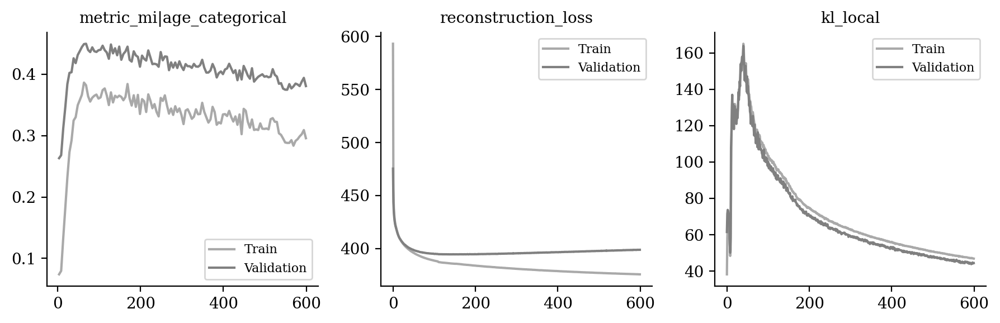

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_training").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

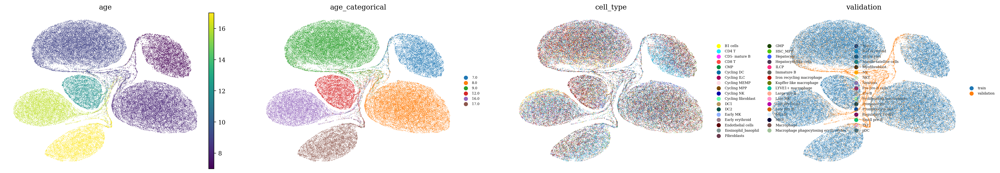

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

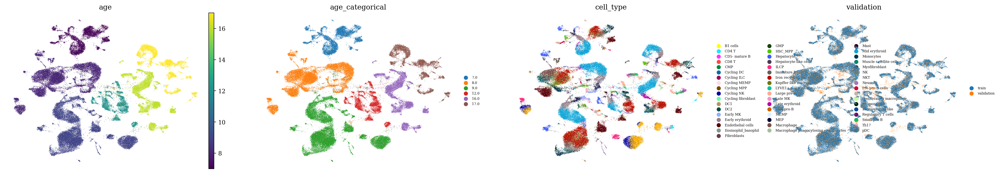

In [15]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

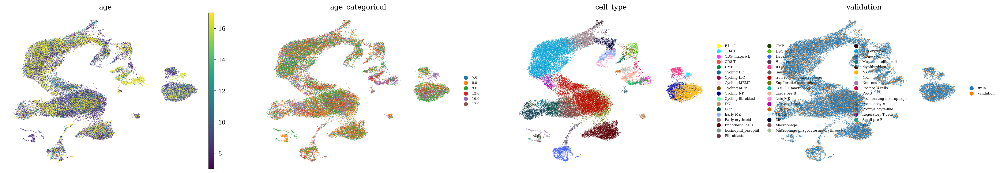

In [16]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )